# Space News Clustering - Topic Modelling

## Data Preprocessing

In [ ]:
!pip install hdbscan

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.2/4.2 MB 17.2 MB/s eta 0:00:00


In [ ]:
# import libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import string
import seaborn as sns
import hdbscan
import nltk
import pickle

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import AffinityPropagation
from sklearn.cluster import MeanShift
from sklearn.cluster import SpectralClustering
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import DBSCAN
from sklearn.cluster import OPTICS
from sklearn.cluster import Birch
from sklearn.metrics import silhouette_score
from sklearn.manifold import TSNE
from wordcloud import WordCloud
from sklearn.decomposition import TruncatedSVD
from nltk.stem import PorterStemmer, WordNetLemmatizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans

### Retrieve data

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

# reading data csv
file_path = '/content/drive/MyDrive/ML/spacenews.csv'
df = pd.read_csv(file_path)
print(df.head())

Mounted at /content/drive
                                               title  \
0  Electron launches first NASA PREFIRE Earth sci...   
1  Space Development Agency to procure dedicated ...   
2  Bringing generative artificial intelligence to...   
3  SpaceX sets early June launch of next Starship...   
4  NASA and Boeing moving ahead with Starliner te...   

                                                 url  \
0  https://spacenews.com/electron-launches-first-...   
1  https://spacenews.com/space-development-agency...   
2  https://spacenews.com/bringing-generative-arti...   
3  https://spacenews.com/spacex-sets-early-june-l...   
4  https://spacenews.com/nasa-and-boeing-moving-a...   

                                             content         author  \
0  LOS ANGELES — Rocket Lab launched the first of...     Jeff Foust   
1  WASHINGTON —  T he Space Development Agency (S...   Sandra Erwin   
2  TAMPA, Fla. — Amazon Web Services is busy posi...  Jason Rainbow   
3  LOS ANGELES —

In [ ]:
df.count()

,0
title,20716
url,20716
content,20551
author,20716
date,20716
postexcerpt,18196


### Preprocessing

In [ ]:
# Print the count of null values
print(df.isnull().sum())

title             0
url               0
content         165
author            0
date              0
postexcerpt    2520
dtype: int64


In [ ]:
# Check null values
df = df.dropna()
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 18032 entries, 2383 to 20715
Data columns (total 6 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   title        18032 non-null  object
 1   url          18032 non-null  object
 2   content      18032 non-null  object
 3   author       18032 non-null  object
 4   date         18032 non-null  object
 5   postexcerpt  18032 non-null  object
dtypes: object(6)
memory usage: 986.1+ KB


In [ ]:
# Remove duplicate rows
df = df.drop_duplicates()
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 18032 entries, 2383 to 20715
Data columns (total 6 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   title        18032 non-null  object
 1   url          18032 non-null  object
 2   content      18032 non-null  object
 3   author       18032 non-null  object
 4   date         18032 non-null  object
 5   postexcerpt  18032 non-null  object
dtypes: object(6)
memory usage: 986.1+ KB


Dealing with Date Format


In [ ]:
df['date'] = pd.to_datetime(df['date'], format='%B %d, %Y')
df['date'] = df['date'].dt.strftime('%Y-%m-%d')
df['date'] = pd.to_datetime(df['date'], format='%Y-%m-%d')

In [ ]:
df

,title,url,content,author,date,postexcerpt
2383,Orion splashes down to end Artemis 1,https://spacenews.com/orion-splashes-down-to-e...,Updated at 5:45 p.m. Eastern after post-splash...,Jeff Foust,2022-12-11,Fifty years to the day after the last Apollo m...
2384,Polaris Dawn crewed mission could suffer addit...,https://spacenews.com/polaris-dawn-crewed-miss...,LAS VEGAS — A billionaire-backed private astro...,Jeff Foust,2022-10-25,A billionaire-backed private astronaut mission...
2385,DART on track for asteroid collision,https://spacenews.com/dart-on-track-for-astero...,WASHINGTON — A NASA spacecraft is on course to...,Jeff Foust,2022-09-25,A NASA spacecraft is on course to deliberately...
2386,U.S. Space Command calls for investment in tec...,https://spacenews.com/u-s-space-command-calls-...,"WASHINGTON — Lt. Gen. John Shaw, deputy comman...",Sandra Erwin,2022-08-31,U.S. Space Command's Lt. Gen. John Shaw said '...
2387,SpaceX requests permission for direct-to-smart...,https://spacenews.com/spacex-requests-permissi...,"TAMPA, Fla. — SpaceX could provide “full and c...",Jason Rainbow,2022-12-08,SpaceX could provide “full and continuous” dir...
...,...,...,...,...,...,...
20711,Kendall lays out Pentagon thinking on future s...,https://spacenews.com/frank-kendall-at-wsbr/,"\nFrank Kendall, the Pentagon’s top acquisitio...",SpaceNews Staff,2016-02-25,"Frank Kendall, the Pentagon’s top acquisition ..."
20712,A larger share of NOAA’s declining space budge...,https://spacenews.com/a-larger-share-of-noaas-...,Updated Feb. 10 at 10:18 p.m. Eastern The U.S....,Debra Werner,2016-02-10,The U.S. National Oceanic and Atmospheric Admi...
20713,Think Tank Turns Its Attention To Mars As 2016...,https://spacenews.com/think-tank-turns-its-att...,WASHINGTON — As NASA develops a long-term stra...,Jeff Foust,2015-06-11,As NASA develops a long-term strategy to suppo...
20714,House Bill Leaves Last Three JPSS Satellites i...,https://spacenews.com/no-money-for-noaa-weathe...,WASHINGTON — A spending bill the House passed ...,Dan Leone,2015-06-04,A spending bill the House passed June 3 would ...


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 18032 entries, 2383 to 20715
Data columns (total 6 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   title        18032 non-null  object        
 1   url          18032 non-null  object        
 2   content      18032 non-null  object        
 3   author       18032 non-null  object        
 4   date         18032 non-null  datetime64[ns]
 5   postexcerpt  18032 non-null  object        
dtypes: datetime64[ns](1), object(5)
memory usage: 986.1+ KB


In [ ]:
# Separate the date into year, month and day columns

df['year'] = df['date'].dt.year
df['month'] = df['date'].dt.month
df['day'] = df['date'].dt.day
df

,title,url,content,author,date,postexcerpt,year,month,day
2383,Orion splashes down to end Artemis 1,https://spacenews.com/orion-splashes-down-to-e...,Updated at 5:45 p.m. Eastern after post-splash...,Jeff Foust,2022-12-11,Fifty years to the day after the last Apollo m...,2022,12,11
2384,Polaris Dawn crewed mission could suffer addit...,https://spacenews.com/polaris-dawn-crewed-miss...,LAS VEGAS — A billionaire-backed private astro...,Jeff Foust,2022-10-25,A billionaire-backed private astronaut mission...,2022,10,25
2385,DART on track for asteroid collision,https://spacenews.com/dart-on-track-for-astero...,WASHINGTON — A NASA spacecraft is on course to...,Jeff Foust,2022-09-25,A NASA spacecraft is on course to deliberately...,2022,9,25
2386,U.S. Space Command calls for investment in tec...,https://spacenews.com/u-s-space-command-calls-...,"WASHINGTON — Lt. Gen. John Shaw, deputy comman...",Sandra Erwin,2022-08-31,U.S. Space Command's Lt. Gen. John Shaw said '...,2022,8,31
2387,SpaceX requests permission for direct-to-smart...,https://spacenews.com/spacex-requests-permissi...,"TAMPA, Fla. — SpaceX could provide “full and c...",Jason Rainbow,2022-12-08,SpaceX could provide “full and continuous” dir...,2022,12,8
...,...,...,...,...,...,...,...,...,...
20711,Kendall lays out Pentagon thinking on future s...,https://spacenews.com/frank-kendall-at-wsbr/,"\nFrank Kendall, the Pentagon’s top acquisitio...",SpaceNews Staff,2016-02-25,"Frank Kendall, the Pentagon’s top acquisition ...",2016,2,25
20712,A larger share of NOAA’s declining space budge...,https://spacenews.com/a-larger-share-of-noaas-...,Updated Feb. 10 at 10:18 p.m. Eastern The U.S....,Debra Werner,2016-02-10,The U.S. National Oceanic and Atmospheric Admi...,2016,2,10
20713,Think Tank Turns Its Attention To Mars As 2016...,https://spacenews.com/think-tank-turns-its-att...,WASHINGTON — As NASA develops a long-term stra...,Jeff Foust,2015-06-11,As NASA develops a long-term strategy to suppo...,2015,6,11
20714,House Bill Leaves Last Three JPSS Satellites i...,https://spacenews.com/no-money-for-noaa-weathe...,WASHINGTON — A spending bill the House passed ...,Dan Leone,2015-06-04,A spending bill the House passed June 3 would ...,2015,6,4


### Feature Engineering

Dropping Unwanted Columns (url)

In [ ]:
df = df.drop(columns=['url'])
df

,title,content,author,date,postexcerpt,year,month,day
2383,Orion splashes down to end Artemis 1,Updated at 5:45 p.m. Eastern after post-splash...,Jeff Foust,2022-12-11,Fifty years to the day after the last Apollo m...,2022,12,11
2384,Polaris Dawn crewed mission could suffer addit...,LAS VEGAS — A billionaire-backed private astro...,Jeff Foust,2022-10-25,A billionaire-backed private astronaut mission...,2022,10,25
2385,DART on track for asteroid collision,WASHINGTON — A NASA spacecraft is on course to...,Jeff Foust,2022-09-25,A NASA spacecraft is on course to deliberately...,2022,9,25
2386,U.S. Space Command calls for investment in tec...,"WASHINGTON — Lt. Gen. John Shaw, deputy comman...",Sandra Erwin,2022-08-31,U.S. Space Command's Lt. Gen. John Shaw said '...,2022,8,31
2387,SpaceX requests permission for direct-to-smart...,"TAMPA, Fla. — SpaceX could provide “full and c...",Jason Rainbow,2022-12-08,SpaceX could provide “full and continuous” dir...,2022,12,8
...,...,...,...,...,...,...,...,...
20711,Kendall lays out Pentagon thinking on future s...,"\nFrank Kendall, the Pentagon’s top acquisitio...",SpaceNews Staff,2016-02-25,"Frank Kendall, the Pentagon’s top acquisition ...",2016,2,25
20712,A larger share of NOAA’s declining space budge...,Updated Feb. 10 at 10:18 p.m. Eastern The U.S....,Debra Werner,2016-02-10,The U.S. National Oceanic and Atmospheric Admi...,2016,2,10
20713,Think Tank Turns Its Attention To Mars As 2016...,WASHINGTON — As NASA develops a long-term stra...,Jeff Foust,2015-06-11,As NASA develops a long-term strategy to suppo...,2015,6,11
20714,House Bill Leaves Last Three JPSS Satellites i...,WASHINGTON — A spending bill the House passed ...,Dan Leone,2015-06-04,A spending bill the House passed June 3 would ...,2015,6,4


Combining postexcerpt and content

In [ ]:
df['content'] = df['title'] + ' ' + df['postexcerpt']
df

,title,content,author,date,postexcerpt,year,month,day
2383,Orion splashes down to end Artemis 1,Orion splashes down to end Artemis 1 Fifty yea...,Jeff Foust,2022-12-11,Fifty years to the day after the last Apollo m...,2022,12,11
2384,Polaris Dawn crewed mission could suffer addit...,Polaris Dawn crewed mission could suffer addit...,Jeff Foust,2022-10-25,A billionaire-backed private astronaut mission...,2022,10,25
2385,DART on track for asteroid collision,DART on track for asteroid collision A NASA sp...,Jeff Foust,2022-09-25,A NASA spacecraft is on course to deliberately...,2022,9,25
2386,U.S. Space Command calls for investment in tec...,U.S. Space Command calls for investment in tec...,Sandra Erwin,2022-08-31,U.S. Space Command's Lt. Gen. John Shaw said '...,2022,8,31
2387,SpaceX requests permission for direct-to-smart...,SpaceX requests permission for direct-to-smart...,Jason Rainbow,2022-12-08,SpaceX could provide “full and continuous” dir...,2022,12,8
...,...,...,...,...,...,...,...,...
20711,Kendall lays out Pentagon thinking on future s...,Kendall lays out Pentagon thinking on future s...,SpaceNews Staff,2016-02-25,"Frank Kendall, the Pentagon’s top acquisition ...",2016,2,25
20712,A larger share of NOAA’s declining space budge...,A larger share of NOAA’s declining space budge...,Debra Werner,2016-02-10,The U.S. National Oceanic and Atmospheric Admi...,2016,2,10
20713,Think Tank Turns Its Attention To Mars As 2016...,Think Tank Turns Its Attention To Mars As 2016...,Jeff Foust,2015-06-11,As NASA develops a long-term strategy to suppo...,2015,6,11
20714,House Bill Leaves Last Three JPSS Satellites i...,House Bill Leaves Last Three JPSS Satellites i...,Dan Leone,2015-06-04,A spending bill the House passed June 3 would ...,2015,6,4


### Lowercasing

In [ ]:
# Lowercase the words in 'content' columns
df['content'] = df['content'].str.lower()
df

,title,content,author,date,postexcerpt,year,month,day
2383,Orion splashes down to end Artemis 1,orion splashes down to end artemis 1 fifty yea...,Jeff Foust,2022-12-11,Fifty years to the day after the last Apollo m...,2022,12,11
2384,Polaris Dawn crewed mission could suffer addit...,polaris dawn crewed mission could suffer addit...,Jeff Foust,2022-10-25,A billionaire-backed private astronaut mission...,2022,10,25
2385,DART on track for asteroid collision,dart on track for asteroid collision a nasa sp...,Jeff Foust,2022-09-25,A NASA spacecraft is on course to deliberately...,2022,9,25
2386,U.S. Space Command calls for investment in tec...,u.s. space command calls for investment in tec...,Sandra Erwin,2022-08-31,U.S. Space Command's Lt. Gen. John Shaw said '...,2022,8,31
2387,SpaceX requests permission for direct-to-smart...,spacex requests permission for direct-to-smart...,Jason Rainbow,2022-12-08,SpaceX could provide “full and continuous” dir...,2022,12,8
...,...,...,...,...,...,...,...,...
20711,Kendall lays out Pentagon thinking on future s...,kendall lays out pentagon thinking on future s...,SpaceNews Staff,2016-02-25,"Frank Kendall, the Pentagon’s top acquisition ...",2016,2,25
20712,A larger share of NOAA’s declining space budge...,a larger share of noaa’s declining space budge...,Debra Werner,2016-02-10,The U.S. National Oceanic and Atmospheric Admi...,2016,2,10
20713,Think Tank Turns Its Attention To Mars As 2016...,think tank turns its attention to mars as 2016...,Jeff Foust,2015-06-11,As NASA develops a long-term strategy to suppo...,2015,6,11
20714,House Bill Leaves Last Three JPSS Satellites i...,house bill leaves last three jpss satellites i...,Dan Leone,2015-06-04,A spending bill the House passed June 3 would ...,2015,6,4


In [ ]:
# Remove all punctuation from the 'content' column
df['content'] = df['content'].str.translate(str.maketrans('', '', string.punctuation))

# Remove specific characters (e.g., fancy quotes, digits, underscores, and hyphens) from the 'content' column
df['content'] = df['content'].str.replace(r"[‘’”“'•…—0-9_-]", "", regex=True)

In [ ]:
# Remove all punctuation from the 'title' column
df['title'] = df['title'].str.translate(str.maketrans('', '', string.punctuation))

# Remove specific characters (e.g., fancy quotes, digits, underscores, and hyphens) from the 'content' column
df['title'] = df['title'].str.replace(r"[‘’”“'/•…—0-9_-]", "", regex=True)

In [ ]:
df['content']

,content
2383,orion splashes down to end artemis fifty year...
2384,polaris dawn crewed mission could suffer addit...
2385,dart on track for asteroid collision a nasa sp...
2386,us space command calls for investment in techn...
2387,spacex requests permission for directtosmartph...
...,...
20711,kendall lays out pentagon thinking on future s...
20712,a larger share of noaas declining space budget...
20713,think tank turns its attention to mars as ele...
20714,house bill leaves last three jpss satellites i...


In [ ]:
df['title']

,title
2383,Orion splashes down to end Artemis
2384,Polaris Dawn crewed mission could suffer addit...
2385,DART on track for asteroid collision
2386,US Space Command calls for investment in techn...
2387,SpaceX requests permission for directtosmartph...
...,...
20711,Kendall lays out Pentagon thinking on future s...
20712,A larger share of NOAAs declining space budget...
20713,Think Tank Turns Its Attention To Mars As Ele...
20714,House Bill Leaves Last Three JPSS Satellites i...


### Tokenization

In [ ]:
from nltk.tokenize import word_tokenize
import nltk
nltk.download('punkt')

df['tokens'] = df['content'].apply(word_tokenize)

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


In [ ]:
from nltk.corpus import stopwords
nltk.download('stopwords')
stop_words = set(stopwords.words('english'))

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


Removing Stopwords

In [ ]:
df['tokens_removed_stopwords'] = df['tokens'].apply(lambda x: [word for word in x if word not in stop_words])

In [ ]:
print(df[['tokens', 'tokens_removed_stopwords']])

                                                  tokens  \
2383   [orion, splashes, down, to, end, artemis, fift...   
2384   [polaris, dawn, crewed, mission, could, suffer...   
2385   [dart, on, track, for, asteroid, collision, a,...   
2386   [us, space, command, calls, for, investment, i...   
2387   [spacex, requests, permission, for, directtosm...   
...                                                  ...   
20711  [kendall, lays, out, pentagon, thinking, on, f...   
20712  [a, larger, share, of, noaas, declining, space...   
20713  [think, tank, turns, its, attention, to, mars,...   
20714  [house, bill, leaves, last, three, jpss, satel...   
20715  [championing, a, climate, change, for, commerc...   

                                tokens_removed_stopwords  
2383   [orion, splashes, end, artemis, fifty, years, ...  
2384   [polaris, dawn, crewed, mission, could, suffer...  
2385   [dart, track, asteroid, collision, nasa, space...  
2386   [us, space, command, calls, investme

In [ ]:
from collections import Counter

# Create a list of all tokens by combining tokens from all rows in the 'tokens_removed_stopwords' column
all_tokens = [token for tokens in df['tokens_removed_stopwords'] for token in tokens]

# Count how often each token appears in the list
token_freq = Counter(all_tokens)

# Convert the token counts into a DataFrame with columns 'Token' and 'Frequency'
token_freq_df = pd.DataFrame(token_freq.items(), columns=['Token', 'Frequency'])

# Sort the DataFrame so the most common tokens are at the top
token_freq_df = token_freq_df.sort_values(by='Frequency', ascending=False)

# Print the top 10 most frequent tokens
print(token_freq_df.head(10))

# Save the token frequencies to a CSV file
file_path = 'token_frequencies.csv'
token_freq_df.to_csv(file_path, index=False)

          Token  Frequency
63        space      12734
114   satellite       6796
131      launch       6610
50         nasa       4684
62           us       4519
95   satellites       3260
175         new       3175
302       force       2956
265  commercial       2728
75         said       2727


Lemmatization

In [ ]:
import nltk
nltk.download('wordnet')
lemmatizer = WordNetLemmatizer()
df['tokens_lemmatized'] = df['tokens_removed_stopwords'].apply(lambda x: [lemmatizer.lemmatize(word) for word in x])

[nltk_data] Downloading package wordnet to /root/nltk_data...


In [ ]:
df['lemmatized_str'] = df['tokens_removed_stopwords'].apply(lambda tokens: ' '.join([lemmatizer.lemmatize(word) for word in tokens]))

In [ ]:
df

,title,content,author,date,postexcerpt,year,month,day,tokens,tokens_removed_stopwords,tokens_lemmatized,lemmatized_str
2383,Orion splashes down to end Artemis,orion splashes down to end artemis fifty year...,Jeff Foust,2022-12-11,Fifty years to the day after the last Apollo m...,2022,12,11,"[orion, splashes, down, to, end, artemis, fift...","[orion, splashes, end, artemis, fifty, years, ...","[orion, splash, end, artemis, fifty, year, day...",orion splash end artemis fifty year day last a...
2384,Polaris Dawn crewed mission could suffer addit...,polaris dawn crewed mission could suffer addit...,Jeff Foust,2022-10-25,A billionaire-backed private astronaut mission...,2022,10,25,"[polaris, dawn, crewed, mission, could, suffer...","[polaris, dawn, crewed, mission, could, suffer...","[polaris, dawn, crewed, mission, could, suffer...",polaris dawn crewed mission could suffer addit...
2385,DART on track for asteroid collision,dart on track for asteroid collision a nasa sp...,Jeff Foust,2022-09-25,A NASA spacecraft is on course to deliberately...,2022,9,25,"[dart, on, track, for, asteroid, collision, a,...","[dart, track, asteroid, collision, nasa, space...","[dart, track, asteroid, collision, nasa, space...",dart track asteroid collision nasa spacecraft ...
2386,US Space Command calls for investment in techn...,us space command calls for investment in techn...,Sandra Erwin,2022-08-31,U.S. Space Command's Lt. Gen. John Shaw said '...,2022,8,31,"[us, space, command, calls, for, investment, i...","[us, space, command, calls, investment, techno...","[u, space, command, call, investment, technolo...",u space command call investment technology dee...
2387,SpaceX requests permission for directtosmartph...,spacex requests permission for directtosmartph...,Jason Rainbow,2022-12-08,SpaceX could provide “full and continuous” dir...,2022,12,8,"[spacex, requests, permission, for, directtosm...","[spacex, requests, permission, directtosmartph...","[spacex, request, permission, directtosmartpho...",spacex request permission directtosmartphone s...
...,...,...,...,...,...,...,...,...,...,...,...,...
20711,Kendall lays out Pentagon thinking on future s...,kendall lays out pentagon thinking on future s...,SpaceNews Staff,2016-02-25,"Frank Kendall, the Pentagon’s top acquisition ...",2016,2,25,"[kendall, lays, out, pentagon, thinking, on, f...","[kendall, lays, pentagon, thinking, future, sp...","[kendall, lay, pentagon, thinking, future, spa...",kendall lay pentagon thinking future space pro...
20712,A larger share of NOAAs declining space budget...,a larger share of noaas declining space budget...,Debra Werner,2016-02-10,The U.S. National Oceanic and Atmospheric Admi...,2016,2,10,"[a, larger, share, of, noaas, declining, space...","[larger, share, noaas, declining, space, budge...","[larger, share, noaa, declining, space, budget...",larger share noaa declining space budget would...
20713,Think Tank Turns Its Attention To Mars As Ele...,think tank turns its attention to mars as ele...,Jeff Foust,2015-06-11,As NASA develops a long-term strategy to suppo...,2015,6,11,"[think, tank, turns, its, attention, to, mars,...","[think, tank, turns, attention, mars, election...","[think, tank, turn, attention, mar, election, ...",think tank turn attention mar election loom na...
20714,House Bill Leaves Last Three JPSS Satellites i...,house bill leaves last three jpss satellites i...,Dan Leone,2015-06-04,A spending bill the House passed June 3 would ...,2015,6,4,"[house, bill, leaves, last, three, jpss, satel...","[house, bill, leaves, last, three, jpss, satel...","[house, bill, leaf, last, three, jpss, satelli...",house bill leaf last three jpss satellite lurc...


In [ ]:
df_clustering_ready = df[['date', 'year', 'month', 'day', 'author', 'title','content', 'tokens_lemmatized','lemmatized_str']]

# Save the preprocessed DataFrame to a new CSV file
file_path_preprocessed = 'Preprocessed_SpaceNews_Dataset.csv'
df_clustering_ready.to_csv(file_path_preprocessed, index=False)

print(f"Preprocessed dataset saved to {file_path_preprocessed}")

Preprocessed dataset saved to Preprocessed_SpaceNews_Dataset.csv


# Exploratory Data Analysis (EDA)

In [ ]:
import pandas as pd

# Load preprocessed dataset
df_preprocessed = pd.read_csv('/content/drive/MyDrive/ML/Preprocessed_SpaceNews_Dataset.csv')

# Basic summary of preprocessed data
print("Preprocessed Data Summary:")
print(df_preprocessed.info())

# Descriptive statistics for numerical columns
print("\nDescriptive Statistics:")
print(df_preprocessed.describe())

Preprocessed Data Summary:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8361 entries, 0 to 8360
Data columns (total 12 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   title                     8361 non-null   object
 1   content                   8361 non-null   object
 2   author                    8361 non-null   object
 3   date                      8361 non-null   object
 4   postexcerpt               8361 non-null   object
 5   year                      8361 non-null   int64 
 6   month                     8361 non-null   int64 
 7   day                       8361 non-null   int64 
 8   tokens                    8361 non-null   object
 9   tokens_removed_stopwords  8361 non-null   object
 10  tokens_lemmatized         8361 non-null   object
 11  lemmatized_str            8361 non-null   object
dtypes: int64(3), object(9)
memory usage: 784.0+ KB
None

Descriptive Statistics:
              year        mo

### Time-Based Analysis

This section analyzes the distribution of news over time.

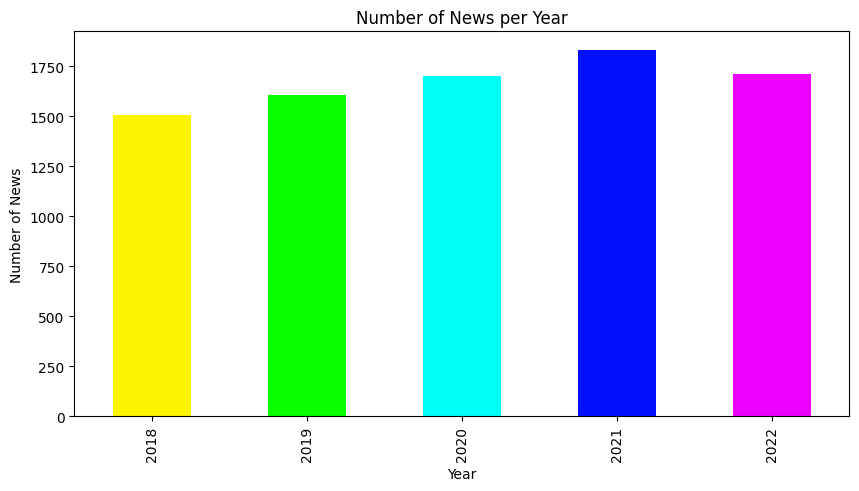

In [ ]:
import matplotlib.pyplot as plt

# Create a complete range of years from the minimum to the maximum year in your dataset
all_years = pd.Series(range(df_preprocessed['year'].min(), df_preprocessed['year'].max() + 1))

# Count the number of articles per year and reindex to include all years, filling missing years with 0
year_counts = df_preprocessed['year'].value_counts().reindex(all_years, fill_value=0)

# Generate colors using Seaborn's "hsv" palette
colors = sns.color_palette("hsv", len(all_years))

# Plotting the number of news by year with custom colors
plt.figure(figsize=(10, 5))
year_counts.sort_index().plot(kind='bar', color=colors, title='Number of News per Year')
plt.xlabel('Year')
plt.ylabel('Number of News')
plt.show()

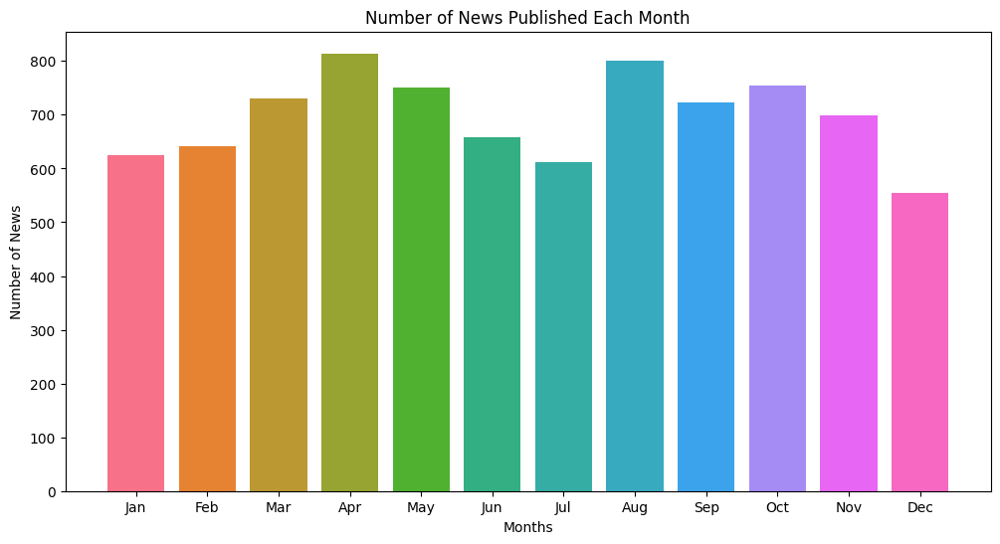

In [ ]:
plt.figure(figsize=(12, 6))
months = df_preprocessed['month'].unique()
colors = sns.color_palette("husl", len(months))
month_counts = df_preprocessed.groupby('month').size()
plt.bar(month_counts.index, month_counts.values, color=colors)
plt.title('Number of News Published Each Month')
plt.xlabel('Months')
plt.ylabel('Number of News')
plt.xticks(months, labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.show()

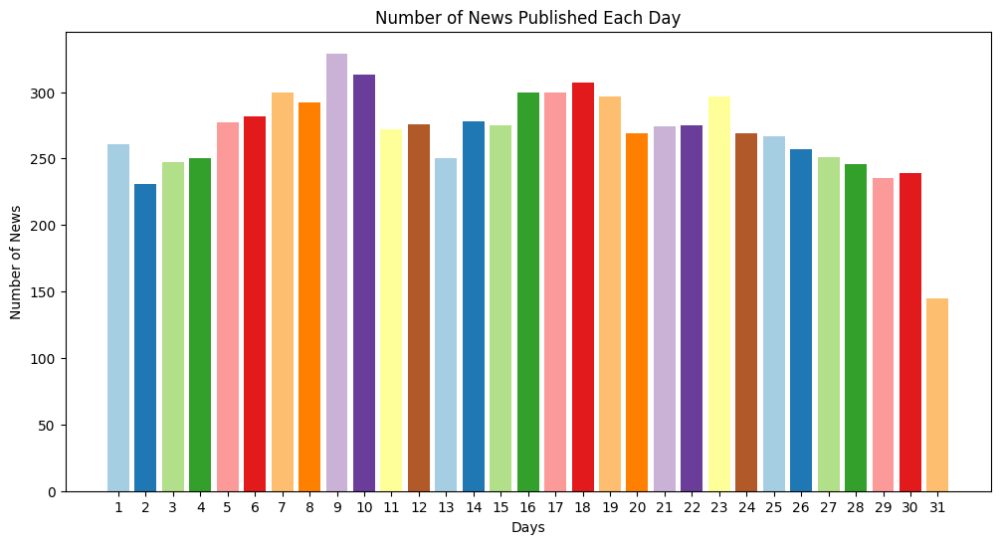

In [ ]:
plt.figure(figsize=(12, 6))
days = df_preprocessed['day'].unique()
colors = sns.color_palette("Paired", len(days))
day_counts = df_preprocessed.groupby('day').size()
plt.bar(day_counts.index, day_counts.values, color=colors)
plt.title('Number of News Published Each Day')
plt.xlabel('Days')
plt.ylabel('Number of News')
plt.xticks(days)
plt.show()

### News Title's Word Frequency Analysis

This section analyzes the frequency of words across all news's title.

<ipython-input-39-02f29b9eef68>:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Word', y='Count', data=title_df, palette='Blues_d')


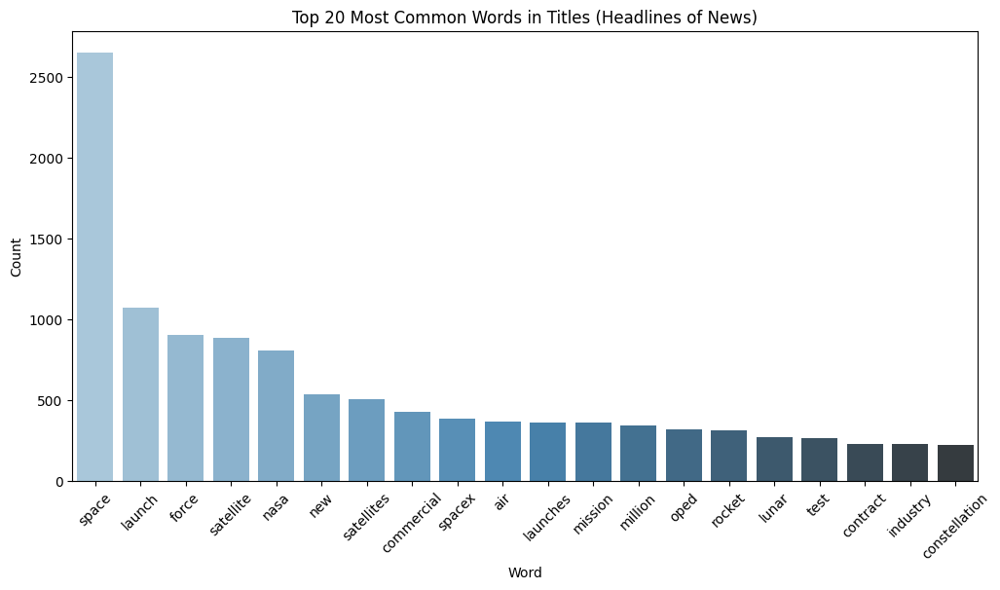

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer

# Vectorizing titles to find common words
count_vectorizer = CountVectorizer(stop_words='english', max_features=20)
title_matrix = count_vectorizer.fit_transform(df_preprocessed['title'])

# Sum up the counts of each word
title_counts = title_matrix.sum(axis=0).A1
title_words = count_vectorizer.get_feature_names_out()

# Create a DataFrame for easy plotting
title_df = pd.DataFrame({'Word': title_words, 'Count': title_counts})
title_df = title_df.sort_values(by='Count', ascending=False)

# Plotting
plt.figure(figsize=(12, 6))
sns.barplot(x='Word', y='Count', data=title_df, palette='Blues_d')
plt.title('Top 20 Most Common Words in Content')
plt.xlabel('Word')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()

### Content's Word Frequency Analysis

This section analyzes the frequency of words across all news's content.

In [ ]:
from collections import Counter
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Load preprocessed dataset
df_clustering_ready = pd.read_csv('Preprocessed_SpaceNews_Dataset.csv')

# Create a list of all tokens (lemmatized) from the 'tokens_lemmatized' column
all_tokens_lemmatized = [word for tokens in df_clustering_ready['tokens_lemmatized'].dropna().apply(eval) for word in tokens]

# Count the frequency of each word
word_freq_lemmatized = Counter(all_tokens_lemmatized)
common_words_lemmatized = word_freq_lemmatized.most_common(20)

# Convert to DataFrame for better visualization
word_freq_df_lemmatized = pd.DataFrame(common_words_lemmatized, columns=['Word', 'Frequency'])

# Plotting the most common words
plt.figure(figsize=(10, 5))
sns.barplot(x='Frequency', y='Word', data=word_freq_df_lemmatized)
plt.title('Most Common Words (Content)')
plt.show()


FileNotFoundError: [Errno 2] No such file or directory: 'Preprocessed_SpaceNews_Dataset.csv'

### Word Cloud Visualization

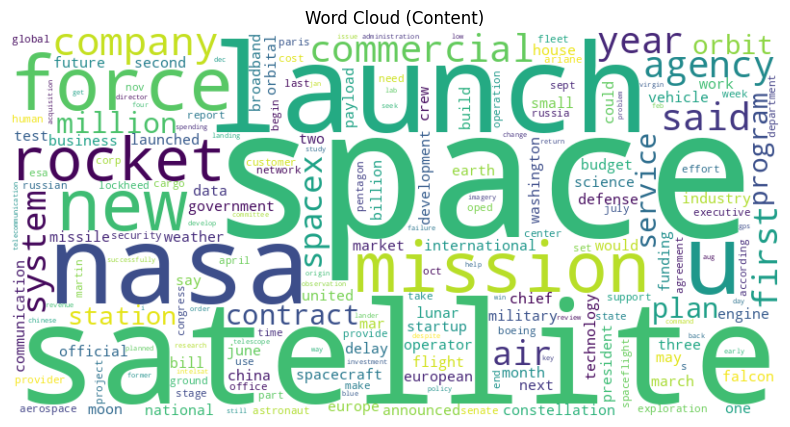

In [ ]:
from wordcloud import WordCloud

# Generate word cloud from word frequencies
wordcloud_lemmatized = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(word_freq_lemmatized)

# Plot the word cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud_lemmatized, interpolation="bilinear")
plt.axis("off")
plt.title('Word Cloud (Content)')
plt.show()

-- Analyzing Top Nouns and Verbs in News Headlines --

In [ ]:
!python -m spacy download en_core_web_sm

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.8/12.8 MB 49.5 MB/s eta 0:00:00
✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_sm')
⚠ Restart to reload dependencies
If you are in a Jupyter or Colab notebook, you may need to restart Python in
order to load all the package's dependencies. You can do this by selecting the
'Restart kernel' or 'Restart runtime' option.


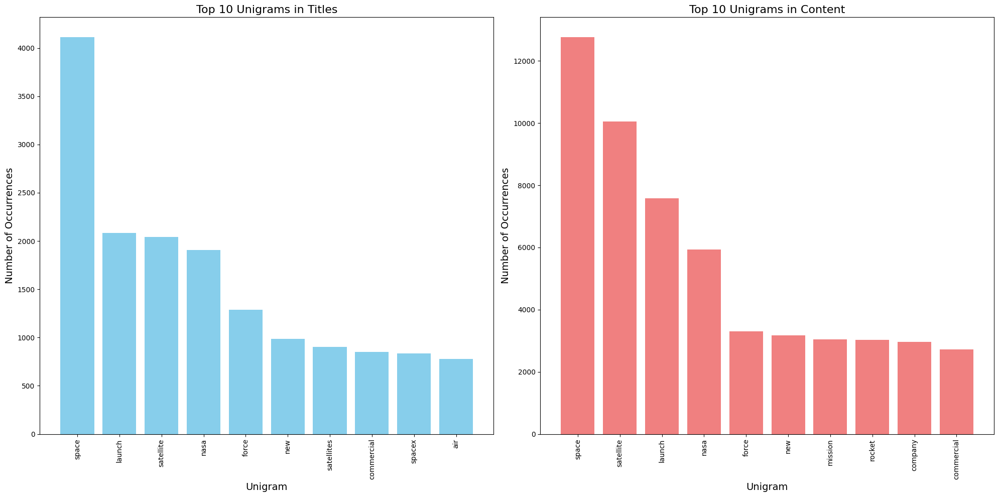

In [ ]:
import warnings
warnings.filterwarnings("ignore")

from sklearn.feature_extraction.text import CountVectorizer
import numpy as np
import matplotlib.pyplot as plt

def get_top_n_ngrams(n_top_ngrams, count_vectorizer, text_data, ngram_range):
    # Update the CountVectorizer to the specified ngram range
    count_vectorizer.ngram_range = ngram_range

    # Fit and transform the text data
    vectorized_text = count_vectorizer.fit_transform(text_data)
    vectorized_total = np.sum(vectorized_text, axis=0)

    # Sort the n-grams by frequency
    ngram_indices = np.flip(np.argsort(vectorized_total)[0, :], 1)
    ngram_values = np.flip(np.sort(vectorized_total)[0, :], 1)

    # Create a matrix to store the top n n-grams
    ngram_vectors = np.zeros((n_top_ngrams, vectorized_text.shape[1]))
    for i in range(n_top_ngrams):
        ngram_vectors[i, ngram_indices[0, i]] = 1

    # Decode the n-grams and return them with their counts
    ngrams = [' '.join(ngram) for ngram in count_vectorizer.inverse_transform(ngram_vectors)]

    return (ngrams, ngram_values[0, :n_top_ngrams].tolist()[0])

# Define the CountVectorizer with stop words removed
count_vectorizer = CountVectorizer(stop_words='english')

# Get top 10 unigrams from the 'title' column
unigrams_title, unigram_values_title = get_top_n_ngrams(n_top_ngrams=10,
                                                        count_vectorizer=count_vectorizer,
                                                        text_data=df['title'],
                                                        ngram_range=(1, 1))

# Convert lists in 'tokens_lemmatized' column to strings by joining them with spaces
df['tokens_lemmatized'] = df['tokens_lemmatized'].apply(lambda x: ' '.join(x) if isinstance(x, list) else x)

# Get top 10 unigrams from the 'tokens_lemmatized' column
unigrams_content, unigram_values_content = get_top_n_ngrams(n_top_ngrams=10,
                                                            count_vectorizer=count_vectorizer,
                                                            text_data=df['tokens_lemmatized'],
                                                            ngram_range=(1, 1))

# Plotting unigrams
plt.figure(figsize=(20, 10))

# Plot for titles
plt.subplot(1, 2, 1)
plt.bar(range(len(unigrams_title)), unigram_values_title, color='skyblue')
plt.xticks(range(len(unigrams_title)), unigrams_title, rotation='vertical')
plt.title('Top 10 Unigrams in Titles', fontsize=16)
plt.xlabel('Unigram', fontsize=14)
plt.ylabel('Number of Occurrences', fontsize=14)

# Plot for content
plt.subplot(1, 2, 2)
plt.bar(range(len(unigrams_content)), unigram_values_content, color='lightcoral')
plt.xticks(range(len(unigrams_content)), unigrams_content, rotation='vertical')
plt.title('Top 10 Unigrams in Content', fontsize=16)
plt.xlabel('Unigram', fontsize=14)
plt.ylabel('Number of Occurrences', fontsize=14)

plt.tight_layout()
plt.show()


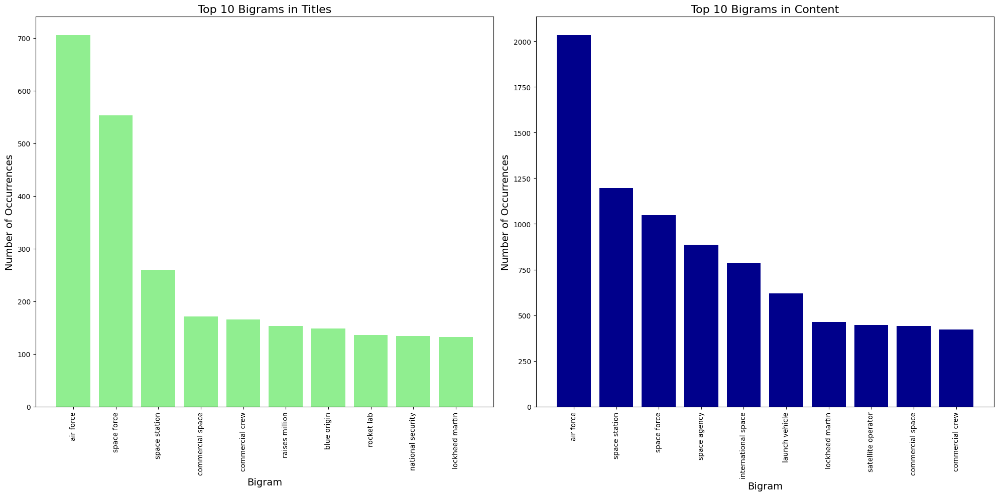

In [ ]:
# Get top 10 bigrams from the 'title' column
bigrams_title, bigram_values_title = get_top_n_ngrams(n_top_ngrams=10,
                                                      count_vectorizer=count_vectorizer,
                                                      text_data=df['title'],
                                                      ngram_range=(2, 2))

# Get top 10 bigrams from the 'tokens_lemmatized' column
bigrams_content, bigram_values_content = get_top_n_ngrams(n_top_ngrams=10,
                                                          count_vectorizer=count_vectorizer,
                                                          text_data=df['tokens_lemmatized'],
                                                          ngram_range=(2, 2))

# Plotting bigrams
plt.figure(figsize=(20, 10))

# Plot for titles
plt.subplot(1, 2, 1)
plt.bar(range(len(bigrams_title)), bigram_values_title, color='lightgreen')
plt.xticks(range(len(bigrams_title)), bigrams_title, rotation='vertical')
plt.title('Top 10 Bigrams in Titles', fontsize=16)
plt.xlabel('Bigram', fontsize=14)
plt.ylabel('Number of Occurrences', fontsize=14)

# Plot for content
plt.subplot(1, 2, 2)
plt.bar(range(len(bigrams_content)), bigram_values_content, color='darkblue')
plt.xticks(range(len(bigrams_content)), bigrams_content, rotation='vertical')
plt.title('Top 10 Bigrams in Content', fontsize=16)
plt.xlabel('Bigram', fontsize=14)
plt.ylabel('Number of Occurrences', fontsize=14)

plt.tight_layout()
plt.show()

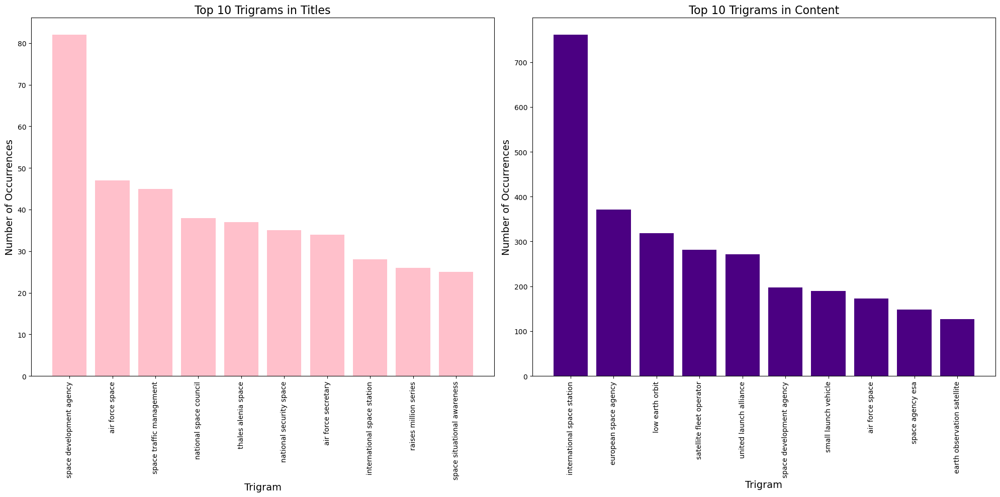

In [ ]:
# Get top 10 trigrams from the 'title' column
trigrams_title, trigram_values_title = get_top_n_ngrams(n_top_ngrams=10,
                                                        count_vectorizer=count_vectorizer,
                                                        text_data=df['title'],
                                                        ngram_range=(3, 3))

# Get top 10 trigrams from the 'tokens_lemmatized' column
trigrams_content, trigram_values_content = get_top_n_ngrams(n_top_ngrams=10,
                                                            count_vectorizer=count_vectorizer,
                                                            text_data=df['tokens_lemmatized'],
                                                            ngram_range=(3, 3))

# Plotting trigrams
plt.figure(figsize=(20, 10))

# Plot for titles
plt.subplot(1, 2, 1)
plt.bar(range(len(trigrams_title)), trigram_values_title, color='pink')
plt.xticks(range(len(trigrams_title)), trigrams_title, rotation='vertical')
plt.title('Top 10 Trigrams in Titles', fontsize=16)
plt.xlabel('Trigram', fontsize=14)
plt.ylabel('Number of Occurrences', fontsize=14)

# Plot for content
plt.subplot(1, 2, 2)
plt.bar(range(len(trigrams_content)), trigram_values_content, color='indigo')
plt.xticks(range(len(trigrams_content)), trigrams_content, rotation='vertical')
plt.title('Top 10 Trigrams in Content', fontsize=16)
plt.xlabel('Trigram', fontsize=14)
plt.ylabel('Number of Occurrences', fontsize=14)

plt.tight_layout()
plt.show()

### Exp : Since the News Title & Content Both Top Bigram is "air force" ,so we figure out the story behind the token "air force"

In [ ]:
import pandas as pd
import spacy

# Load the English language model
nlp = spacy.load("en_core_web_sm")

# Filter titles containing 'air force'
index_title = df['title'].str.contains(r'\bair\b.*\bforce\b', case=False, regex=True)
texts_title = df['title'].loc[index_title].tolist()

# Initialize lists for nouns and verbs (for titles)
nouns_title = []
verbs_title = []

# Process texts and extract nouns and verbs from titles
for doc in nlp.pipe(texts_title, n_process=16, batch_size=10000):
    for token in doc:
        if token.pos_ == "NOUN":
            nouns_title.append(token.text.lower())  # Normalize to lower case
        elif token.pos_ == "VERB":
            verbs_title.append(token.text.lower())  # Normalize to lower case

# Convert lists to Series for frequency counting (for titles)
noun_series_title = pd.Series(nouns_title).value_counts().head(10)
verb_series_title = pd.Series(verbs_title).value_counts().head(10)

# Filter content containing 'air force'
index_content = df['tokens_lemmatized'].str.contains(r'\bair\b.*\bforce\b', case=False, regex=True)
texts_content = df['tokens_lemmatized'].loc[index_content].tolist()

# Initialize lists for nouns and verbs (for content)
nouns_content = []
verbs_content = []

# Process texts and extract nouns and verbs from content
for doc in nlp.pipe(texts_content, n_process=16, batch_size=10000):
    for token in doc:
        if token.pos_ == "NOUN":
            nouns_content.append(token.text.lower())  # Normalize to lower case
        elif token.pos_ == "VERB":
            verbs_content.append(token.text.lower())  # Normalize to lower case

# Convert lists to Series for frequency counting (for content)
noun_series_content = pd.Series(nouns_content).value_counts().head(10)
verb_series_content = pd.Series(verbs_content).value_counts().head(10)

# Display the results side by side
print("Top Nouns in Titles Containing 'Air Force':")
print(noun_series_title)

print("\nTop Verbs in Titles Containing 'Air Force':")
print(verb_series_title)

print("\nTop Nouns in Content Containing 'Air Force':")
print(noun_series_content)

print("\nTop Verbs in Content Containing 'Air Force':")
print(verb_series_content)



Top Nouns in Titles Containing 'Air Force':
space             115
launch             68
satellite          52
contract           42
satellites         31
weather            23
procurement        19
rocket             17
communications     15
contracts          12
Name: count, dtype: int64

Top Verbs in Titles Containing 'Air Force':
wins        22
says        22
seeks       12
launch      11
wants        9
launches     8
takes        8
support      7
continue     6
begin        6
Name: count, dtype: int64

Top Nouns in Content Containing 'Air Force':
air          1384
force        1127
space        1099
satellite     748
launch        530
system        305
rocket        253
contract      243
service       230
program       176
Name: count, dtype: int64

Top Verbs in Content Containing 'Air Force':
said         212
spacex       103
say           96
announced     89
launched      76
awarded       71
launch        66
according     63
take          45
expected      42
Name: count, dtype: i

NameError: name 'title_nouns' is not defined

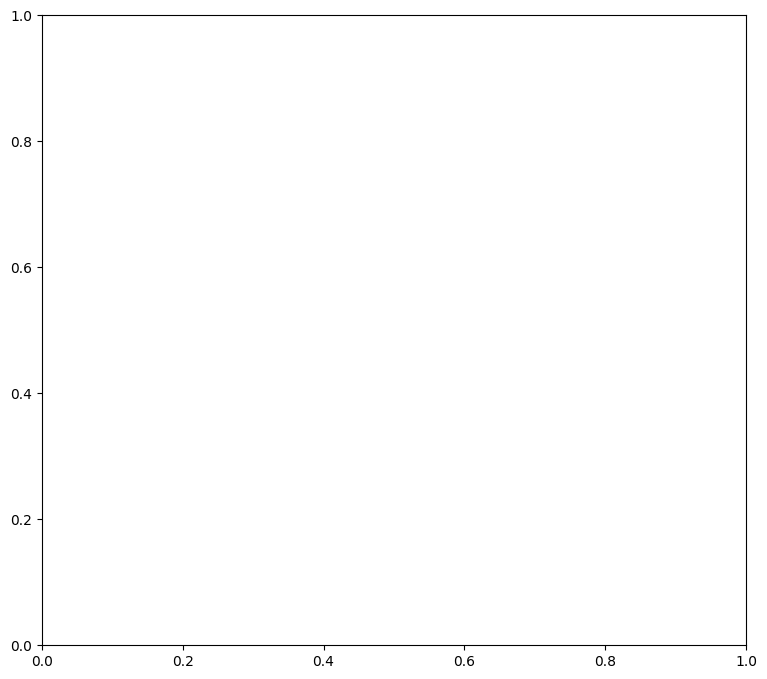

In [ ]:
# Plot top 10 nouns and verbs for 'Title'
plt.figure(figsize=(20, 18))

# Top 10 nouns in Titles
plt.subplot(2, 2, 1)
title_noun_series = title_nouns.value_counts().head(10)
title_noun_series.plot(kind='bar', colormap='Set1')
plt.title("Top 10 Nouns in Titles Containing 'Air Force'", fontsize=20)
plt.xticks(size=14, rotation=80)
plt.yticks(size=14)

# Top 10 nouns in Content
plt.subplot(2, 2, 2)
content_noun_series = tokens_nouns.value_counts().head(10)
content_noun_series.plot(kind='bar', colormap='Set1')
plt.title("Top 10 Nouns in Content Containing 'Air Force'", fontsize=20)
plt.xticks(size=14, rotation=80)
plt.yticks(size=14)


# Top 10 verbs in Titles
plt.subplot(2, 2, 3)
title_verb_series = title_verbs.value_counts().head(10)
title_verb_series.plot(kind='bar', colormap='Set2')
plt.title("Top 10 Verbs in Titles Containing 'Air Force'", fontsize=20)
plt.xticks(size=14, rotation=80)
plt.yticks(size=14)


# Top 10 verbs in Content
plt.subplot(2, 2, 4)
content_verb_series = tokens_verbs.value_counts().head(10)
content_verb_series.plot(kind='bar', colormap='Set2')
plt.title("Top 10 Verbs in Content Containing 'Air Force'", fontsize=20)
plt.xticks(size=14, rotation=80)
plt.yticks(size=14)

plt.tight_layout()
plt.show()

In [ ]:
df_preprocessed['title'].loc[index].tolist()[0:10]

NameError: name 'df_preprocessed' is not defined

In [ ]:
df_preprocessed['tokens_lemmatized'].loc[index].tolist()[0:10]

In [ ]:
df_preprocessed.head()

In [ ]:
avg_length = df_preprocessed['lemmatized_str'].apply(len).mean()

avg_length

198.72387976929903

In [ ]:
latest_year = df['year'].max()

cutoff_year = latest_year - 4

df_last_five_years = df[df['year'] >= cutoff_year]

df_preprocessed = df_last_five_years.sort_values(by='date')

df_preprocessed

,title,content,author,date,postexcerpt,year,month,day,tokens,tokens_removed_stopwords,tokens_lemmatized,lemmatized_str
10287,World View sees strong interest in stratospher...,world view sees strong interest in stratospher...,Jeff Foust,2018-01-02,"World View, a company offering stratospheric b...",2018,1,2,"[world, view, sees, strong, interest, in, stra...","[world, view, sees, strong, interest, stratosp...","[world, view, see, strong, interest, stratosph...",world view see strong interest stratospheric b...
10286,Sorry scifi fans real wars in space not the st...,sorry scifi fans real wars in space not the st...,Sandra Erwin,2018-01-02,Savvy space warriors like Russia’s military al...,2018,1,2,"[sorry, scifi, fans, real, wars, in, space, no...","[sorry, scifi, fans, real, wars, space, stuff,...","[sorry, scifi, fan, real, war, space, stuff, h...",sorry scifi fan real war space stuff hollywood...
10285,Report calls for ISS research transition plan ...,report calls for iss research transition plan ...,Jeff Foust,2018-01-02,With utilization of the ISS reaching a maximum...,2018,1,2,"[report, calls, for, iss, research, transition...","[report, calls, iss, research, transition, pla...","[report, call, i, research, transition, plan, ...",report call i research transition plan use alt...
10284,Air Force acquisition nominee a champion of co...,air force acquisition nominee a champion of co...,Sandra Erwin,2018-01-03,Roper: The world is changing rapidly due to th...,2018,1,3,"[air, force, acquisition, nominee, a, champion...","[air, force, acquisition, nominee, champion, c...","[air, force, acquisition, nominee, champion, c...",air force acquisition nominee champion commerc...
10283,NASA streamlines management requirements for s...,nasa streamlines management requirements for s...,Jeff Foust,2018-01-03,NASA has enacted new policies intended to stre...,2018,1,3,"[nasa, streamlines, management, requirements, ...","[nasa, streamlines, management, requirements, ...","[nasa, streamlines, management, requirement, s...",nasa streamlines management requirement scienc...
...,...,...,...,...,...,...,...,...,...,...,...,...
3166,Europe celebrates performance of Orion service...,europe celebrates performance of orion service...,Jeff Foust,2022-12-10,"As the Artemis 1 mission nears its conclusion,...",2022,12,10,"[europe, celebrates, performance, of, orion, s...","[europe, celebrates, performance, orion, servi...","[europe, celebrates, performance, orion, servi...",europe celebrates performance orion service mo...
2839,Falcon launches ispace lander and NASA cubesa...,falcon launches ispace lander and nasa cubesa...,Jeff Foust,2022-12-11,A new era of commercial lunar missions started...,2022,12,11,"[falcon, launches, ispace, lander, and, nasa, ...","[falcon, launches, ispace, lander, nasa, cubes...","[falcon, launch, ispace, lander, nasa, cubesat...",falcon launch ispace lander nasa cubesat moon ...
2866,Space Command promotes role in Artemis,space command promotes role in artemis as art...,Jeff Foust,2022-12-11,"As Artemis 1 nears its conclusion, U.S. Space ...",2022,12,11,"[space, command, promotes, role, in, artemis, ...","[space, command, promotes, role, artemis, arte...","[space, command, promotes, role, artemis, arte...",space command promotes role artemis artemis ne...
2383,Orion splashes down to end Artemis,orion splashes down to end artemis fifty year...,Jeff Foust,2022-12-11,Fifty years to the day after the last Apollo m...,2022,12,11,"[orion, splashes, down, to, end, artemis, fift...","[orion, splashes, end, artemis, fifty, years, ...","[orion, splash, end, artemis, fifty, year, day...",orion splash end artemis fifty year day last a...


In [ ]:
df_preprocessed.columns = df_preprocessed.columns.str.strip()

# Now you can drop the columns safely
dff = df_preprocessed[['date', 'year', 'month', 'day', 'author', 'title', 'tokens_lemmatized','lemmatized_str']]

In [ ]:
# Save DataFrame to CSV
dff.to_csv('/content/drive/My Drive/ML/new_SpaceNews_Dataset.csv', index=False)

In [ ]:
file_path = '/content/drive/MyDrive/ML/Preprocessed_SpaceNews_Dataset.csv'
df_preprocessed = pd.read_csv(file_path)

# Vertorization

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
def vectorize(text, maxx_features):

    vectorizer = TfidfVectorizer(max_features=maxx_features)
    X = vectorizer.fit_transform(text)
    return X

In [ ]:
text = df_preprocessed['lemmatized_str'].values
max_features = 6000

X = vectorize(text, max_features)

### Evaluation function

In [ ]:
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score
import time
import numpy as np
from scipy.spatial.distance import cdist

def evaluate_clustering(model_name, model, X, labels):
    unique_labels = np.unique(labels)
    # If there are fewer than 2 clusters, return a message and skip the calculation
    if len(unique_labels) < 2:
        return {
            'Model': model_name,
            'Error': 'Not enough clusters for evaluation (fewer than 2 clusters found).'
        }
    # Calculate basic unsupervised metrics
    silhouette = silhouette_score(X, labels)
    davies_bouldin = davies_bouldin_score(X, labels)
    calinski_harabasz = calinski_harabasz_score(X, labels)

    # Check if model has inertia attribute (e.g., KMeans)
    inertia = getattr(model, 'inertia_', None)

    # Store metrics in a dictionary
    metrics = {
        'Model': model_name,
        'Silhouette Score': silhouette,
        'Davies-Bouldin Index': davies_bouldin,
        'Calinski-Harabasz Index': calinski_harabasz,
    }

    if inertia is not None:
        metrics['Inertia'] = inertia

    # Calculate WCSS (Within-cluster Sum of Squares) for KMeans-type models
    if hasattr(model, 'cluster_centers_'):
        wcss = sum(np.min(cdist(X, model.cluster_centers_, 'euclidean'), axis=1)) / X.shape[0]
        metrics['WCSS'] = wcss

    # BIC and AIC (for models like Gaussian Mixture)
    if hasattr(model, 'bic'):
        bic = model.bic(X)
        metrics['BIC'] = bic
    if hasattr(model, 'aic'):
        aic = model.aic(X)
        metrics['AIC'] = aic

    # Record runtime
    start_time = time.time()
    model.fit(X)  # Fit model on data (if applicable for the algorithm)
    end_time = time.time()
    metrics['Runtime (seconds)'] = end_time - start_time

    return metrics


### Plotting

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

def plot_clusters(embedding, labels, title='Cluster Plot'):
    """
    General function to plot clustering results.

    Parameters:
    - embedding: The 2D array-like embedding of data (can be PCA, t-SNE, or any other 2D data).
    - labels: The cluster labels for each point.
    - title: Title of the plot (default is 'Cluster Plot').
    """
    # Get unique clusters
    unique_labels = np.unique(labels)

    # Create a color palette with the number of unique labels
    palette = sns.color_palette("bright", len(unique_labels))

    # Plot each cluster
    plt.figure(figsize=(10, 6))

    for idx, label in enumerate(unique_labels):
        # Select the points corresponding to the current label
        cluster_points = embedding[labels == label]

        # Plot the points with a different color for each label
        plt.scatter(cluster_points[:, 0], cluster_points[:, 1],
                    c=[palette[idx]], label=f'Cluster {label}')

    plt.title(title)
    plt.xlabel('Component 1')
    plt.ylabel('Component 2')
    plt.legend()
    plt.show()


In [ ]:
X_dense = X.toarray()

# <u> PCA

In [ ]:
# Load the PCA model from the file
with open('/content/drive/MyDrive/ML/pca_model.pkl', 'rb') as model_file:
    pca_model = pickle.load(model_file)

In [ ]:
from sklearn.decomposition import PCA
import numpy as np

In [ ]:
from sklearn.decomposition import PCA
import numpy as np

pca = PCA()
pca_model = pca.fit(X_dense)

In [ ]:
import pickle
# Save the model to a file
with open('/content/drive/MyDrive/ML/pca_model.pkl', 'wb') as model_file:
    pickle.dump(pca, model_file)

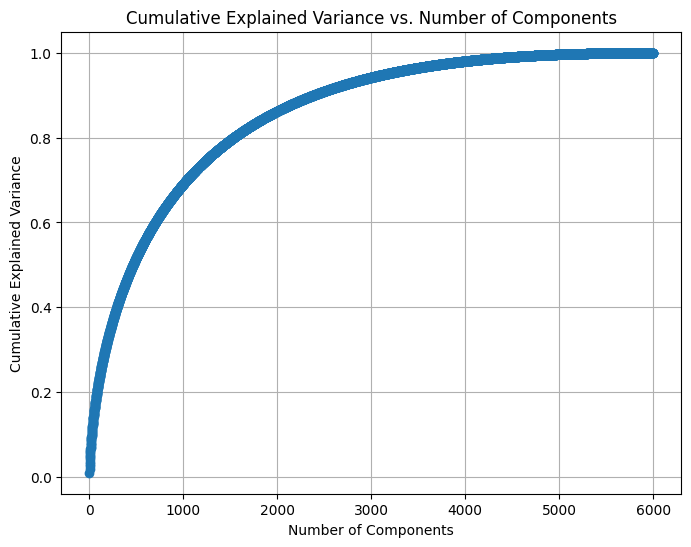

In [ ]:
explained_variance_ratio = pca.explained_variance_ratio_
cumulative_variance_ratio = np.cumsum(explained_variance_ratio)

plt.figure(figsize=(8, 6))
plt.plot(range(1, len(cumulative_variance_ratio) + 1), cumulative_variance_ratio, marker='o', linestyle='--')
plt.title('Cumulative Explained Variance vs. Number of Components')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.grid(True)
plt.show()

In [ ]:
threshold = 0.95
num_components = np.argmax(cumulative_variance_ratio >= threshold) + 1
print(f"Optimal number of components to retain {threshold*100}% variance: {num_components}")

Optimal number of components to retain 95.0% variance: 3158


In [ ]:
pca_optimal = PCA(n_components=num_components)

In [ ]:
X_pca = pca_optimal.fit_transform(X_dense)

KeyboardInterrupt: 

In [ ]:
np.save('/content/drive/MyDrive/ML/X_pca.npy', X_pca)

# ------------model------------------

In [ ]:
import pickle
# Load the NumPy array from the .npy file
X_pca = np.load('/content/drive/MyDrive/ML/X_pca.npy')
X_tsne = np.load('/content/drive/MyDrive/ML/X_tsne.npy')


In [ ]:
with open('/content/drive/MyDrive/ML/gmm_tsne_model.pkl', 'rb') as model_file:
    gmm_tsne_labels = pickle.load(model_file)

In [ ]:


# Load the Default Clustering with PCA
with open('/content/drive/MyDrive/ML/agg_model.pkl', 'rb') as model_file:
    agg_labels = pickle.load(model_file)
with open('/content/drive/MyDrive/ML/spectralClustering_model.pkl', 'rb') as model_file:
    spectral_labels = pickle.load(model_file)
with open('/content/drive/MyDrive/ML/DBSCAN Clustering.pkl', 'rb') as model_file:
    dbscan_labels = pickle.load(model_file)
with open('/content/drive/MyDrive/ML/HDBSCAN_model.pkl', 'rb') as model_file:
    hdbscan_labels = pickle.load(model_file)
with open('/content/drive/MyDrive/ML/meanShift_model.pkl', 'rb') as model_file:
    mean_shift_labels = pickle.load(model_file)
with open('/content/drive/MyDrive/ML/birch_model.pkl', 'rb') as model_file:
    birch_labels = pickle.load(model_file)
with open('/content/drive/MyDrive/ML/gmm_model.pkl', 'rb') as model_file:
    gmm_labels = pickle.load(model_file)


# Load the Default Clustering with t-SNE (Spectral Clustering have error with default clustering)
with open('/content/drive/MyDrive/ML/agg_tsne_model.pkl', 'rb') as model_file:
    agg_tsne_labels = pickle.load(model_file)
with open('/content/drive/MyDrive/ML/DBSCAN_tsne_Clustering.pkl', 'rb') as model_file:
    dbscan_tsne_labels = pickle.load(model_file)
with open('/content/drive/MyDrive/ML/HDBSCAN_tsne_model.pkl', 'rb') as model_file:
    hdbscan_tsne_labels = pickle.load(model_file)
with open('/content/drive/MyDrive/ML/meanShift_tsne_model.pkl', 'rb') as model_file:
    mean_shift_tsne_labels = pickle.load(model_file)
with open('/content/drive/MyDrive/ML/birch_tsne_model.pkl', 'rb') as model_file:
    birch_tsne_labels = pickle.load(model_file)
with open('/content/drive/MyDrive/ML/gmm_tsne_model.pkl', 'rb') as model_file:
    gmm_tsne_labels = pickle.load(model_file)


FileNotFoundError: [Errno 2] No such file or directory: '/content/drive/MyDrive/ML/meanShift_model.pkl'

## <u> Default Clustering with PCA

### Agglomerative Clustering

In [ ]:
from sklearn.cluster import AgglomerativeClustering

# Train the Agglomerative Clustering model
agg_clustering = AgglomerativeClustering()

In [ ]:
agg_labels = agg_clustering.fit_predict(X_pca)

In [ ]:
# Evaluate the model
agg_results = evaluate_clustering('Agglomerative Clustering',agg_clustering, X_pca, agg_labels)


# Print the evaluation results
print("Agglomerative Clustering Evaluation Results:")
for metric, value in agg_results.items():
    print(f"{metric}: {value}")

Agglomerative Clustering Evaluation Results:
Model: Agglomerative Clustering
Silhouette Score: 0.004768670911468242
Davies-Bouldin Index: 13.49911020912158
Calinski-Harabasz Index: 41.176028382628274
Runtime (seconds): 100.11177492141724


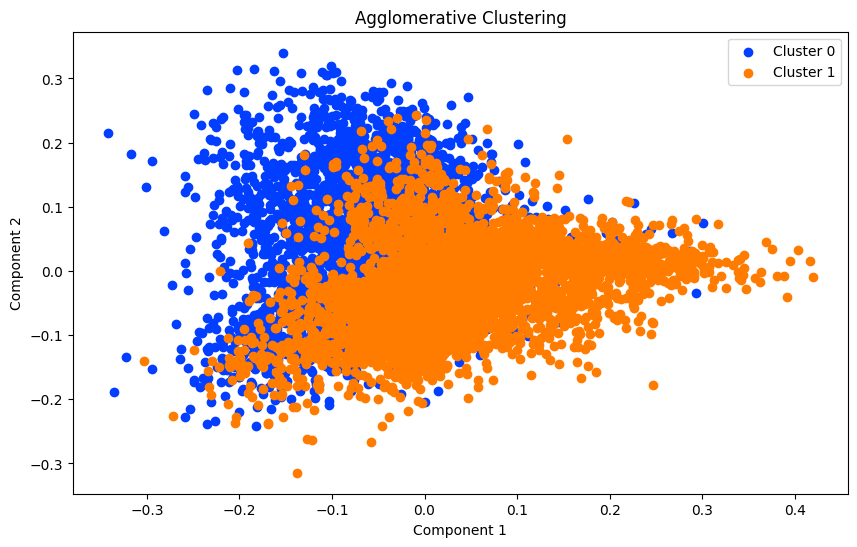

In [ ]:
plot_clusters(X_pca, agg_labels, title='Agglomerative Clustering')

In [ ]:
import pickle

# Save the GMM model
with open('/content/drive/MyDrive/ML/agg_model.pkl', 'wb') as model_file:
    pickle.dump(agg_labels, model_file)

print("AGG model and results saved successfully.")

AGG model and results saved successfully.


### Spectral Clustering

In [ ]:
from sklearn.cluster import SpectralClustering

# Train the Spectral Clustering model
spectral_clustering = SpectralClustering()


In [ ]:
spectral_labels = spectral_clustering.fit_predict(X_pca)

In [ ]:
# Evaluate the model
spectral_results = evaluate_clustering('Spectral Clustering',spectral_clustering, X_pca, spectral_labels)

# Print the evaluation results
print("Spectral Clustering Evaluation Results:")
for metric, value in spectral_results.items():
    print(f"{metric}: {value}")

Spectral Clustering Evaluation Results:
Model: Spectral Clustering
Silhouette Score: 0.00906275655936681
Davies-Bouldin Index: 8.177213517503908
Calinski-Harabasz Index: 39.258839111876235
Runtime (seconds): 36.26426887512207


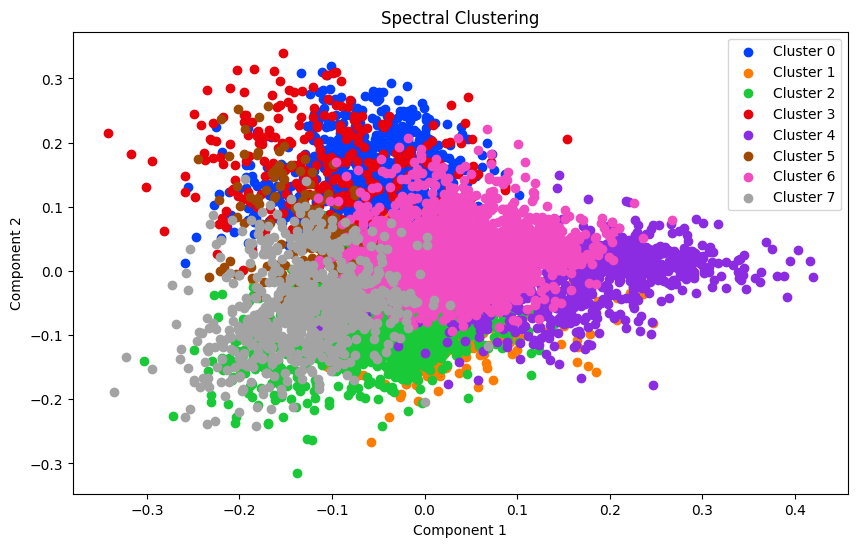

In [ ]:
plot_clusters(X_pca, spectral_labels, title='Spectral Clustering')

In [ ]:
import pickle

# Save the GMM model
with open('/content/drive/MyDrive/ML/spectralClustering_model.pkl', 'wb') as model_file:
    pickle.dump(spectral_labels, model_file)

print("GMM model and results saved successfully.")


GMM model and results saved successfully.


### DBSCAN Clustering

In [ ]:
from sklearn.cluster import DBSCAN

# Train the DBSCAN model
dbscan_clustering = DBSCAN()


In [ ]:
dbscan_labels = dbscan_clustering.fit_predict(X_pca)

In [ ]:
# Evaluate the model
dbscan_results = evaluate_clustering('DBSCAN Clustering',dbscan_clustering, X_pca, dbscan_labels)

# Print the evaluation results
print("DBSCAN Clustering Evaluation Results:")
for metric, value in dbscan_results.items():
    print(f"{metric}: {value}")

DBSCAN Clustering Evaluation Results:
Model: DBSCAN Clustering
Error: Not enough clusters for evaluation (fewer than 2 clusters found).


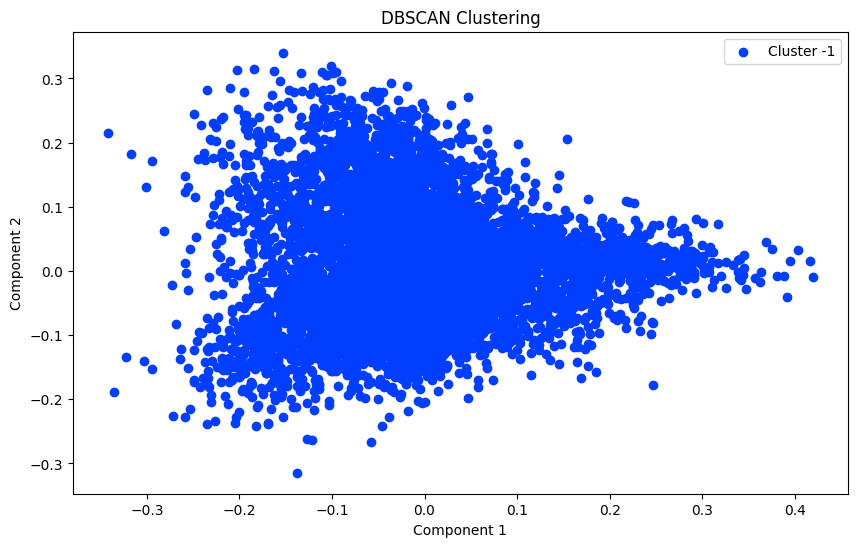

In [ ]:
plot_clusters(X_pca, dbscan_labels, title='DBSCAN Clustering')

In [ ]:
import pickle

# Save the GMM model
with open('/content/drive/MyDrive/ML/DBSCAN Clustering.pkl', 'wb') as model_file:
    pickle.dump(dbscan_labels, model_file)

print("GMM model and results saved successfully.")


GMM model and results saved successfully.


### HDBSCAN Clustering

In [ ]:
import hdbscan

# Train the HDBSCAN model
hdbscan_clustering = hdbscan.HDBSCAN()


In [ ]:
hdbscan_labels = hdbscan_clustering.fit_predict(X_pca)

In [ ]:
# Evaluate the model
hdbscan_results = evaluate_clustering('HDBSCAN Clustering',hdbscan_clustering, X_pca, hdbscan_labels)

# Print the evaluation results
print("HDBSCAN Clustering Evaluation Results:")
for metric, value in hdbscan_results.items():
    print(f"{metric}: {value}")

HDBSCAN Clustering Evaluation Results:
Model: HDBSCAN Clustering
Silhouette Score: -0.001022707135915597
Davies-Bouldin Index: 18.28593714379873
Calinski-Harabasz Index: 7.221416541616692
Runtime (seconds): 590.6236546039581


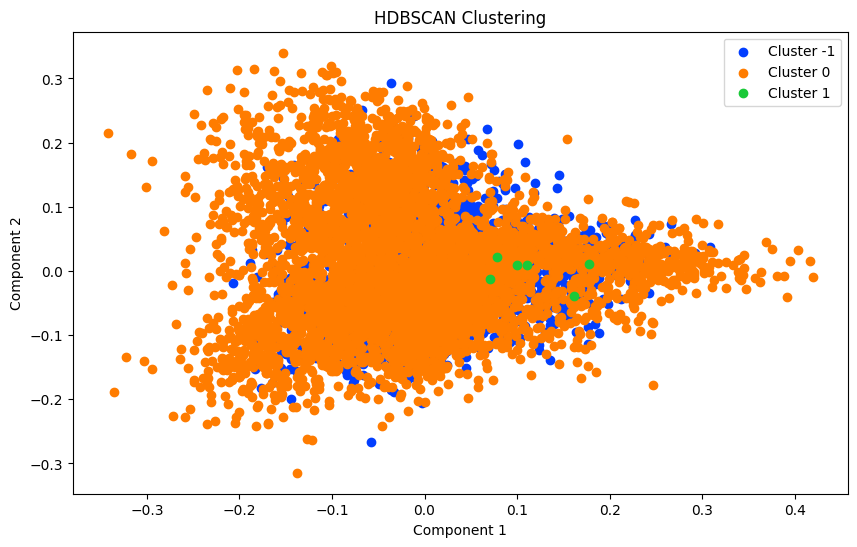

In [ ]:
plot_clusters(X_pca, hdbscan_labels, title='HDBSCAN Clustering')

In [ ]:
import pickle

# Save the GMM model
with open('/content/drive/MyDrive/ML/HDBSCAN_model.pkl', 'wb') as model_file:
    pickle.dump(hdbscan_labels, model_file)

print("GMM model and results saved successfully.")

GMM model and results saved successfully.


### Mean Shift Clustering

In [ ]:
from sklearn.cluster import MeanShift

# Train the Mean Shift model
mean_shift_clustering = MeanShift()


In [ ]:
mean_shift_labels = mean_shift_clustering.fit_predict(X_pca)

In [ ]:
# Evaluate the model
mean_shift_results = evaluate_clustering('Mean Shift Clustering',mean_shift_clustering, X_pca, mean_shift_labels)

# Print the evaluation results
print("Mean Shift Clustering Evaluation Results:")
for metric, value in mean_shift_results.items():
    print(f"{metric}: {value}")

Mean Shift Clustering Evaluation Results:
Model: Mean Shift Clustering
Error: Not enough clusters for evaluation (fewer than 2 clusters found).


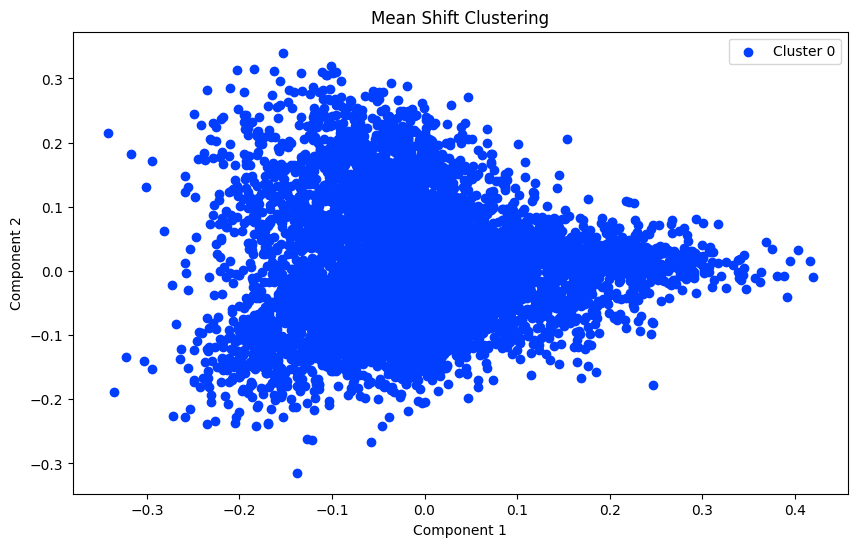

In [ ]:
plot_clusters(X_pca, mean_shift_labels, title='Mean Shift Clustering')

In [ ]:
import pickle

# Save the GMM model
with open('/content/drive/MyDrive/ML/meanShift_model.pkl', 'wb') as model_file:
    pickle.dump(mean_shift_labels, model_file)

print("GMM model and results saved successfully.")

GMM model and results saved successfully.


### Birch Clustering

In [ ]:
from sklearn.cluster import Birch

# Train the Birch model
birch_clustering = Birch()

In [ ]:
birch_labels = birch_clustering.fit_predict(X_pca)

In [ ]:
# Evaluate the model
birch_results = evaluate_clustering('Birch Clustering',birch_clustering, X_pca, birch_labels)

# Print the evaluation results
print("Birch Clustering Evaluation Results:")
for metric, value in birch_results.items():
    print(f"{metric}: {value}")

Birch Clustering Evaluation Results:
Model: Birch Clustering
Silhouette Score: 0.00395041338446662
Davies-Bouldin Index: 13.057925680906251
Calinski-Harabasz Index: 33.53597968206142
Runtime (seconds): 112.05601501464844


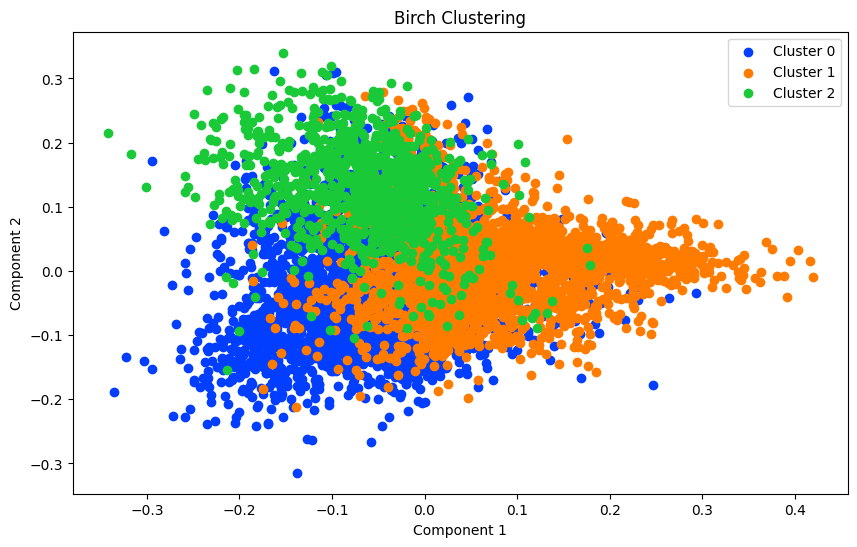

In [ ]:
plot_clusters(X_pca, birch_labels, title='Birch Clustering')

In [ ]:
import pickle

# Save the GMM model
with open('/content/drive/MyDrive/ML/birch_model.pkl', 'wb') as model_file:
    pickle.dump(birch_labels, model_file)

print("GMM model and results saved successfully.")


GMM model and results saved successfully.


### Gaussian Mixture Model (GMM)

In [ ]:
from sklearn.mixture import GaussianMixture

# Train the Gaussian Mixture Model
gmm_clustering = GaussianMixture()

In [ ]:
gmm_clustering.fit(X_pca)
gmm_labels = gmm_clustering.predict(X_pca)

In [ ]:
# Evaluate the model
gmm_results = evaluate_clustering('Gaussian Mixture Model (GMM)',gmm_clustering, X_pca, gmm_labels)

# Print the evaluation results
print("Gaussian Mixture Model (GMM) Evaluation Results:")
for metric, value in gmm_results.items():
    print(f"{metric}: {value}")

Gaussian Mixture Model (GMM) Evaluation Results:
Model: Gaussian Mixture Model (GMM)
Error: Not enough clusters for evaluation (fewer than 2 clusters found).


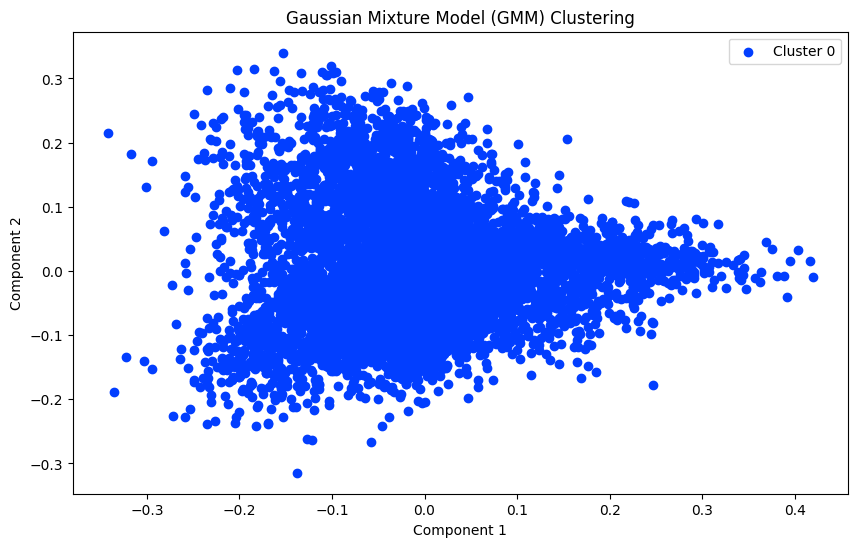

In [ ]:
plot_clusters(X_pca, gmm_labels, title='Gaussian Mixture Model (GMM) Clustering')

In [ ]:
import pickle

# Save the GMM model
with open('/content/drive/MyDrive/ML/gmm_model.pkl', 'wb') as model_file:
    pickle.dump(gmm_labels, model_file)

print("GMM model and results saved successfully.")

GMM model and results saved successfully.


# <u> t-SNE

In [ ]:
# Load the NumPy array from the .npy file
X_tsne = np.load('/content/drive/MyDrive/ML/X_tsne.npy')

In [ ]:
from sklearn.manifold import TSNE
import numpy as np
import matplotlib.pyplot as plt

# Function to evaluate and track KL divergence for t-SNE
def run_tsne(X, perplexity, learning_rate, max_iter):
    tsne = TSNE(
        verbose=1,           # Show progress
        perplexity=perplexity,
        learning_rate=learning_rate,
        n_iter=max_iter,     # Lower the max_iter to save time on large datasets
        random_state=42
    )

    # Fit and transform the dataset
    X_tsne = tsne.fit_transform(X)

    # Retrieve KL divergence from the model (this is a measure of the embedding quality)
    kl_divergence = tsne.kl_divergence_

    return X_tsne, kl_divergence

# Assuming X is a dense matrix (convert sparse matrix to dense beforehand)
X_dense = X.toarray()  # Or keep X dense if not sparse

# Parameter ranges (reduced for large dataset)
perplexities = [30, 50]      # Reasonable range of perplexities for large datasets
learning_rates = [200, 400]       # Fix learning rate to reduce search space
max_iters = [750, 1500]       # Reduced max iterations to save time

# Initialize variables to track the best result
best_kl_divergence = np.inf  # Start with infinity, to ensure the first result is better
best_X_tsne = None
best_params = None

# To store all results for plotting
tsne_results = []
params_list = []
kl_divergences = []

# Loop over reduced parameter combinations
for perplexity in perplexities:
    for learning_rate in learning_rates:
        for max_iter in max_iters:
            print(f"Running t-SNE with perplexity={perplexity}, learning_rate={learning_rate}, max_iter={max_iter}")

            # Fit t-SNE and get the KL divergence
            X_tsne, kl_divergence = run_tsne(X_dense, perplexity, learning_rate, max_iter)

            # Store the result and parameters
            tsne_results.append(X_tsne)
            params_list.append((perplexity, learning_rate, max_iter))
            kl_divergences.append(kl_divergence)

            # Check if this is the best result so far based on KL divergence
            if kl_divergence < best_kl_divergence:
                best_kl_divergence = kl_divergence
                best_X_tsne = X_tsne
                best_params = (perplexity, learning_rate, max_iter)

            print(f"Completed t-SNE with perplexity={perplexity}, learning_rate={learning_rate}, max_iter={max_iter}")
            print(f"KL Divergence: {kl_divergence}\n")

# Print the best parameters and KL divergence
print(f"Best Parameters: {best_params}")
print(f"Best KL Divergence: {best_kl_divergence}")

# The best t-SNE result is stored in best_X_tsne


Running t-SNE with perplexity=30, learning_rate=200, max_iter=750
[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 8361 samples in 0.045s...
[t-SNE] Computed neighbors for 8361 samples in 40.222s...
[t-SNE] Computed conditional probabilities for sample 1000 / 8361
[t-SNE] Computed conditional probabilities for sample 2000 / 8361
[t-SNE] Computed conditional probabilities for sample 3000 / 8361
[t-SNE] Computed conditional probabilities for sample 4000 / 8361
[t-SNE] Computed conditional probabilities for sample 5000 / 8361
[t-SNE] Computed conditional probabilities for sample 6000 / 8361
[t-SNE] Computed conditional probabilities for sample 7000 / 8361
[t-SNE] Computed conditional probabilities for sample 8000 / 8361
[t-SNE] Computed conditional probabilities for sample 8361 / 8361
[t-SNE] Mean sigma: 0.315704
[t-SNE] KL divergence after 50 iterations with early exaggeration: 95.070694
[t-SNE] KL divergence after 750 iterations: 2.380291
Completed t-SNE with perplexity=30, lea

<ipython-input-87-9423ecd4c462>:5: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('tab10', len(params_list))


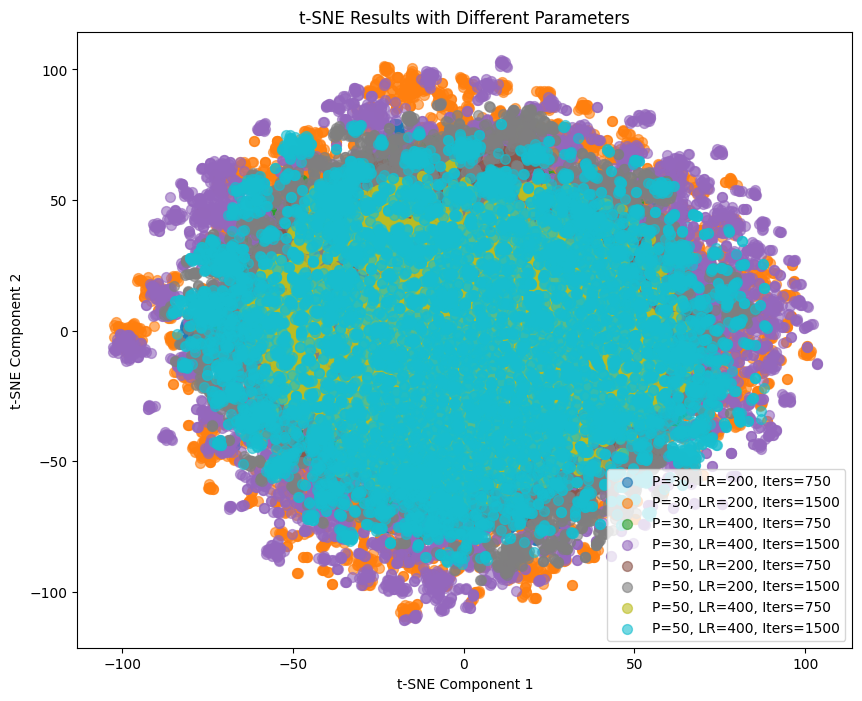

Best Parameters: (30, 200, 1500)
Best KL Divergence: 2.3312923908233643


In [ ]:
# Plotting all t-SNE results with different colors for each parameter set
plt.figure(figsize=(10, 8))

# Define color map
colors = plt.cm.get_cmap('tab10', len(params_list))

# Plot each result with different colors
for i, (X_tsne, params, kl_div) in enumerate(zip(tsne_results, params_list, kl_divergences)):
    plt.scatter(X_tsne[:, 0], X_tsne[:, 1], label=f"P={params[0]}, LR={params[1]}, Iters={params[2]}",
                color=colors(i), alpha=0.6, s=50)

# Highlight the best result
#plt.scatter(best_X_tsne[:, 0], best_X_tsne[:, 1], color='black', label='Best (KL Div)', s=100, edgecolor='white')

# Add title and labels
plt.title('t-SNE Results with Different Parameters')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.legend(loc='best')
plt.show()

# Print the best parameters and KL divergence
print(f"Best Parameters: {best_params}")
print(f"Best KL Divergence: {best_kl_divergence}")

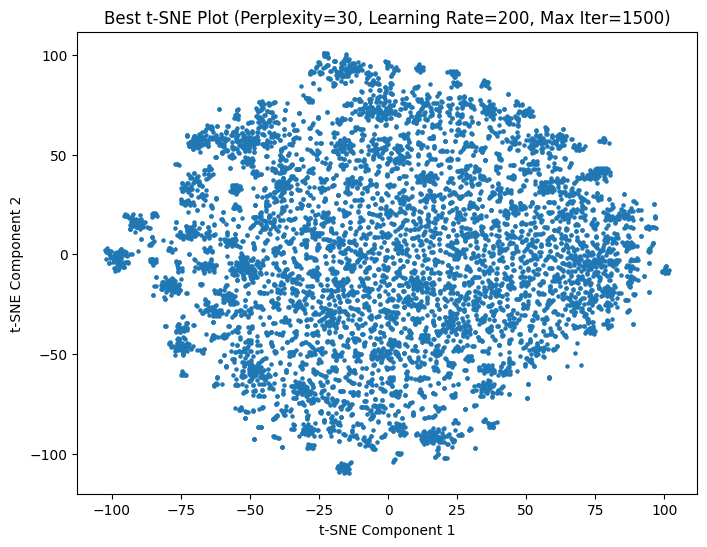

In [ ]:
# Plot the best t-SNE result
plt.figure(figsize=(8, 6))
plt.scatter(best_X_tsne[:, 0], best_X_tsne[:, 1], s=5)
plt.title(f'Best t-SNE Plot (Perplexity={best_params[0]}, Learning Rate={best_params[1]}, Max Iter={best_params[2]})')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.show()


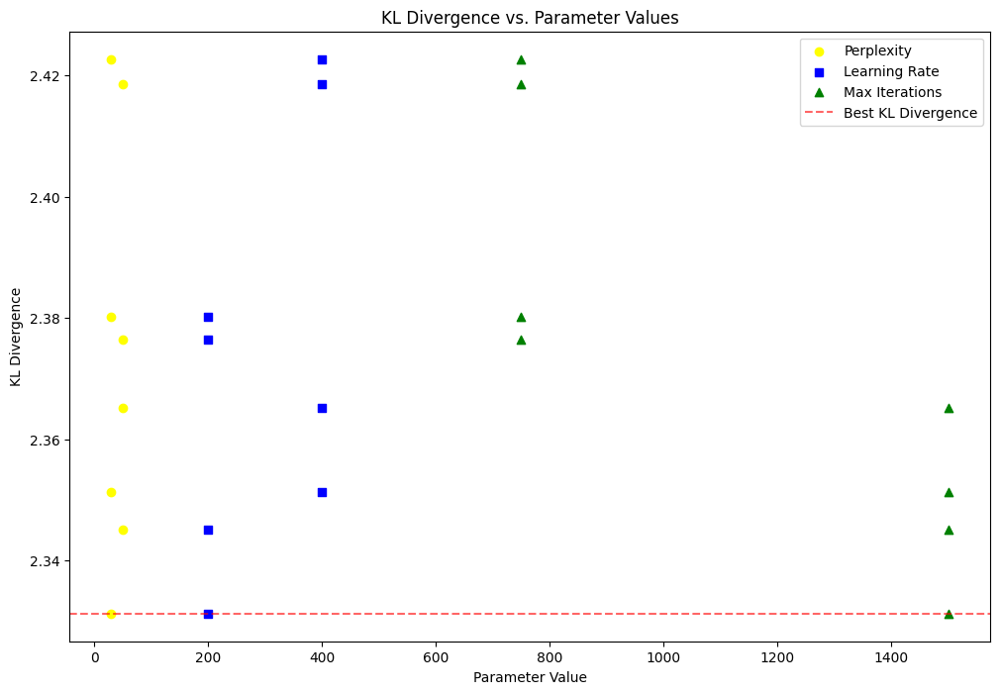

Best Parameters: Perplexity=30, Learning Rate=200, Max Iterations=1500
Best KL Divergence: 2.3312923908233643


In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Assuming you have the tsne_results, params_list, and kl_divergences from the previous process

# Extract KL divergences for each parameter type
perplexities = [params[0] for params in params_list]
learning_rates = [params[1] for params in params_list]
max_iters = [params[2] for params in params_list]

# Convert to numpy arrays for easier handling
kl_divergences = np.array(kl_divergences)
perplexities = np.array(perplexities)
learning_rates = np.array(learning_rates)
max_iters = np.array(max_iters)

# Create a figure and plot each parameter type against KL divergence
plt.figure(figsize=(12, 8))

# Plot perplexity vs KL divergence (yellow points)
plt.scatter(perplexities, kl_divergences, color='yellow', label='Perplexity', marker='o')

# Plot learning_rate vs KL divergence (blue points)
plt.scatter(learning_rates, kl_divergences, color='blue', label='Learning Rate', marker='s')

# Plot max_iter vs KL divergence (green points)
plt.scatter(max_iters, kl_divergences, color='green', label='Max Iterations', marker='^')

# Add lines for the best parameters
best_index = np.argmin(kl_divergences)
best_kl_divergence = kl_divergences[best_index]

plt.axhline(y=best_kl_divergence, color='red', linestyle='--', label='Best KL Divergence', alpha=0.6)

# Add labels and title
plt.xlabel('Parameter Value')
plt.ylabel('KL Divergence')
plt.title('KL Divergence vs. Parameter Values')
plt.legend()

# Show the plot
plt.show()

# Print the best parameters and KL divergence
print(f"Best Parameters: Perplexity={perplexities[best_index]}, Learning Rate={learning_rates[best_index]}, Max Iterations={max_iters[best_index]}")
print(f"Best KL Divergence: {best_kl_divergence}")


In [ ]:
X_tsne = best_X_tsne

In [ ]:
np.save('/content/drive/MyDrive/ML/X_tsne.npy', X_tsne)

## <u> Default Clustering with t-SNE

### Agglomerative Clustering

In [ ]:
from sklearn.cluster import AgglomerativeClustering

# Train the Agglomerative Clustering model
agg_tsne_clustering = AgglomerativeClustering()


In [ ]:
agg_tsne_labels = agg_clustering.fit_predict(X_tsne)

In [ ]:
# Evaluate the model
agg_tsne_results = evaluate_clustering('Agglomerative Clustering',agg_tsne_clustering, X_tsne, agg_tsne_labels)


# Print the evaluation results
print("Agglomerative Clustering Evaluation Results:")
for metric, value in agg_tsne_results.items():
    print(f"{metric}: {value}")

Agglomerative Clustering Evaluation Results:
Model: Agglomerative Clustering
Silhouette Score: 0.32845887541770935
Davies-Bouldin Index: 1.186618692340731
Calinski-Harabasz Index: 4455.095375531678
Runtime (seconds): 5.501549243927002


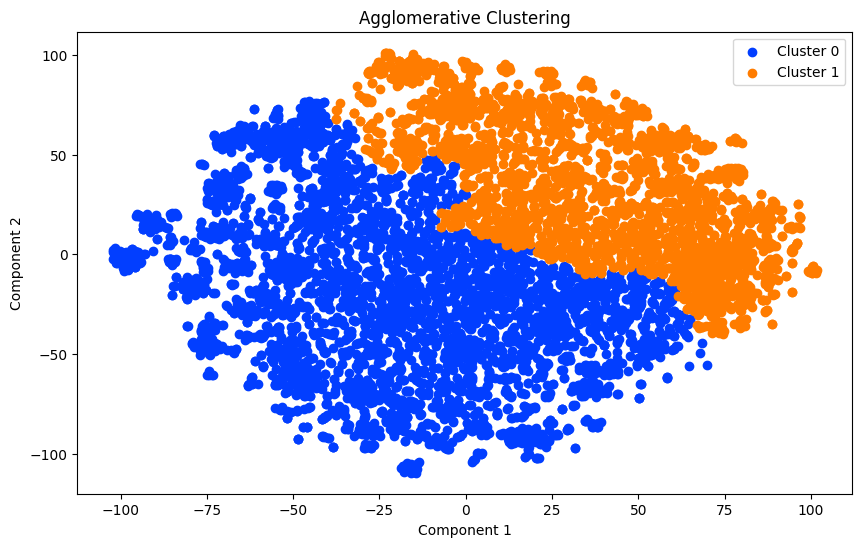

In [ ]:
plot_clusters(X_tsne, agg_tsne_labels, title='Agglomerative Clustering')

### Spectral Clustering (Default model wil cause session crash)

In [ ]:
from sklearn.cluster import SpectralClustering

# Train the Spectral Clustering model
spectral_tsne_clustering = SpectralClustering()

In [ ]:
spectral_tsne_labels = spectral_tsne_clustering.fit_predict(X_tsne)

In [ ]:
# Evaluate the model
spectral_tsne_results = evaluate_clustering('Spectral Clustering',spectral_tsne_clustering, X_tsne, spectral_labels)

# Print the evaluation results
print("Spectral Clustering Evaluation Results:")
for metric, value in spectral_tsne_results.items():
    print(f"{metric}: {value}")

In [ ]:
plot_clusters(X_tsne, spectral_tsne_labels, title='Spectral Clustering')

### DBSCAN Clustering

In [ ]:
from sklearn.cluster import DBSCAN

# Train the DBSCAN model
dbscan_clustering = DBSCAN()


In [ ]:
dbscan_tsne_labels = dbscan_clustering.fit_predict(X_tsne)

In [ ]:
# Evaluate the model
dbscan_tsne_results = evaluate_clustering('DBSCAN Clustering',dbscan_clustering, X_tsne, dbscan_tsne_labels)

# Print the evaluation results
print("DBSCAN Clustering Evaluation Results:")
for metric, value in dbscan_tsne_results.items():
    print(f"{metric}: {value}")

DBSCAN Clustering Evaluation Results:
Model: DBSCAN Clustering
Silhouette Score: -0.7333592772483826
Davies-Bouldin Index: 1.0799275538241875
Calinski-Harabasz Index: 5.802697429666803
Runtime (seconds): 0.05139923095703125


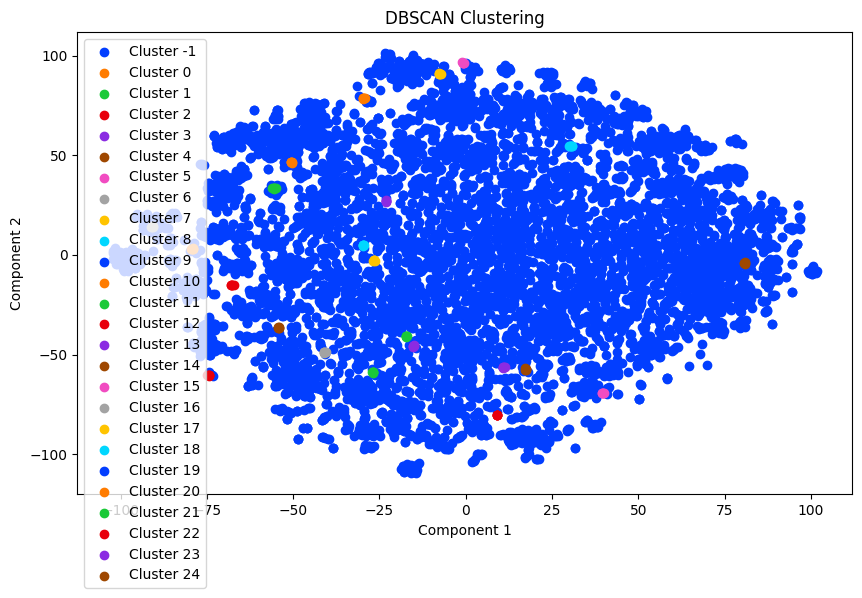

In [ ]:
plot_clusters(X_tsne, dbscan_tsne_labels, title='DBSCAN Clustering')

### HDBSCAN Clustering

In [ ]:
import hdbscan

# Train the HDBSCAN model
hdbscan_clustering = hdbscan.HDBSCAN()

In [ ]:
hdbscan_tsne_labels = hdbscan_clustering.fit_predict(X_tsne)

In [ ]:
# Evaluate the model
hdbscan_tsne_results = evaluate_clustering('HDBSCAN Clustering',hdbscan_clustering, X_tsne, hdbscan_tsne_labels)

# Print the evaluation results
print("HDBSCAN Clustering Evaluation Results:")
for metric, value in hdbscan_tsne_results.items():
    print(f"{metric}: {value}")

HDBSCAN Clustering Evaluation Results:
Model: HDBSCAN Clustering
Silhouette Score: 0.15752165019512177
Davies-Bouldin Index: 1.4131022562529525
Calinski-Harabasz Index: 72.85540033562395
Runtime (seconds): 0.7654614448547363


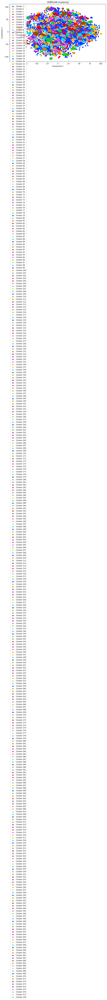

In [ ]:
plot_clusters(X_tsne, hdbscan_tsne_labels, title='HDBSCAN Clustering')

### Mean Shift Clustering

In [ ]:
from sklearn.cluster import MeanShift

# Train the Mean Shift model
mean_shift_clustering = MeanShift()

In [ ]:
mean_shift_tsne_labels = mean_shift_clustering.fit_predict(X_tsne)

In [ ]:
# Evaluate the model
mean_shift_tsne_results = evaluate_clustering('Mean Shift Clustering',mean_shift_clustering, X_tsne, mean_shift_tsne_labels)

# Print the evaluation results
print("Mean Shift Clustering Evaluation Results:")
for metric, value in mean_shift_tsne_results.items():
    print(f"{metric}: {value}")

Mean Shift Clustering Evaluation Results:
Model: Mean Shift Clustering
Error: Not enough clusters for evaluation (fewer than 2 clusters found).


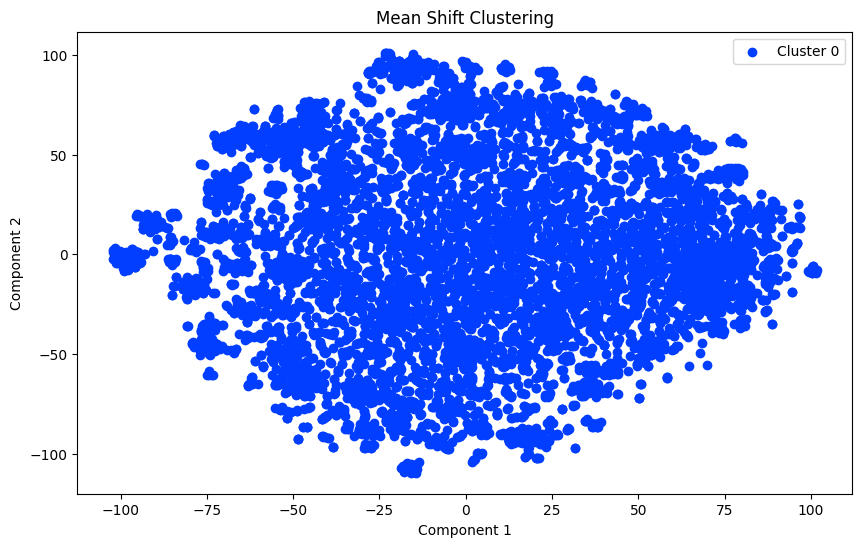

In [ ]:
plot_clusters(X_tsne, mean_shift_tsne_labels, title='Mean Shift Clustering')

### Birch Clustering

In [ ]:
from sklearn.cluster import Birch

# Train the Birch model
birch_clustering = Birch()


In [ ]:
birch_tsne_labels = birch_clustering.fit_predict(X_tsne)

In [ ]:
# Evaluate the model
birch_tsne_results = evaluate_clustering('Birch Clustering',birch_clustering, X_tsne, birch_tsne_labels)

# Print the evaluation results
print("Birch Clustering Evaluation Results:")
for metric, value in birch_tsne_results.items():
    print(f"{metric}: {value}")

Birch Clustering Evaluation Results:
Model: Birch Clustering
Silhouette Score: 0.34433311223983765
Davies-Bouldin Index: 0.9129292004651566
Calinski-Harabasz Index: 5690.98035978241
Runtime (seconds): 1.3352251052856445


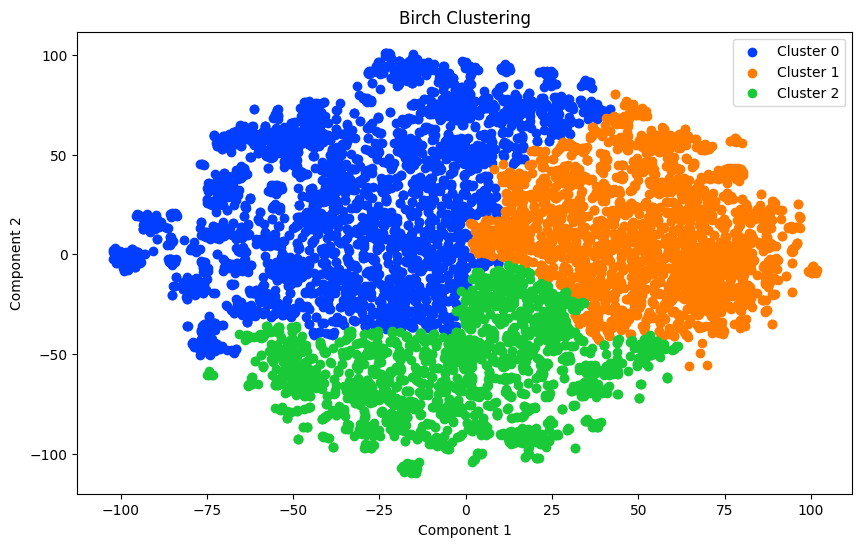

In [ ]:
plot_clusters(X_tsne, birch_tsne_labels, title='Birch Clustering')

### Gaussian Mixture Model (GMM)

In [ ]:
from sklearn.mixture import GaussianMixture

# Train the Gaussian Mixture Model
gmm_clustering = GaussianMixture()

In [ ]:
gmm_clustering.fit(X_tsne)
gmm_tsne_labels = gmm_clustering.predict(X_tsne)

In [ ]:
# Evaluate the model
gmm_tsne_results = evaluate_clustering('Gaussian Mixture Model (GMM)',gmm_clustering, X_tsne, gmm_tsne_labels)

# Print the evaluation results
print("Gaussian Mixture Model (GMM) Evaluation Results:")
for metric, value in gmm_tsne_results.items():
    print(f"{metric}: {value}")

Gaussian Mixture Model (GMM) Evaluation Results:
Model: Gaussian Mixture Model (GMM)
Error: Not enough clusters for evaluation (fewer than 2 clusters found).


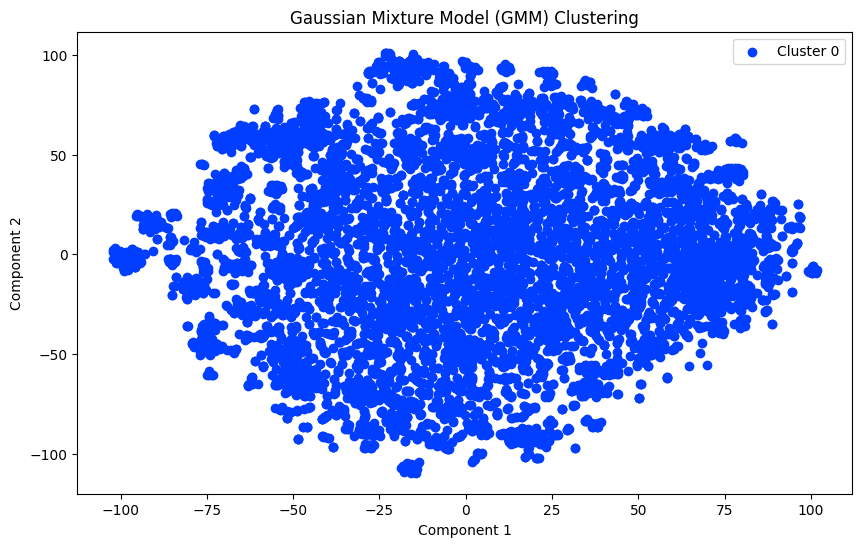

In [ ]:
plot_clusters(X_tsne, gmm_tsne_labels, title='Gaussian Mixture Model (GMM) Clustering')

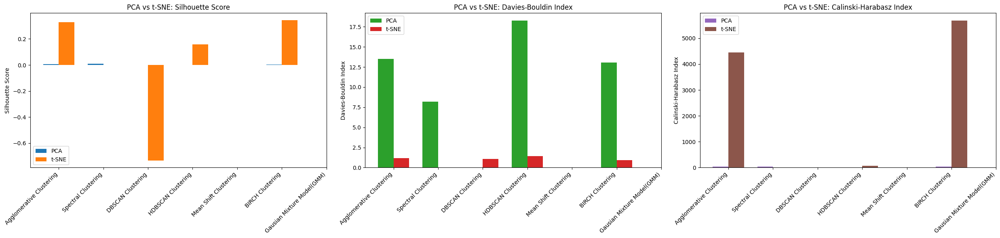

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

# Store results for PCA-fitted models
pca_results = {
    'Agglomerative Clustering': agg_results,
    'Spectral Clustering': spectral_results,
    'DBSCAN Clustering': dbscan_results,
    'HDBSCAN Clustering': hdbscan_results,
    'Mean Shift Clustering': mean_shift_results,
    'BIRCH Clustering': birch_results,
    'Gausian Mixture Model(GMM)': gmm_results
}

# Store results for t-SNE-fitted models
tsne_results = {
    'Agglomerative Clustering': agg_tsne_results,
    'Spectral Clustering': 0,
    'DBSCAN Clustering': dbscan_tsne_results,
    'HDBSCAN Clustering': hdbscan_tsne_results,
    'Mean Shift Clustering': mean_shift_tsne_results,
    'BIRCH Clustering': birch_tsne_results,
    'Gausian Mixture Model(GMM)': gmm_tsne_results
}

# Create DataFrames for PCA and t-SNE results (transpose to have models as rows)
pca_df = pd.DataFrame(pca_results).T
tsne_df = pd.DataFrame(tsne_results).T

# Concatenate PCA and t-SNE DataFrames side by side for each metric
comparison_df = pd.concat([pca_df.add_prefix('PCA_'), tsne_df.add_prefix('t-SNE_')], axis=1)

# Plot the results side by side for each metric for every model
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(25, 6))

metrics = ['Silhouette Score', 'Davies-Bouldin Index', 'Calinski-Harabasz Index']

# Define custom colors for PCA and t-SNE bars for each metric
colors = {
    'Silhouette Score': ['#1f77b4', '#ff7f0e'],  # Blue for PCA, Orange for t-SNE
    'Davies-Bouldin Index': ['#2ca02c', '#d62728'],  # Green for PCA, Red for t-SNE
    'Calinski-Harabasz Index': ['#9467bd', '#8c564b']  # Purple for PCA, Brown for t-SNE
}

# Spacing factor between groups of bars
spacing_factor = 0.4

for i, metric in enumerate(metrics):
    # Set width of bars
    bar_width = 0.35

    # Number of models (categories)
    n_models = comparison_df.shape[0]

    # Create positions for PCA and t-SNE bars
    indices = np.arange(n_models)
    pca_positions = indices - bar_width / 2
    tsne_positions = indices + bar_width / 2

    # Plot PCA and t-SNE bars with adjusted spacing
    axes[i].bar(pca_positions, comparison_df[f'PCA_{metric}'], width=bar_width, color=colors[metric][0], label='PCA')
    axes[i].bar(tsne_positions, comparison_df[f't-SNE_{metric}'], width=bar_width, color=colors[metric][1], label='t-SNE')

    # Set titles and labels
    axes[i].set_title(f'PCA vs t-SNE: {metric}')
    axes[i].set_ylabel(metric)

    # Set x-ticks with more spacing between models
    axes[i].set_xticks(indices)
    axes[i].set_xticklabels(comparison_df.index, rotation=45, ha='right')

    # Add legend
    axes[i].legend()

# Adjust layout
plt.tight_layout()
plt.show()


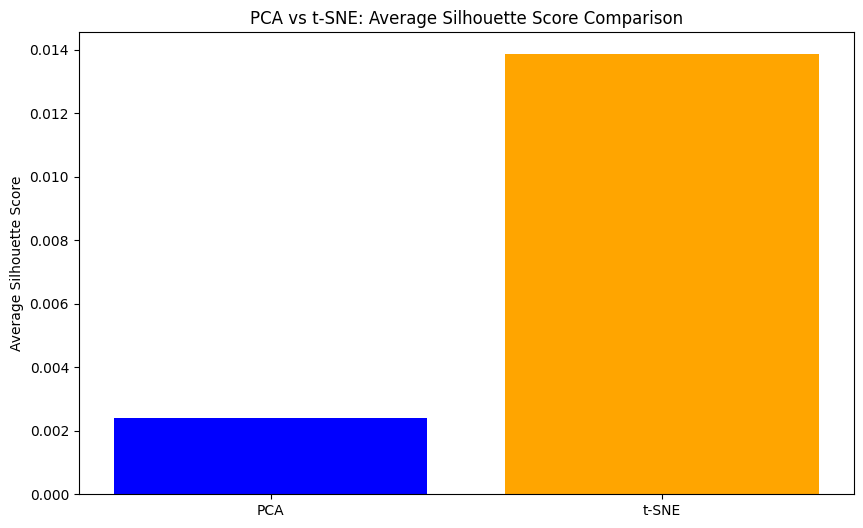

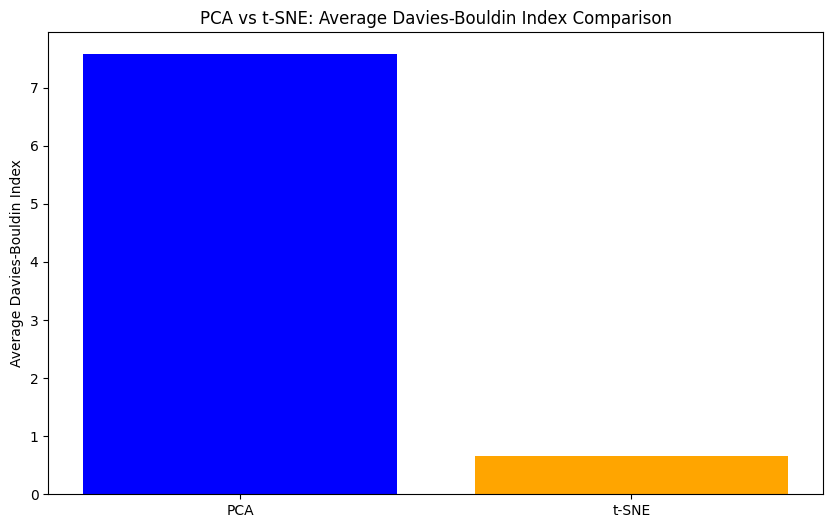

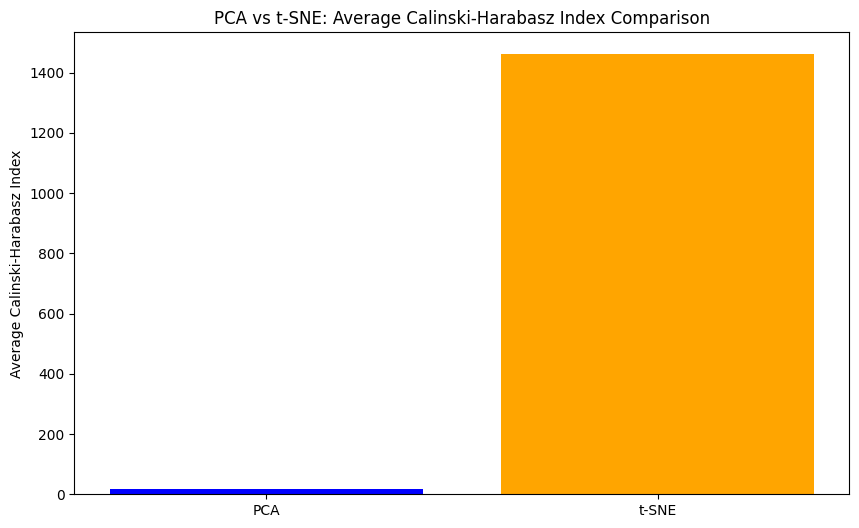

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Initialize dictionaries to store results for each clustering model
pca_results = {}
tsne_results = {}

# Store results for PCA-fitted models
pca_results['Agglomerative Clustering'] = agg_results
pca_results['Spectral Clustering'] = spectral_results
pca_results['DBSCAN Clustering'] = dbscan_results
pca_results['HDBSCAN Clustering'] = hdbscan_results
pca_results['Mean Shift Clustering'] = mean_shift_results
pca_results['BIRCH Clustering'] = birch_results
pca_results['Gaussian Mixture Model(GMM)'] = gmm_results

# Store results for t-SNE-fitted models
tsne_results['Agglomerative Clustering'] = agg_tsne_results
tsne_results['Spectral Clustering'] = 0
tsne_results['DBSCAN Clustering'] = dbscan_tsne_results
tsne_results['HDBSCAN Clustering'] = hdbscan_tsne_results
tsne_results['Mean Shift Clustering'] = mean_shift_tsne_results
tsne_results['BIRCH Clustering'] = birch_tsne_results
tsne_results['Gaussian Mixture Model(GMM)'] = gmm_tsne_results

# Create DataFrames for PCA and t-SNE results
pca_df = pd.DataFrame(pca_results).T
tsne_df = pd.DataFrame(tsne_results).T

# Drop non-metric columns only if they exist, apply numeric conversion, and fill missing values with 0
pca_df = pca_df.apply(pd.to_numeric, errors='coerce').fillna(0)
tsne_df = tsne_df.apply(pd.to_numeric, errors='coerce').fillna(0)

# Define metrics
metrics = ['Silhouette Score', 'Davies-Bouldin Index', 'Calinski-Harabasz Index']

# Compute average scores for each metric
avg_pca_scores = {metric: pca_df[metric].mean() if metric in pca_df else 0 for metric in metrics}
avg_tsne_scores = {metric: tsne_df[metric].mean() if metric in tsne_df else 0 for metric in metrics}

# Create a DataFrame for average scores
comparison_df = pd.DataFrame({
    'PCA': avg_pca_scores,
    't-SNE': avg_tsne_scores
})

# Plot the comparison bar charts for each metric
for metric in metrics:
    plt.figure(figsize=(10, 6))

    # Bar chart for PCA vs t-SNE on each metric
    plt.bar(['PCA', 't-SNE'], [comparison_df['PCA'][metric], comparison_df['t-SNE'][metric]], color=['blue', 'orange'])

    plt.title(f"PCA vs t-SNE: Average {metric} Comparison")
    plt.ylabel(f"Average {metric}")
    plt.xticks(rotation=0)
    plt.show()

# <u> Fine Tuned Clustering

In [ ]:
# File paths for the saved models
model_paths = {
    'Agglomerative Clustering': '/content/drive/MyDrive/ML/agg_finetuned_model.pkl',
    'Spectral Clustering': '/content/drive/MyDrive/ML/spectral_finetuned_model.pkl',
    'DBSCAN': '/content/drive/MyDrive/ML/dbscan_finetuned_model.pkl',
    'HDBSCAN': '/content/drive/MyDrive/ML/hdbscan_finetuned_model.pkl',
    'Mean Shift': '/content/drive/MyDrive/ML/meanshift_finetuned_model.pkl',
    'BIRCH': '/content/drive/MyDrive/ML/birch_finetuned_model.pkl',
    'Gaussian Mixture Model (GMM)': '/content/drive/MyDrive/ML/gmm_finetuned_model.pkl'
}

import pickle

# Dictionary to hold loaded models
loaded_models = {}

for model_name, model_path in model_paths.items():
    try:
        # Open and load the model file
        with open(model_path, 'rb') as model_file:
            loaded_models[model_name] = pickle.load(model_file)
        print(f"Successfully loaded model: {model_name}")

    except EOFError:
        # Handle empty or incomplete file error
        print(f"Error: The file at {model_path} seems to be empty or incomplete (EOFError).")
        continue  # Skip loading this model

    except FileNotFoundError:
        # Handle file not found error
        print(f"Error: The file at {model_path} does not exist (FileNotFoundError).")
        continue  # Skip loading this model

    except pickle.UnpicklingError:
        # Handle pickle-specific errors when loading the model
        print(f"Error: Failed to unpickle the file at {model_path} (UnpicklingError).")
        continue  # Skip loading this model

    except Exception as e:
        # Catch any other exceptions
        print(f"An unexpected error occurred while loading {model_name}: {e}")
        continue  # Skip loading this model


# Display the loaded models to verify
for model_name, model in loaded_models.items():
    print(f"Loaded {model_name} model successfully:", model)

Successfully loaded model: Agglomerative Clustering
Successfully loaded model: Spectral Clustering
Successfully loaded model: DBSCAN
Successfully loaded model: HDBSCAN
Successfully loaded model: Mean Shift
Successfully loaded model: BIRCH
Successfully loaded model: Gaussian Mixture Model (GMM)
Loaded Agglomerative Clustering model successfully: AgglomerativeClustering(n_clusters=3)
Loaded Spectral Clustering model successfully: SpectralClustering(affinity='nearest_neighbors', n_clusters=4, n_neighbors=20,
                   random_state=42)
Loaded DBSCAN model successfully: DBSCAN(eps=1.5, min_samples=3)
Loaded HDBSCAN model successfully: HDBSCAN(min_cluster_size=20, min_samples=10)
Loaded Mean Shift model successfully: MeanShift(bandwidth=2.5)
Loaded BIRCH model successfully: Birch(n_clusters=5, threshold=0.6)
Loaded Gaussian Mixture Model (GMM) model successfully: GaussianMixture(n_components=8)


## Agglomerative Clustering


n_clusters: 3, linkage: ward
  Silhouette Score: 0.34731554985046387
  Calinski-Harabasz Score: 5687.148606685689
  Davies-Bouldin Score: 0.9196741880196778

n_clusters: 3, linkage: complete
  Silhouette Score: 0.3432297706604004
  Calinski-Harabasz Score: 5672.475974829325
  Davies-Bouldin Score: 0.9240089075723666

n_clusters: 3, linkage: average
  Silhouette Score: 0.3465549945831299
  Calinski-Harabasz Score: 5745.805227794404
  Davies-Bouldin Score: 0.9137209263812024

n_clusters: 4, linkage: ward
  Silhouette Score: 0.3312740921974182
  Calinski-Harabasz Score: 6009.7298389333055
  Davies-Bouldin Score: 0.8651754624146133

n_clusters: 4, linkage: complete
  Silhouette Score: 0.3023330271244049
  Calinski-Harabasz Score: 5381.10291420227
  Davies-Bouldin Score: 0.864793546088632

n_clusters: 4, linkage: average
  Silhouette Score: 0.3405345380306244
  Calinski-Harabasz Score: 6354.365685076142
  Davies-Bouldin Score: 0.8533285768255331

n_clusters: 5, linkage: ward
  Silhouette Sc

<ipython-input-162-ce1adce397b5>:60: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = cm.get_cmap('tab10', len(params_list))


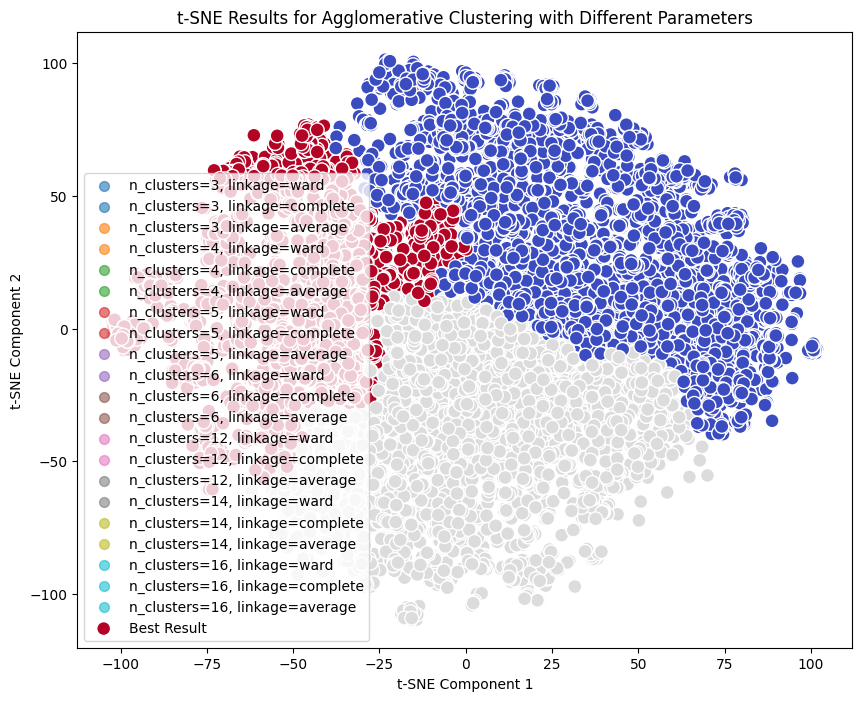

Best Fine-tuned Agglomerative Clustering Parameters: {'n_clusters': 3, 'linkage': 'ward', 'silhouette_score': 0.34731555, 'calinski_harabasz_score': 5687.148606685689, 'davies_bouldin_score': 0.9196741880196778}


In [ ]:
import pickle
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
from matplotlib import cm

# Range of n_clusters and linkage methods to try for Agglomerative Clustering
n_clusters_list = [3, 4, 5, 6, 12, 14, 16]
linkage_methods = ['ward', 'complete', 'average']

best_finetuned_agg_score = -1
best_finetuned_agg_params = {}

# To store the results for plotting
agg_results = []
params_list = []
silhouette_scores = []

# Perform Grid Search for Agglomerative Clustering (fine-tuned version)
for n_clusters in n_clusters_list:
    for linkage in linkage_methods:
        # Initialize Agglomerative Clustering with specific parameters
        agg_finetuned_model = AgglomerativeClustering(n_clusters=n_clusters, linkage=linkage)
        agg_finetuned_labels = agg_finetuned_model.fit_predict(X_tsne)

        # Calculate evaluation metrics
        silhouette_finetuned_avg = silhouette_score(X_tsne, agg_finetuned_labels)
        ch_finetuned_score = calinski_harabasz_score(X_tsne, agg_finetuned_labels)
        db_finetuned_score = davies_bouldin_score(X_tsne, agg_finetuned_labels)

        # Store result for plotting
        agg_results.append((X_tsne, agg_finetuned_labels))
        params_list.append((n_clusters, linkage))
        silhouette_scores.append(silhouette_finetuned_avg)

        # Print the current parameter results
        print(f"n_clusters: {n_clusters}, linkage: {linkage}")
        print(f"  Silhouette Score: {silhouette_finetuned_avg}")
        print(f"  Calinski-Harabasz Score: {ch_finetuned_score}")
        print(f"  Davies-Bouldin Score: {db_finetuned_score}\n")

        # Choose a score to optimize, here we maximize silhouette_score
        if silhouette_finetuned_avg > best_finetuned_agg_score:
            best_finetuned_agg_score = silhouette_finetuned_avg
            best_finetuned_agg_params = {
                'n_clusters': n_clusters,
                'linkage': linkage,
                'silhouette_score': silhouette_finetuned_avg,
                'calinski_harabasz_score': ch_finetuned_score,
                'davies_bouldin_score': db_finetuned_score
            }
            best_X_tsne = X_tsne
            best_agg_labels = agg_finetuned_labels




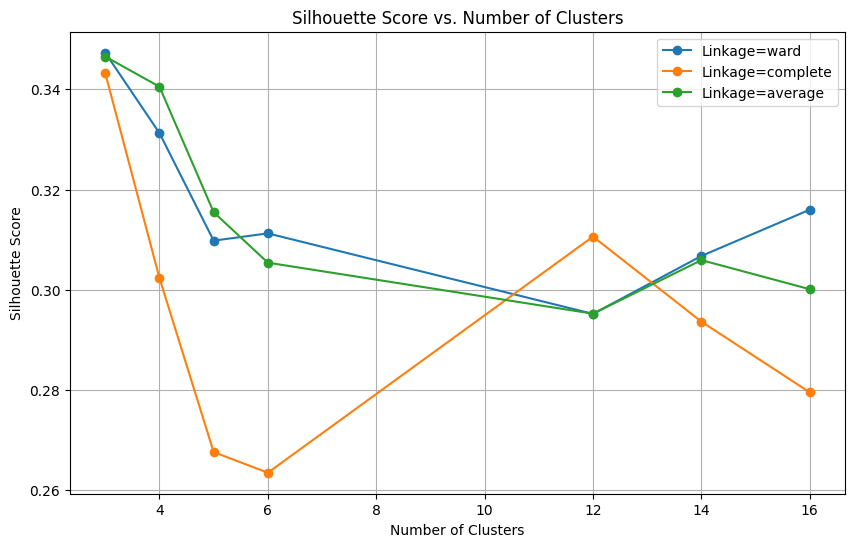

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))

# Plot silhouette scores for each combination
for i, linkage in enumerate(linkage_methods):
    scores = [silhouette_scores[j] for j, params in enumerate(params_list) if params[1] == linkage]
    cluster_sizes = [params[0] for j, params in enumerate(params_list) if params[1] == linkage]
    plt.plot(cluster_sizes, scores, marker='o', label=f'Linkage={linkage}')

plt.title('Silhouette Score vs. Number of Clusters')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.legend()
plt.grid(True)
plt.show()


# Parameter Heatmap
-visualize the performance metrics (e.g., silhouette score) across different parameter combinations.

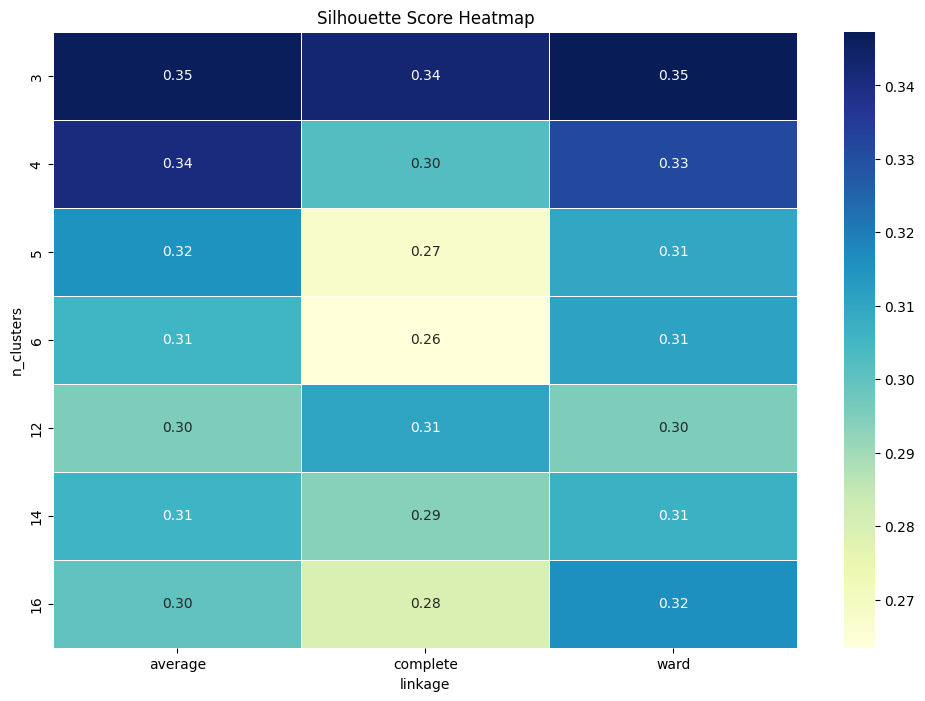

In [ ]:
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt

# Create a DataFrame for heatmap
heatmap_data = {
    'n_clusters': [params[0] for params in params_list],
    'linkage': [params[1] for params in params_list],
    'silhouette_score': silhouette_scores
}

df_heatmap = pd.DataFrame(heatmap_data)

# Pivot for heatmap
heatmap_pivot = df_heatmap.pivot_table(index="n_clusters", columns="linkage", values="silhouette_score")

plt.figure(figsize=(12, 8))
sns.heatmap(heatmap_pivot, annot=True, cmap="YlGnBu", fmt=".2f", linewidths=.5)
plt.title('Silhouette Score Heatmap')
plt.show()


Fine-tuned Agglomerative Clustering Evaluation Results:
Model: Agglomerative Clustering
Silhouette Score: 0.34731554985046387
Davies-Bouldin Index: 0.9196741880196778
Calinski-Harabasz Index: 5687.148606685689
Runtime (seconds): 3.5932464599609375


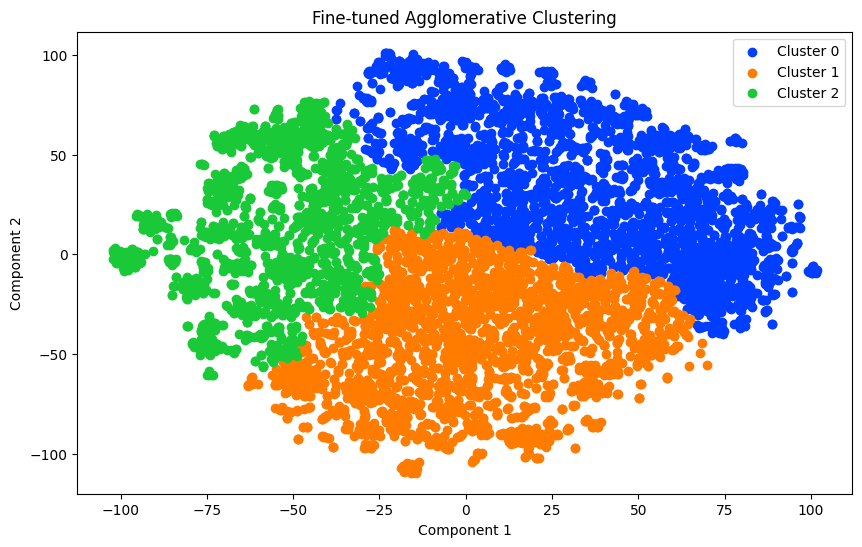

In [ ]:
# Plot the clusters for the fine-tuned Agglomerative Clustering model
if best_finetuned_agg_params:
    # Evaluate the fine-tuned Agglomerative Clustering model
    agg_finetuned_labels = best_finetuned_agg_model.fit_predict(X_tsne)
    agg_finetuned_results = evaluate_clustering('Agglomerative Clustering', best_finetuned_agg_model, X_tsne, agg_finetuned_labels)

    # Print evaluation results
    print("Fine-tuned Agglomerative Clustering Evaluation Results:")
    for metric, value in agg_finetuned_results.items():
        print(f"{metric}: {value}")

    # Plot clusters
    plot_clusters(X_tsne, agg_finetuned_labels, title='Fine-tuned Agglomerative Clustering')

## Spectral Clustering

In [ ]:
import pickle
from sklearn.cluster import SpectralClustering
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score

# Adjusted range of n_clusters and nearest_neighbors
n_clusters_list = [4, 5, 6, 7, 9, 12]  # Expand to include more possible clusters
n_neighbors_list = [5, 10, 15, 20, 25]  # Increase number of neighbors for better graph connectivity


best_finetuned_spectral_score = -1
best_finetuned_spectral_params = {}

# To store the results for plotting
spectral_results = []
params_list = []
silhouette_scores = []

# Perform Grid Search for Spectral Clustering (fine-tuned version)
for n_clusters in n_clusters_list:
    for n_neighbors in n_neighbors_list:
        # Initialize Spectral Clustering with specific parameters
        spectral_finetuned_model = SpectralClustering(
            n_clusters=n_clusters,
            affinity='nearest_neighbors',
            n_neighbors=n_neighbors,  # Adding n_neighbors to tune graph connectivity
            assign_labels='kmeans',
            random_state=42
        )
        spectral_finetuned_labels = spectral_finetuned_model.fit_predict(X_tsne)

        # Calculate evaluation metrics
        silhouette_finetuned_avg = silhouette_score(X_tsne, spectral_finetuned_labels)
        ch_finetuned_score = calinski_harabasz_score(X_tsne, spectral_finetuned_labels)
        db_finetuned_score = davies_bouldin_score(X_tsne, spectral_finetuned_labels)

        # Store result for plotting
        spectral_results.append((X_tsne, spectral_finetuned_labels))
        params_list.append((n_clusters, n_neighbors))
        silhouette_scores.append(silhouette_finetuned_avg)

        # Print the current parameter results
        print(f"n_clusters: {n_clusters}, n_neighbors: {n_neighbors}")
        print(f"  Silhouette Score: {silhouette_finetuned_avg}")
        print(f"  Calinski-Harabasz Score: {ch_finetuned_score}")
        print(f"  Davies-Bouldin Score: {db_finetuned_score}\n")

        # Choose a score to optimize, here we maximize silhouette_score
        if silhouette_finetuned_avg > best_finetuned_spectral_score:
            best_finetuned_spectral_score = silhouette_finetuned_avg
            best_finetuned_spectral_params = {
                'n_clusters': n_clusters,
                'n_neighbors': n_neighbors,
                'silhouette_score': silhouette_finetuned_avg,
                'calinski_harabasz_score': ch_finetuned_score,
                'davies_bouldin_score': db_finetuned_score
            }
            best_finetuned_spectral_model = spectral_finetuned_model  # Save the best model so far

# Print the best parameters after grid search
print(f"Best Fine-tuned Spectral Clustering Parameters: {best_finetuned_spectral_params}")

# Save the best Spectral Clustering model to a pickle file
model_path = '/content/drive/MyDrive/ML/spectral_finetuned_model.pkl'
with open(model_path, 'wb') as model_file:
    pickle.dump(best_finetuned_spectral_model, model_file)

print(f"Best Spectral Clustering model saved to {model_path}")


/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_spectral_embedding.py:273: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


n_clusters: 4, n_neighbors: 5
  Silhouette Score: -0.08367884159088135
  Calinski-Harabasz Score: 28.237811856875084
  Davies-Bouldin Score: 9.245930442693176



/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_spectral_embedding.py:273: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


n_clusters: 4, n_neighbors: 10
  Silhouette Score: -0.15117856860160828
  Calinski-Harabasz Score: 39.71913469434049
  Davies-Bouldin Score: 1.6990486665081574



/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_spectral_embedding.py:273: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


n_clusters: 4, n_neighbors: 15
  Silhouette Score: 0.08267977833747864
  Calinski-Harabasz Score: 1586.0195763466988
  Davies-Bouldin Score: 0.8995128748466233



/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_spectral_embedding.py:273: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


n_clusters: 4, n_neighbors: 20
  Silhouette Score: 0.29272109270095825
  Calinski-Harabasz Score: 4579.412267544248
  Davies-Bouldin Score: 0.7961236574978822



/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_spectral_embedding.py:273: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


n_clusters: 4, n_neighbors: 25
  Silhouette Score: 0.2924845516681671
  Calinski-Harabasz Score: 4571.549613239801
  Davies-Bouldin Score: 0.7960592832446731



/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_spectral_embedding.py:273: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


n_clusters: 5, n_neighbors: 5
  Silhouette Score: 0.0577530562877655
  Calinski-Harabasz Score: 1846.6711826994085
  Davies-Bouldin Score: 1.4131096006406163



/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_spectral_embedding.py:273: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


n_clusters: 5, n_neighbors: 10
  Silhouette Score: 0.07204681634902954
  Calinski-Harabasz Score: 1204.1503590999966
  Davies-Bouldin Score: 3.1382686514249163



/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_spectral_embedding.py:273: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


n_clusters: 5, n_neighbors: 15
  Silhouette Score: 0.16956783831119537
  Calinski-Harabasz Score: 3325.590799060864
  Davies-Bouldin Score: 0.7808320747811632



/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_spectral_embedding.py:273: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


n_clusters: 5, n_neighbors: 20
  Silhouette Score: 0.2436842918395996
  Calinski-Harabasz Score: 4342.85015332759
  Davies-Bouldin Score: 0.7489433413595749



/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_spectral_embedding.py:273: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


n_clusters: 5, n_neighbors: 25
  Silhouette Score: 0.2413952499628067
  Calinski-Harabasz Score: 4397.89269765683
  Davies-Bouldin Score: 0.748086172642444



/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_spectral_embedding.py:273: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


n_clusters: 6, n_neighbors: 5
  Silhouette Score: -0.38878583908081055
  Calinski-Harabasz Score: 5.505894445737484
  Davies-Bouldin Score: 12.05114079431707



/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_spectral_embedding.py:273: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


n_clusters: 6, n_neighbors: 10
  Silhouette Score: 0.19548740983009338
  Calinski-Harabasz Score: 2633.624933599964
  Davies-Bouldin Score: 2.5040263451547884



/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_spectral_embedding.py:273: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


n_clusters: 6, n_neighbors: 15
  Silhouette Score: 0.1414022147655487
  Calinski-Harabasz Score: 3443.5152189341375
  Davies-Bouldin Score: 0.7473532499326582



/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_spectral_embedding.py:273: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


n_clusters: 6, n_neighbors: 20
  Silhouette Score: 0.2430606186389923
  Calinski-Harabasz Score: 4683.146727792956
  Davies-Bouldin Score: 0.801804633133588



/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_spectral_embedding.py:273: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


n_clusters: 6, n_neighbors: 25
  Silhouette Score: 0.24812714755535126
  Calinski-Harabasz Score: 4697.9200244984095
  Davies-Bouldin Score: 0.7979093175228685



/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_spectral_embedding.py:273: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


n_clusters: 7, n_neighbors: 5
  Silhouette Score: -0.3371122181415558
  Calinski-Harabasz Score: 13.623357859580407
  Davies-Bouldin Score: 3.229705491654279



/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_spectral_embedding.py:273: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


n_clusters: 7, n_neighbors: 10
  Silhouette Score: -0.038972657173871994
  Calinski-Harabasz Score: 828.6518991596214
  Davies-Bouldin Score: 3.99819137353319



/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_spectral_embedding.py:273: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


n_clusters: 7, n_neighbors: 15
  Silhouette Score: 0.13871583342552185
  Calinski-Harabasz Score: 3013.7250557357015
  Davies-Bouldin Score: 0.9018135641514251



/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_spectral_embedding.py:273: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


n_clusters: 7, n_neighbors: 20
  Silhouette Score: 0.2735913395881653
  Calinski-Harabasz Score: 4974.142136805493
  Davies-Bouldin Score: 0.8210948552543496



/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_spectral_embedding.py:273: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


n_clusters: 7, n_neighbors: 25
  Silhouette Score: 0.27644726634025574
  Calinski-Harabasz Score: 5064.374711990457
  Davies-Bouldin Score: 0.8223107035925669



/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_spectral_embedding.py:273: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


n_clusters: 9, n_neighbors: 5
  Silhouette Score: -0.039045706391334534
  Calinski-Harabasz Score: 1027.1986101779357
  Davies-Bouldin Score: 2.963335923587517



/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_spectral_embedding.py:273: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


n_clusters: 9, n_neighbors: 10
  Silhouette Score: 0.06019742041826248
  Calinski-Harabasz Score: 1513.131433707435
  Davies-Bouldin Score: 1.9715613253296946



/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_spectral_embedding.py:273: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


n_clusters: 9, n_neighbors: 15
  Silhouette Score: 0.1571797877550125
  Calinski-Harabasz Score: 3644.7947299534217
  Davies-Bouldin Score: 0.7625741127305538



/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_spectral_embedding.py:273: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


n_clusters: 9, n_neighbors: 20
  Silhouette Score: 0.26161932945251465
  Calinski-Harabasz Score: 4813.14509902914
  Davies-Bouldin Score: 0.7406742152035724



/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_spectral_embedding.py:273: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


n_clusters: 9, n_neighbors: 25
  Silhouette Score: 0.2707269787788391
  Calinski-Harabasz Score: 5062.1032104119295
  Davies-Bouldin Score: 0.7303474652481778



/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_spectral_embedding.py:273: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


n_clusters: 12, n_neighbors: 5
  Silhouette Score: -0.09982225298881531
  Calinski-Harabasz Score: 837.4080416346814
  Davies-Bouldin Score: 4.4206590082899115



/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_spectral_embedding.py:273: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


n_clusters: 12, n_neighbors: 10
  Silhouette Score: 0.13639454543590546
  Calinski-Harabasz Score: 2519.595359951888
  Davies-Bouldin Score: 1.7070119416492113



/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_spectral_embedding.py:273: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


n_clusters: 12, n_neighbors: 15
  Silhouette Score: 0.09589860588312149
  Calinski-Harabasz Score: 2720.159745347151
  Davies-Bouldin Score: 0.7285890280017396



/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_spectral_embedding.py:273: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


n_clusters: 12, n_neighbors: 20
  Silhouette Score: 0.23187021911144257
  Calinski-Harabasz Score: 4568.149024083136
  Davies-Bouldin Score: 0.8041384568524516



/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_spectral_embedding.py:273: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


n_clusters: 12, n_neighbors: 25
  Silhouette Score: 0.27005451917648315
  Calinski-Harabasz Score: 5215.622861330498
  Davies-Bouldin Score: 0.7945632829472826

Best Fine-tuned Spectral Clustering Parameters: {'n_clusters': 4, 'n_neighbors': 20, 'silhouette_score': 0.2927211, 'calinski_harabasz_score': 4579.412267544248, 'davies_bouldin_score': 0.7961236574978822}
Best Spectral Clustering model saved to /content/drive/MyDrive/ML/spectral_finetuned_model.pkl


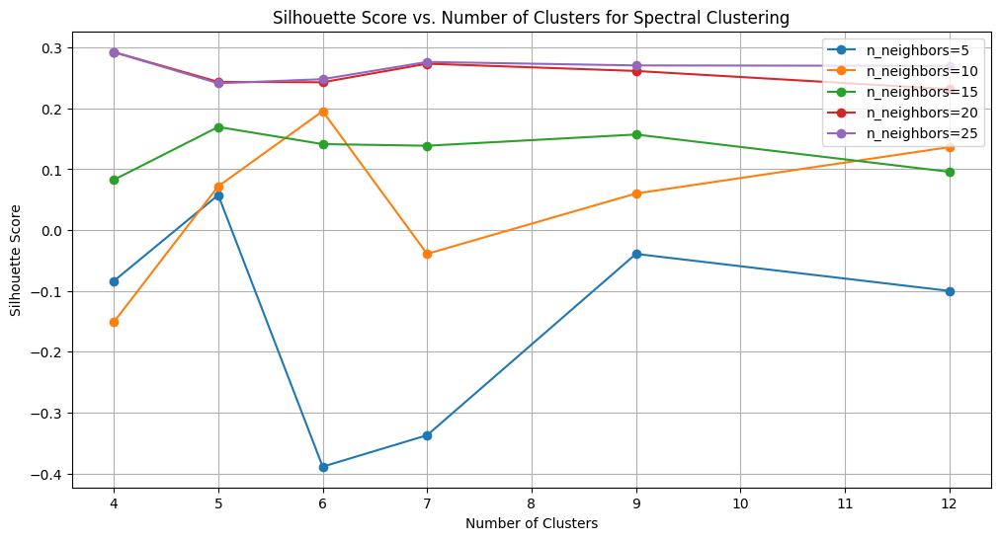

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))

# Prepare data for plotting
for n_neighbors in n_neighbors_list:
    scores = [silhouette_scores[j] for j, params in enumerate(params_list) if params[1] == n_neighbors]
    n_clusters_list_ = [params[0] for j, params in enumerate(params_list) if params[1] == n_neighbors]
    plt.plot(n_clusters_list_, scores, marker='o', label=f'n_neighbors={n_neighbors}')

plt.title('Silhouette Score vs. Number of Clusters for Spectral Clustering')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.legend(loc='upper right', bbox_to_anchor=(1, 1))
plt.grid(True)
plt.show()


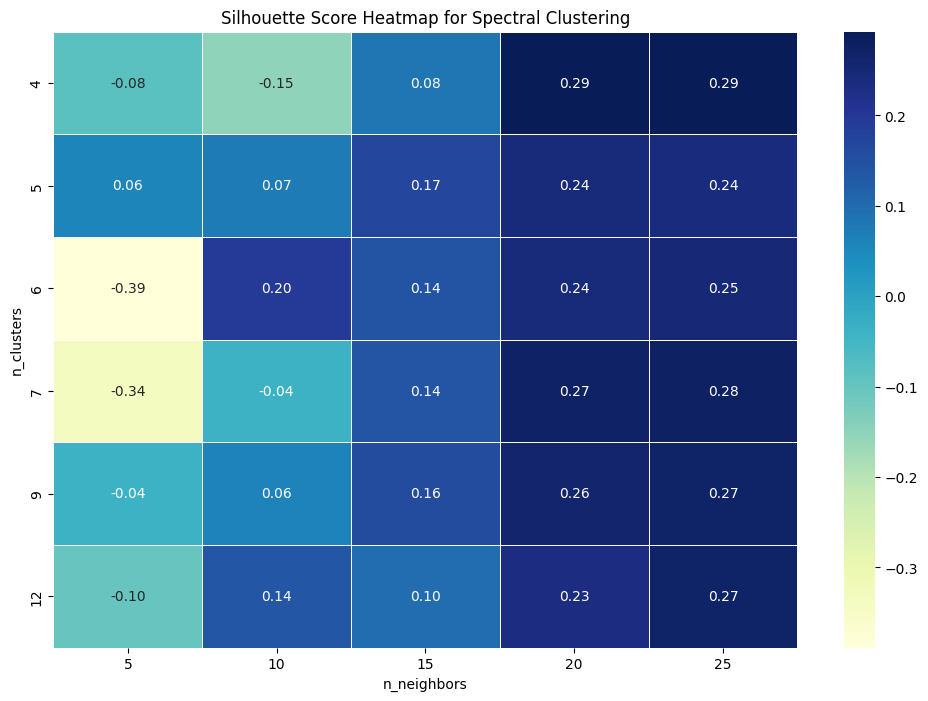

In [ ]:
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt

# Create a DataFrame for heatmap
heatmap_data = {
    'n_clusters': [params[0] for params in params_list],
    'n_neighbors': [params[1] for params in params_list],
    'silhouette_score': silhouette_scores
}

df_heatmap = pd.DataFrame(heatmap_data)

# Pivot for heatmap
heatmap_pivot = df_heatmap.pivot_table(index="n_clusters", columns="n_neighbors", values="silhouette_score")

plt.figure(figsize=(12, 8))
sns.heatmap(heatmap_pivot, annot=True, cmap="YlGnBu", fmt=".2f", linewidths=.5)
plt.title('Silhouette Score Heatmap for Spectral Clustering')
plt.show()


/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_spectral_embedding.py:273: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_spectral_embedding.py:273: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


Fine-tuned Spectral Clustering Evaluation Results:
Model: Spectral Clustering
Silhouette Score: 0.29272109270095825
Davies-Bouldin Index: 0.7961236574978822
Calinski-Harabasz Index: 4579.412267544248
Runtime (seconds): 6.648134231567383


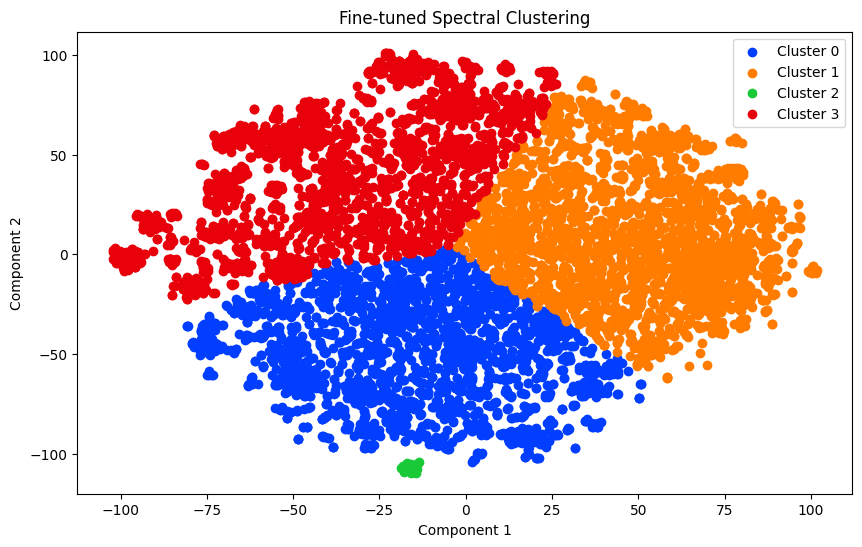

In [ ]:

# Plot the clusters for the fine-tuned Spectral Clustering model
if best_finetuned_spectral_params:
    # Evaluate the fine-tuned Spectral Clustering model
    spectral_finetuned_labels = best_finetuned_spectral_model.fit_predict(X_tsne)
    spectral_finetuned_results = evaluate_clustering('Spectral Clustering', best_finetuned_spectral_model, X_tsne, spectral_finetuned_labels)

    # Print evaluation results
    print("Fine-tuned Spectral Clustering Evaluation Results:")
    for metric, value in spectral_finetuned_results.items():
        print(f"{metric}: {value}")

    # Plot clusters
    plot_clusters(X_tsne, spectral_finetuned_labels, title='Fine-tuned Spectral Clustering')


##DBSCAN Clustering

In [ ]:
import pickle
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score

# Adjusted range of eps and min_samples to try for DBSCAN
eps_list = [1.0, 1.2, 1.5, 2.0]  # Increased eps values to capture more points in clusters
min_samples_list = [3, 5, 7, 10]  # Narrowing min_samples for a finer balance between density and core points

best_finetuned_dbscan_score = -1
best_finetuned_dbscan_params = {}

# To store the results for plotting
DBSCAN_results = []
params_list = []
silhouette_scores = []

# Perform Grid Search for DBSCAN (fine-tuned version)
for eps in eps_list:
    for min_samples in min_samples_list:
        # Initialize DBSCAN with specific parameters
        dbscan_finetuned_model = DBSCAN(eps=eps, min_samples=min_samples)
        dbscan_finetuned_labels = dbscan_finetuned_model.fit_predict(X_tsne)

        # Count the number of clusters, excluding noise (label -1)
        n_clusters = len(set(dbscan_finetuned_labels)) - (1 if -1 in dbscan_finetuned_labels else 0)

        # Check if DBSCAN identified clusters
        if n_clusters > 1:  # DBSCAN might result in only one cluster or noise
            # Calculate evaluation metrics
            silhouette_finetuned_avg = silhouette_score(X_tsne, dbscan_finetuned_labels)
            ch_finetuned_score = calinski_harabasz_score(X_tsne, dbscan_finetuned_labels)
            db_finetuned_score = davies_bouldin_score(X_tsne, dbscan_finetuned_labels)

            # Store result for plotting
            DBSCAN_results.append((X_tsne, dbscan_finetuned_labels))
            params_list.append((eps, min_samples,n_clusters))
            silhouette_scores.append(silhouette_finetuned_avg)

            # Print the current parameter results
            print(f"eps: {eps}, min_samples: {min_samples}, n_clusters: {n_clusters}")
            print(f"  Silhouette Score: {silhouette_finetuned_avg}")
            print(f"  Calinski-Harabasz Score: {ch_finetuned_score}")
            print(f"  Davies-Bouldin Score: {db_finetuned_score}\n")

            # Choose a score to optimize, here we maximize silhouette_score
            if silhouette_finetuned_avg > best_finetuned_dbscan_score:
                best_finetuned_dbscan_score = silhouette_finetuned_avg
                best_finetuned_dbscan_params = {
                    'eps': eps,
                    'min_samples': min_samples,
                    'n_clusters': n_clusters,  # Store the number of clusters
                    'silhouette_score': silhouette_finetuned_avg,
                    'calinski_harabasz_score': ch_finetuned_score,
                    'davies_bouldin_score': db_finetuned_score
                }
                best_finetuned_dbscan_model = dbscan_finetuned_model  # Save the best model so far
        else:
            print(f"eps: {eps}, min_samples: {min_samples} resulted in no valid clusters\n")

# Print the best parameters after grid search
print(f"Best Fine-tuned DBSCAN Parameters: {best_finetuned_dbscan_params}")

# Save the best DBSCAN model to a pickle file
model_path = '/content/drive/MyDrive/ML/dbscan_finetuned_model.pkl'
with open(model_path, 'wb') as model_file:
    pickle.dump(best_finetuned_dbscan_model, model_file)

print(f"Best DBSCAN model saved to {model_path}")


eps: 1.0, min_samples: 3, n_clusters: 1073
  Silhouette Score: 0.14352701604366302
  Calinski-Harabasz Score: 16.66389161037165
  Davies-Bouldin Score: 1.3616971407315863

eps: 1.0, min_samples: 5, n_clusters: 376
  Silhouette Score: -0.38200825452804565
  Calinski-Harabasz Score: 12.039937615185263
  Davies-Bouldin Score: 1.4001823374651317

eps: 1.0, min_samples: 7, n_clusters: 101
  Silhouette Score: -0.6978322267532349
  Calinski-Harabasz Score: 12.95953078462442
  Davies-Bouldin Score: 1.236617327327628

eps: 1.0, min_samples: 10, n_clusters: 7
  Silhouette Score: -0.5728577375411987
  Calinski-Harabasz Score: 16.452865821480394
  Davies-Bouldin Score: 1.148252767033791

eps: 1.2, min_samples: 3, n_clusters: 1002
  Silhouette Score: 0.24537183344364166
  Calinski-Harabasz Score: 30.92310060355049
  Davies-Bouldin Score: 1.3405605898504143

eps: 1.2, min_samples: 5, n_clusters: 467
  Silhouette Score: -0.14759348332881927
  Calinski-Harabasz Score: 19.24925218784879
  Davies-Bouldi

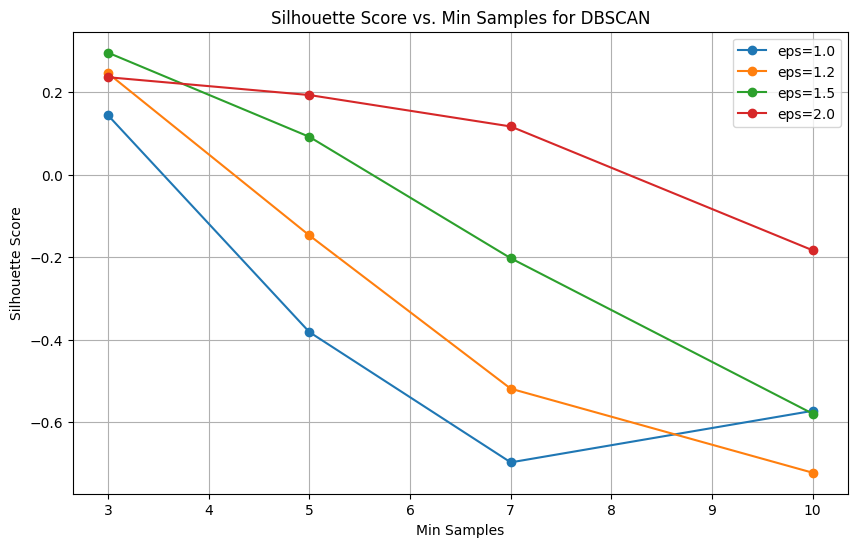

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))

# Prepare data for plotting
for i, eps in enumerate(eps_list):
    scores = [silhouette_scores[j] for j, params in enumerate(params_list) if params[0] == eps]
    min_samples_list_ = [params[1] for j, params in enumerate(params_list) if params[0] == eps]
    plt.plot(min_samples_list_, scores, marker='o', label=f'eps={eps}')

plt.title('Silhouette Score vs. Min Samples for DBSCAN')
plt.xlabel('Min Samples')
plt.ylabel('Silhouette Score')
plt.legend(loc='upper right', bbox_to_anchor=(1, 1))
plt.grid(True)
plt.show()


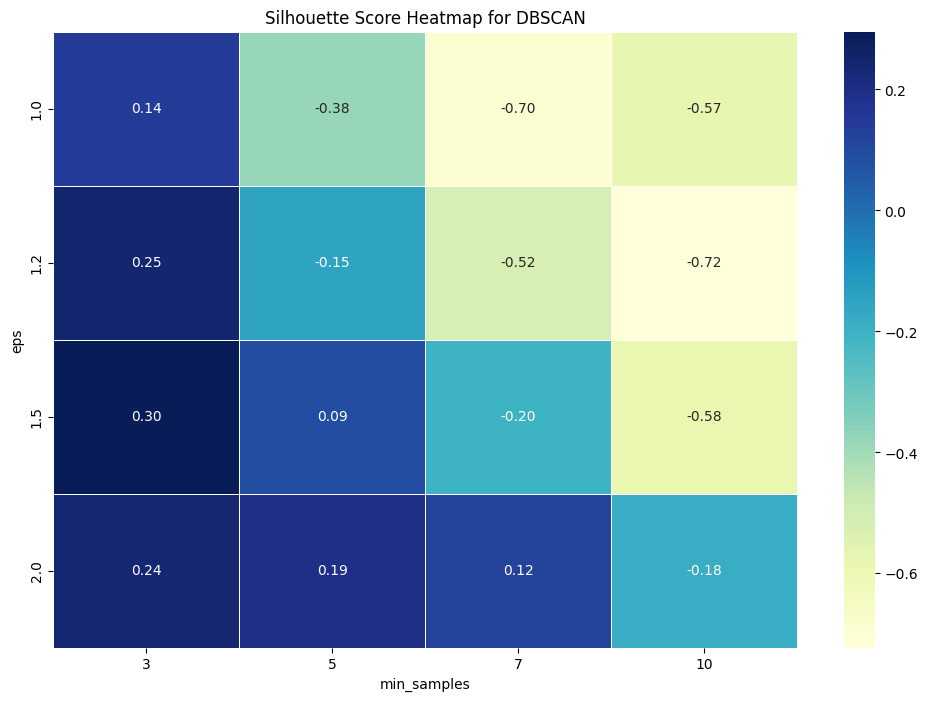

In [ ]:
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt

# Create a DataFrame for heatmap
heatmap_data = {
    'eps': [params[0] for params in params_list],
    'min_samples': [params[1] for params in params_list],
    'silhouette_score': silhouette_scores
}

df_heatmap = pd.DataFrame(heatmap_data)

# Pivot for heatmap
heatmap_pivot = df_heatmap.pivot_table(index="eps", columns="min_samples", values="silhouette_score")

plt.figure(figsize=(12, 8))
sns.heatmap(heatmap_pivot, annot=True, cmap="YlGnBu", fmt=".2f", linewidths=.5)
plt.title('Silhouette Score Heatmap for DBSCAN')
plt.show()


Fine-tuned DBSCAN Clustering Evaluation Results:
Model: DBSCAN
Silhouette Score: 0.29547563195228577
Davies-Bouldin Index: 1.3659429808582382
Calinski-Harabasz Index: 67.00894724133518
Runtime (seconds): 0.0706338882446289


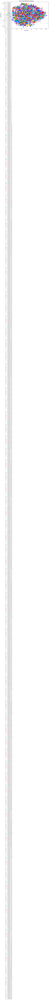

In [ ]:
# Plot the clusters for the fine-tuned DBSCAN model
if best_finetuned_dbscan_params:
    # Evaluate the fine-tuned DBSCAN model
    dbscan_finetuned_labels = best_finetuned_dbscan_model.fit_predict(X_tsne)
    dbscan_finetuned_results = evaluate_clustering('DBSCAN', best_finetuned_dbscan_model, X_tsne, dbscan_finetuned_labels)

    # Print evaluation results
    print("Fine-tuned DBSCAN Clustering Evaluation Results:")
    for metric, value in dbscan_finetuned_results.items():
        print(f"{metric}: {value}")

    # Plot clusters
    plot_clusters(X_tsne, dbscan_finetuned_labels, title='Fine-tuned DBSCAN Clustering')


## HDBSCAN Clustering

In [ ]:
import pickle
import hdbscan
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score

# Adjusted range of min_cluster_size and min_samples for HDBSCAN
min_cluster_size_list = [20, 30, 50, 100]  # Increase min_cluster_size to reduce the number of clusters
min_samples_list = [10, 20, 30]  # Increase min_samples to ensure fewer, more meaningful clusters

best_finetuned_hdbscan_score = -1
best_finetuned_hdbscan_params = {}

# To store the results for plotting
hdbscan_results = []
params_list = []
silhouette_scores = []

# Perform Grid Search for HDBSCAN (fine-tuned version)
for min_cluster_size in min_cluster_size_list:
    for min_samples in min_samples_list:
        # Initialize HDBSCAN with specific parameters
        hdbscan_finetuned_model = hdbscan.HDBSCAN(min_cluster_size=min_cluster_size, min_samples=min_samples)
        hdbscan_finetuned_labels = hdbscan_finetuned_model.fit_predict(X_tsne)

        # Count the number of clusters, excluding noise (label -1)
        n_clusters = len(set(hdbscan_finetuned_labels)) - (1 if -1 in hdbscan_finetuned_labels else 0)

        # Check if HDBSCAN identified clusters
        if n_clusters > 1 and len(set(hdbscan_finetuned_labels)) != len(hdbscan_finetuned_labels):
            # Calculate evaluation metrics
            silhouette_finetuned_avg = silhouette_score(X_tsne, hdbscan_finetuned_labels)
            ch_finetuned_score = calinski_harabasz_score(X_tsne, hdbscan_finetuned_labels)
            db_finetuned_score = davies_bouldin_score(X_tsne, hdbscan_finetuned_labels)

            # Store result for plotting
            hdbscan_results.append((X_tsne, hdbscan_finetuned_labels))
            params_list.append((min_cluster_size, min_samples,n_clusters))
            silhouette_scores.append(silhouette_finetuned_avg)

            # Print the current parameter results
            print(f"min_cluster_size: {min_cluster_size}, min_samples: {min_samples}, n_clusters: {n_clusters}")
            print(f"  Silhouette Score: {silhouette_finetuned_avg}")
            print(f"  Calinski-Harabasz Score: {ch_finetuned_score}")
            print(f"  Davies-Bouldin Score: {db_finetuned_score}\n")

            # Choose a score to optimize, here we maximize silhouette_score
            if silhouette_finetuned_avg > best_finetuned_hdbscan_score:
                best_finetuned_hdbscan_score = silhouette_finetuned_avg
                best_finetuned_hdbscan_params = {
                    'min_cluster_size': min_cluster_size,
                    'min_samples': min_samples,
                    'n_clusters': n_clusters,  # Store the number of clusters
                    'silhouette_score': silhouette_finetuned_avg,
                    'calinski_harabasz_score': ch_finetuned_score,
                    'davies_bouldin_score': db_finetuned_score
                }
                best_finetuned_hdbscan_model = hdbscan_finetuned_model  # Save the best model so far
        else:
            print(f"min_cluster_size: {min_cluster_size}, min_samples: {min_samples} resulted in no valid clusters\n")

# Print the best parameters after grid search
print(f"Best Fine-tuned HDBSCAN Parameters: {best_finetuned_hdbscan_params}")

# Save the best HDBSCAN model to a pickle file
model_path = '/content/drive/MyDrive/ML/hdbscan_finetuned_model.pkl'
with open(model_path, 'wb') as model_file:
    pickle.dump(best_finetuned_hdbscan_model, model_file)

print(f"Best HDBSCAN model saved to {model_path}")


min_cluster_size: 20, min_samples: 10, n_clusters: 2
  Silhouette Score: 0.13272860646247864
  Calinski-Harabasz Score: 52.55880122856019
  Davies-Bouldin Score: 1.762192425068305

min_cluster_size: 20, min_samples: 20, n_clusters: 2
  Silhouette Score: 0.12391457706689835
  Calinski-Harabasz Score: 59.75438502015427
  Davies-Bouldin Score: 2.830335593939772

min_cluster_size: 20, min_samples: 30, n_clusters: 2
  Silhouette Score: 0.09460408985614777
  Calinski-Harabasz Score: 52.83246660697119
  Davies-Bouldin Score: 5.8168533910008025

min_cluster_size: 30, min_samples: 10, n_clusters: 2
  Silhouette Score: 0.13272860646247864
  Calinski-Harabasz Score: 52.55880122856019
  Davies-Bouldin Score: 1.762192425068305

min_cluster_size: 30, min_samples: 20, n_clusters: 2
  Silhouette Score: 0.12391457706689835
  Calinski-Harabasz Score: 59.75438502015427
  Davies-Bouldin Score: 2.830335593939772

min_cluster_size: 30, min_samples: 30, n_clusters: 2
  Silhouette Score: 0.09460408985614777
 

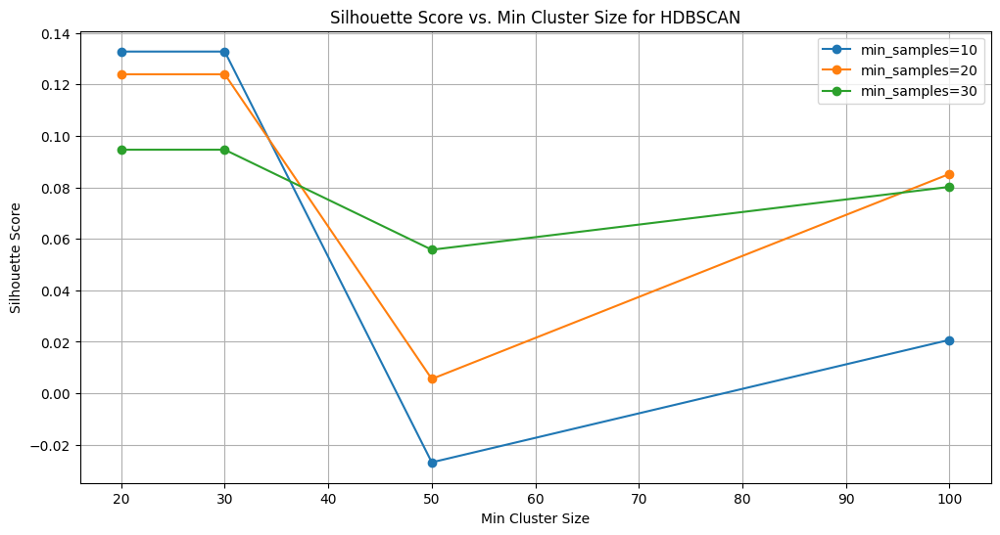

In [ ]:
import matplotlib.pyplot as plt

# Convert params_list to arrays for easier plotting
min_cluster_sizes = [params[0] for params in params_list]
min_samples_list = [params[1] for params in params_list]

plt.figure(figsize=(12, 6))

# Plotting Silhouette Score vs. Min Cluster Size for different Min Samples
for min_samples in sorted(set(min_samples_list)):
    scores = [silhouette_scores[j] for j, params in enumerate(params_list) if params[1] == min_samples]
    cluster_sizes = [params[0] for j, params in enumerate(params_list) if params[1] == min_samples]
    plt.plot(cluster_sizes, scores, marker='o', label=f'min_samples={min_samples}')

plt.title('Silhouette Score vs. Min Cluster Size for HDBSCAN')
plt.xlabel('Min Cluster Size')
plt.ylabel('Silhouette Score')
plt.legend(loc='upper right', bbox_to_anchor=(1, 1))
plt.grid(True)
plt.show()


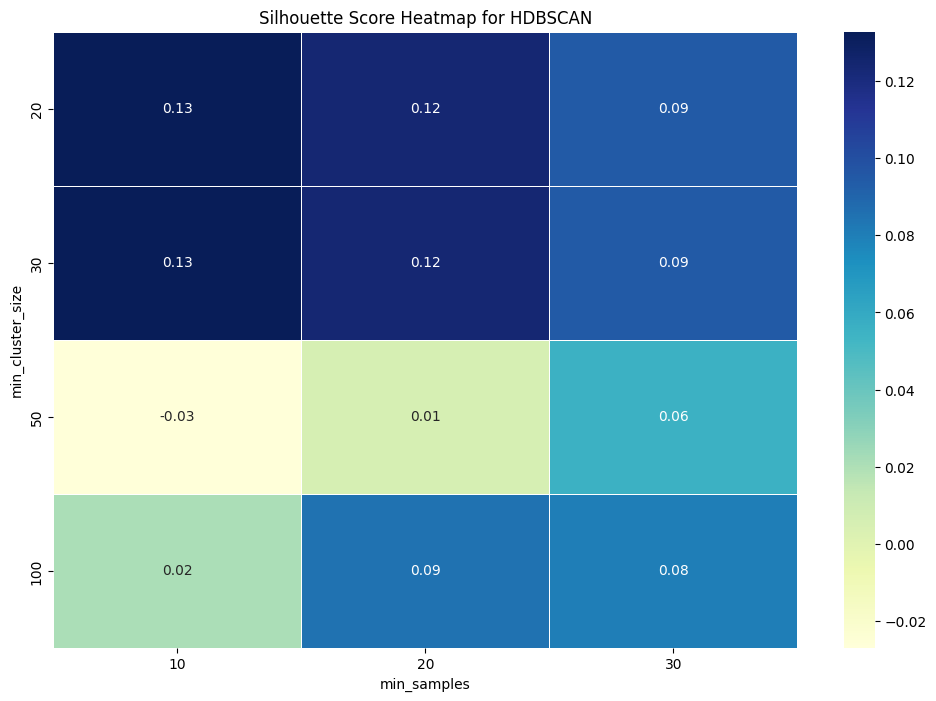

In [ ]:
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt

# Create a DataFrame for heatmap
heatmap_data = {
    'min_cluster_size': [params[0] for params in params_list],
    'min_samples': [params[1] for params in params_list],
    'silhouette_score': silhouette_scores
}

df_heatmap = pd.DataFrame(heatmap_data)

# Pivot for heatmap
heatmap_pivot = df_heatmap.pivot_table(index="min_cluster_size", columns="min_samples", values="silhouette_score")

plt.figure(figsize=(12, 8))
sns.heatmap(heatmap_pivot, annot=True, cmap="YlGnBu", fmt=".2f", linewidths=.5)
plt.title('Silhouette Score Heatmap for HDBSCAN')
plt.show()


Fine-tuned HDBSCAN Clustering Evaluation Results:
Model: HDBSCAN
Silhouette Score: 0.13272860646247864
Davies-Bouldin Index: 1.762192425068305
Calinski-Harabasz Index: 52.55880122856019
Runtime (seconds): 0.3495798110961914


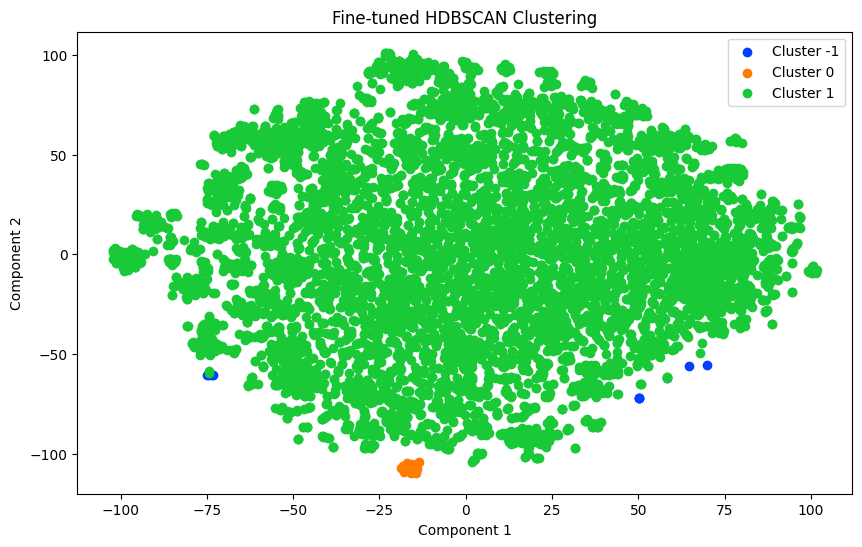

In [ ]:

# Plot the clusters for the fine-tuned HDBSCAN model
if best_finetuned_hdbscan_params:
    # Evaluate the fine-tuned HDBSCAN model
    hdbscan_finetuned_labels = best_finetuned_hdbscan_model.fit_predict(X_tsne)
    hdbscan_finetuned_results = evaluate_clustering('HDBSCAN', best_finetuned_hdbscan_model, X_tsne, hdbscan_finetuned_labels)

    # Print evaluation results
    print("Fine-tuned HDBSCAN Clustering Evaluation Results:")
    for metric, value in hdbscan_finetuned_results.items():
        print(f"{metric}: {value}")

    # Plot clusters
    plot_clusters(X_tsne, hdbscan_finetuned_labels, title='Fine-tuned HDBSCAN Clustering')


## Mean Shift Clustering

In [ ]:
import pickle
from sklearn.cluster import MeanShift
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score

# Adjusted range of bandwidth for Mean Shift
bandwidth_list = [2.5, 3.0, 4.0, 5.0]  # Focus on larger bandwidth values to reduce the number of clusters

best_finetuned_meanshift_score = -1
best_finetuned_meanshift_params = {}

# To store the results for plotting
meanShift_results = []
params_list = []
silhouette_scores = []

# Perform Grid Search for Mean Shift (fine-tuned version)
for bandwidth in bandwidth_list:
    # Initialize Mean Shift with specific bandwidth
    meanshift_finetuned_model = MeanShift(bandwidth=bandwidth)
    meanshift_finetuned_labels = meanshift_finetuned_model.fit_predict(X_tsne)

    # Count the number of clusters, excluding noise (label -1 if present)
    n_clusters = len(set(meanshift_finetuned_labels)) - (1 if -1 in meanshift_finetuned_labels else 0)

    # Check if Mean Shift identified clusters
    if n_clusters > 1:  # Check if there is more than one cluster
        # Calculate evaluation metrics
        silhouette_finetuned_avg = silhouette_score(X_tsne, meanshift_finetuned_labels)
        ch_finetuned_score = calinski_harabasz_score(X_tsne, meanshift_finetuned_labels)
        db_finetuned_score = davies_bouldin_score(X_tsne, meanshift_finetuned_labels)

        # Store result for plotting
        meanShift_results.append((X_tsne, meanshift_finetuned_labels))
        params_list.append((bandwidth, n_clusters))
        silhouette_scores.append(silhouette_finetuned_avg)

        # Print the current parameter results
        print(f"bandwidth: {bandwidth}, n_clusters: {n_clusters}")
        print(f"  Silhouette Score: {silhouette_finetuned_avg}")
        print(f"  Calinski-Harabasz Score: {ch_finetuned_score}")
        print(f"  Davies-Bouldin Score: {db_finetuned_score}\n")

        # Choose a score to optimize, here we maximize silhouette_score
        if silhouette_finetuned_avg > best_finetuned_meanshift_score:
            best_finetuned_meanshift_score = silhouette_finetuned_avg
            best_finetuned_meanshift_params = {
                'bandwidth': bandwidth,
                'n_clusters': n_clusters,  # Store the number of clusters
                'silhouette_score': silhouette_finetuned_avg,
                'calinski_harabasz_score': ch_finetuned_score,
                'davies_bouldin_score': db_finetuned_score
            }
            best_finetuned_meanshift_model = meanshift_finetuned_model  # Save the best model so far
    else:
        print(f"bandwidth: {bandwidth} resulted in no valid clusters\n")

# Print the best parameters after grid search
print(f"Best Fine-tuned Mean Shift Parameters: {best_finetuned_meanshift_params}")

# Save the best Mean Shift model to a pickle file
model_path = '/content/drive/MyDrive/ML/meanshift_finetuned_model.pkl'
with open(model_path, 'wb') as model_file:
    pickle.dump(best_finetuned_meanshift_model, model_file)

print(f"Best Mean Shift model saved to {model_path}")


bandwidth: 2.5, n_clusters: 996
  Silhouette Score: 0.4629116356372833
  Calinski-Harabasz Score: 11921.305899702033
  Davies-Bouldin Score: 0.6072919088898076

bandwidth: 3.0, n_clusters: 745
  Silhouette Score: 0.44265177845954895
  Calinski-Harabasz Score: 10772.735186039496
  Davies-Bouldin Score: 0.670347296054824

bandwidth: 4.0, n_clusters: 483
  Silhouette Score: 0.4127618372440338
  Calinski-Harabasz Score: 9673.555461088308
  Davies-Bouldin Score: 0.7360518407811111

bandwidth: 5.0, n_clusters: 355
  Silhouette Score: 0.38087764382362366
  Calinski-Harabasz Score: 8971.95938400601
  Davies-Bouldin Score: 0.7846380596498672

Best Fine-tuned Mean Shift Parameters: {'bandwidth': 2.5, 'n_clusters': 996, 'silhouette_score': 0.46291164, 'calinski_harabasz_score': 11921.305899702033, 'davies_bouldin_score': 0.6072919088898076}
Best Mean Shift model saved to /content/drive/MyDrive/ML/meanshift_finetuned_model.pkl


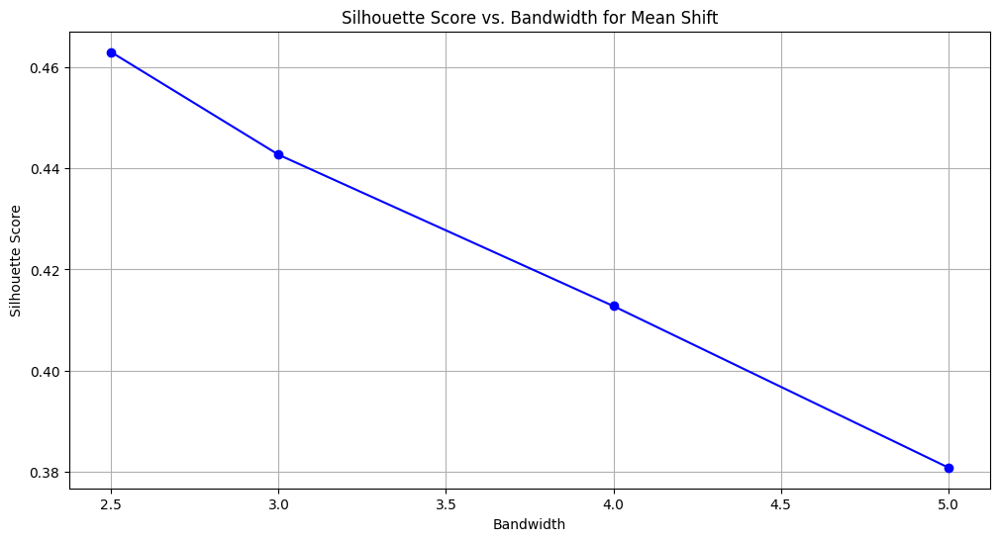

In [ ]:
import matplotlib.pyplot as plt

# Convert params_list to arrays for easier plotting
bandwidths = [params[0] for params in params_list]
silhouette_scores = silhouette_scores

plt.figure(figsize=(12, 6))

# Plotting Silhouette Score vs. Bandwidth
plt.plot(bandwidths, silhouette_scores, marker='o', linestyle='-', color='b')

plt.title('Silhouette Score vs. Bandwidth for Mean Shift')
plt.xlabel('Bandwidth')
plt.ylabel('Silhouette Score')
plt.grid(True)
plt.show()


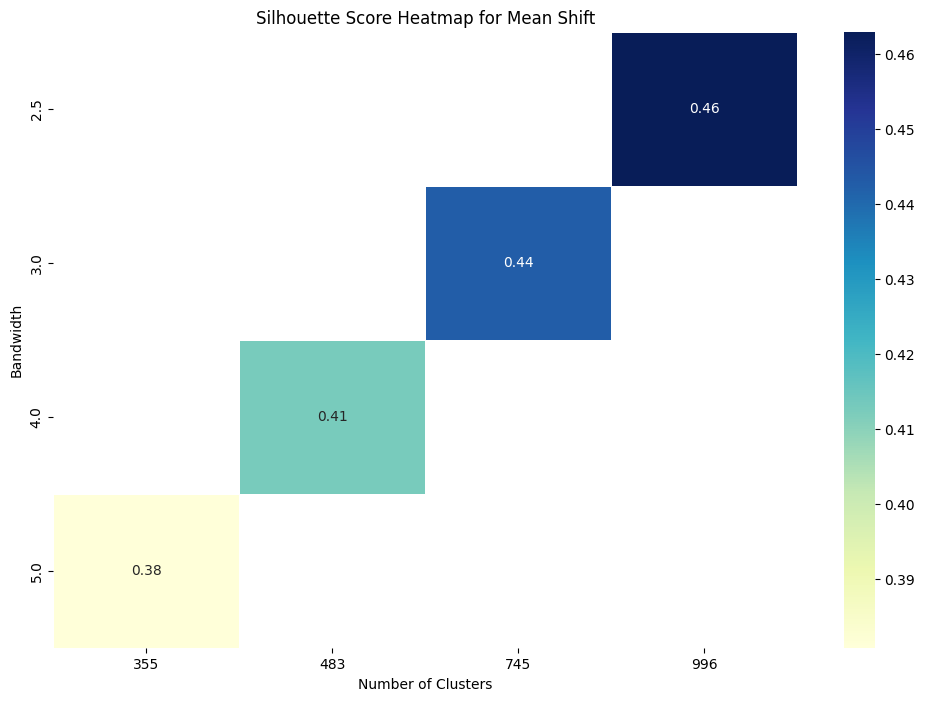

In [ ]:
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt

# Create a DataFrame for heatmap
heatmap_data = {
    'bandwidth': [params[0] for params in params_list],
    'n_clusters': [params[1] for params in params_list],
    'silhouette_score': silhouette_scores
}

df_heatmap = pd.DataFrame(heatmap_data)

# Pivot for heatmap (bandwidth as index, n_clusters as columns)
heatmap_pivot = df_heatmap.pivot_table(index='bandwidth', columns='n_clusters', values='silhouette_score', aggfunc='mean')

plt.figure(figsize=(12, 8))
sns.heatmap(heatmap_pivot, annot=True, cmap="YlGnBu", fmt=".2f", linewidths=.5)
plt.title('Silhouette Score Heatmap for Mean Shift')
plt.xlabel('Number of Clusters')
plt.ylabel('Bandwidth')
plt.show()


Fine-tuned Mean Shift Clustering Evaluation Results:
Model: Mean Shift
Silhouette Score: 0.4629116356372833
Davies-Bouldin Index: 0.6072919088898076
Calinski-Harabasz Index: 11921.305899702033
WCSS: 1.4466662752602735
Runtime (seconds): 19.557442665100098


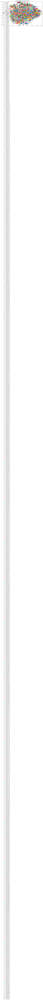

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

def plot_clusterss(X, labels, title='Cluster Plot'):
    # Set figure size and resolution (dpi)
    plt.figure(figsize=(10, 6), dpi=80)  # Reduced dpi for a more manageable image size

    # Scatter plot of the clusters
    unique_labels = set(labels)
    for label in unique_labels:
        cluster_points = X[labels == label]
        plt.scatter(cluster_points[:, 0], cluster_points[:, 1], label=f'Cluster {label}')

    # Add title and legend
    plt.title(title)
    plt.legend()

    # Adjust axis limits to avoid large scaling issues
    plt.xlim(X[:, 0].min() - 0.1, X[:, 0].max() + 0.1)
    plt.ylim(X[:, 1].min() - 0.1, X[:, 1].max() + 0.1)

    # Prevent overly large scaling in case of extreme values in X
    plt.gca().set_aspect('auto', adjustable='box')

    # Show plot
    plt.show()

# Plot the clusters for the fine-tuned Mean Shift model
if best_finetuned_meanshift_params:
    # Evaluate the fine-tuned Mean Shift model
    meanshift_finetuned_labels = best_finetuned_meanshift_model.fit_predict(X_tsne)
    meanshift_finetuned_results = evaluate_clustering('Mean Shift', best_finetuned_meanshift_model, X_tsne, meanshift_finetuned_labels)

    # Print evaluation results
    print("Fine-tuned Mean Shift Clustering Evaluation Results:")
    for metric, value in meanshift_finetuned_results.items():
        print(f"{metric}: {value}")

    # Plot clusters
    plot_clusterss(X_tsne, meanshift_finetuned_labels, title='Fine-tuned Mean Shift Clustering')

##Birch Clustering

In [ ]:
import pickle
from sklearn.cluster import Birch
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score

# Adjusted range of n_clusters and threshold for Birch
n_clusters_list = [5, 8, 10, 12, 15, 20]  # Increase cluster count for broader testing
threshold_list = [0.3, 0.4, 0.5, 0.6]  # Moderate threshold values to reduce over-segmentation


best_finetuned_birch_score = -1
best_finetuned_birch_params = {}

# To store the results for plotting
birch_results = []
params_list = []
silhouette_scores = []

# Perform Grid Search for Birch (fine-tuned version)
for n_clusters in n_clusters_list:
    for threshold in threshold_list:
        # Initialize Birch with specific parameters
        birch_finetuned_model = Birch(n_clusters=n_clusters, threshold=threshold)
        birch_finetuned_labels = birch_finetuned_model.fit_predict(X_tsne)

        # Check if Birch identified clusters
        if len(set(birch_finetuned_labels)) > 1:  # Check if there is more than one cluster
            # Calculate evaluation metrics
            silhouette_finetuned_avg = silhouette_score(X_tsne, birch_finetuned_labels)
            ch_finetuned_score = calinski_harabasz_score(X_tsne, birch_finetuned_labels)
            db_finetuned_score = davies_bouldin_score(X_tsne, birch_finetuned_labels)

            # Store result for plotting
            birch_results.append((X_tsne, birch_finetuned_labels))
            params_list.append((n_clusters, threshold))
            silhouette_scores.append(silhouette_finetuned_avg)

            # Print the current parameter results
            print(f"n_clusters: {n_clusters}, threshold: {threshold}")
            print(f"  Silhouette Score: {silhouette_finetuned_avg}")
            print(f"  Calinski-Harabasz Score: {ch_finetuned_score}")
            print(f"  Davies-Bouldin Score: {db_finetuned_score}\n")

            # Choose a score to optimize, here we maximize silhouette_score
            if silhouette_finetuned_avg > best_finetuned_birch_score:
                best_finetuned_birch_score = silhouette_finetuned_avg
                best_finetuned_birch_params = {
                    'n_clusters': n_clusters,
                    'threshold': threshold,
                    'silhouette_score': silhouette_finetuned_avg,
                    'calinski_harabasz_score': ch_finetuned_score,
                    'davies_bouldin_score': db_finetuned_score
                }
                best_finetuned_birch_model = birch_finetuned_model  # Save the best model so far
        else:
            print(f"n_clusters: {n_clusters}, threshold: {threshold} resulted in no valid clusters\n")

# Print the best parameters after grid search
print(f"Best Fine-tuned Birch Parameters: {best_finetuned_birch_params}")

# Save the best Birch model to a pickle file
model_path = '/content/drive/MyDrive/ML/birch_finetuned_model.pkl'
with open(model_path, 'wb') as model_file:
    pickle.dump(best_finetuned_birch_model, model_file)

print(f"Best Birch model saved to {model_path}")




n_clusters: 5, threshold: 0.3
  Silhouette Score: 0.2992832362651825
  Calinski-Harabasz Score: 5709.701665808091
  Davies-Bouldin Score: 0.9012242899223682

n_clusters: 5, threshold: 0.4
  Silhouette Score: 0.2984539270401001
  Calinski-Harabasz Score: 5814.361217168568
  Davies-Bouldin Score: 0.9579661851172961

n_clusters: 5, threshold: 0.5
  Silhouette Score: 0.30426403880119324
  Calinski-Harabasz Score: 5726.432827965562
  Davies-Bouldin Score: 0.9469715837095898

n_clusters: 5, threshold: 0.6
  Silhouette Score: 0.3276900053024292
  Calinski-Harabasz Score: 6059.027783919232
  Davies-Bouldin Score: 0.9761239272060365

n_clusters: 8, threshold: 0.3
  Silhouette Score: 0.30018770694732666
  Calinski-Harabasz Score: 6075.541319906216
  Davies-Bouldin Score: 0.9690990240943259

n_clusters: 8, threshold: 0.4
  Silhouette Score: 0.3116164803504944
  Calinski-Harabasz Score: 6195.996613914529
  Davies-Bouldin Score: 0.9210814874156286

n_clusters: 8, threshold: 0.5
  Silhouette Score: 

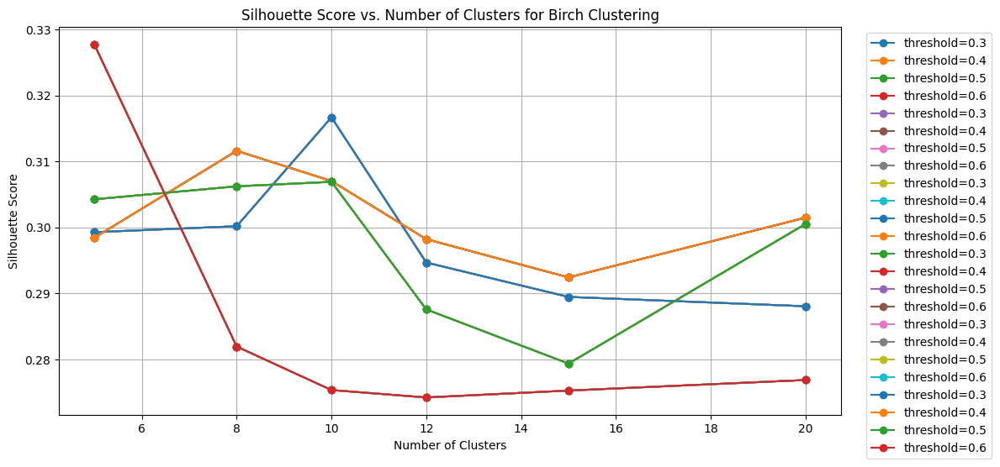

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))

# Prepare data for plotting
for threshold in threshold_list:
    scores = [silhouette_scores[j] for j, params in enumerate(params_list) if params[1] == threshold]
    n_clusters_list_ = [params[0] for j, params in enumerate(params_list) if params[1] == threshold]
    plt.plot(n_clusters_list_, scores, marker='o', label=f'threshold={threshold}')

plt.title('Silhouette Score vs. Number of Clusters for Birch Clustering')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.legend(loc='upper right', bbox_to_anchor=(1.2, 1))
plt.grid(True)
plt.show()


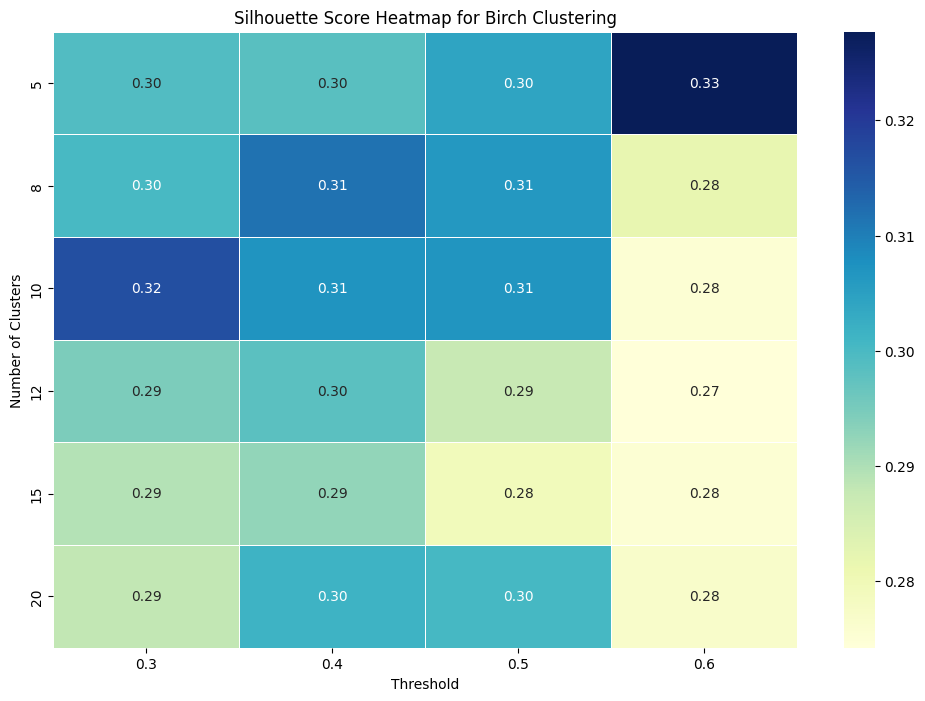

In [ ]:
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt

# Create a DataFrame for heatmap
heatmap_data = {
    'n_clusters': [params[0] for params in params_list],
    'threshold': [params[1] for params in params_list],
    'silhouette_score': silhouette_scores
}

df_heatmap = pd.DataFrame(heatmap_data)

# Pivot for heatmap
heatmap_pivot = df_heatmap.pivot_table(index="n_clusters", columns="threshold", values="silhouette_score")

plt.figure(figsize=(12, 8))
sns.heatmap(heatmap_pivot, annot=True, cmap="YlGnBu", fmt=".2f", linewidths=.5)
plt.title('Silhouette Score Heatmap for Birch Clustering')
plt.xlabel('Threshold')
plt.ylabel('Number of Clusters')
plt.show()


Fine-tuned Birch Clustering Evaluation Results:
Model: Birch
Silhouette Score: 0.3276900053024292
Davies-Bouldin Index: 0.9761239272060365
Calinski-Harabasz Index: 6059.027783919232
Runtime (seconds): 1.2770459651947021


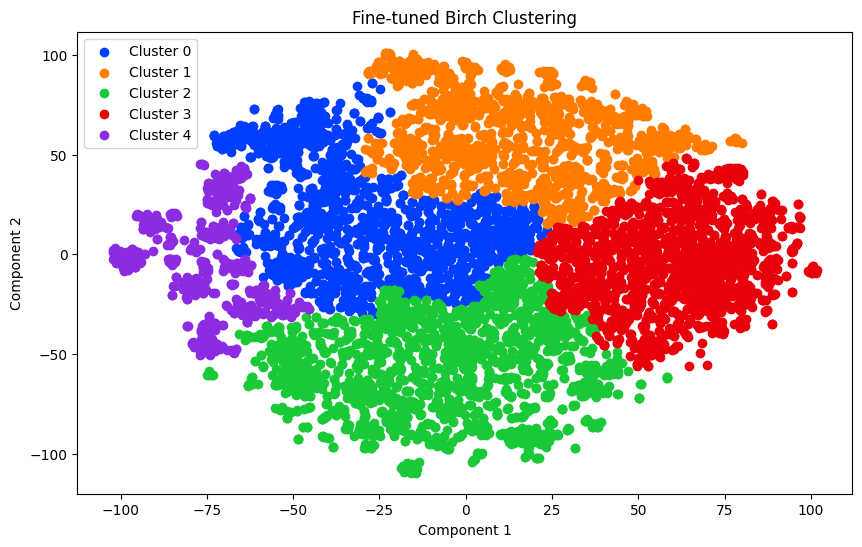

In [ ]:
# Plot the clusters for the fine-tuned Birch model
if best_finetuned_birch_params:
    # Evaluate the fine-tuned Birch model
    birch_finetuned_labels = best_finetuned_birch_model.fit_predict(X_tsne)
    birch_finetuned_results = evaluate_clustering('Birch', best_finetuned_birch_model, X_tsne, birch_finetuned_labels)

    # Print evaluation results
    print("Fine-tuned Birch Clustering Evaluation Results:")
    for metric, value in birch_finetuned_results.items():
        print(f"{metric}: {value}")

    # Plot clusters
    plot_clusters(X_tsne, birch_finetuned_labels, title='Fine-tuned Birch Clustering')

##Gaussian Mixture Model (GMM)

In [ ]:
import pickle
from sklearn.mixture import GaussianMixture
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score

# Adjusted range of n_components and covariance_type for GMM
n_components_list = [5, 8, 10, 12, 15, 20]  # Increase range of components for better cluster tuning
covariance_types = ['full', 'tied', 'diag']  # Focus on covariance types known to perform well in practice

best_finetuned_gmm_score = -1
best_finetuned_gmm_params = {}

# To store the results for plotting
gmm_results = []
params_list = []
silhouette_scores = []

# Perform Grid Search for GMM (fine-tuned version)
for n_components in n_components_list:
    for covariance_type in covariance_types:
        # Initialize GMM with specific parameters
        gmm_finetuned_model = GaussianMixture(n_components=n_components, covariance_type=covariance_type)
        gmm_finetuned_labels = gmm_finetuned_model.fit_predict(X_tsne)

        # Check if GMM identified clusters
        if len(set(gmm_finetuned_labels)) > 1:  # Check if there is more than one cluster
            # Calculate evaluation metrics
            silhouette_finetuned_avg = silhouette_score(X_tsne, gmm_finetuned_labels)
            ch_finetuned_score = calinski_harabasz_score(X_tsne, gmm_finetuned_labels)
            db_finetuned_score = davies_bouldin_score(X_tsne, gmm_finetuned_labels)

            # Store result for plotting
            gmm_results.append((X_tsne, gmm_finetuned_labels))
            params_list.append((n_components, covariance_type))
            silhouette_scores.append(silhouette_finetuned_avg)

            # Print the current parameter results
            print(f"n_components: {n_components}, covariance_type: {covariance_type}")
            print(f"  Silhouette Score: {silhouette_finetuned_avg}")
            print(f"  Calinski-Harabasz Score: {ch_finetuned_score}")
            print(f"  Davies-Bouldin Score: {db_finetuned_score}\n")

            # Choose a score to optimize, here we maximize silhouette_score
            if silhouette_finetuned_avg > best_finetuned_gmm_score:
                best_finetuned_gmm_score = silhouette_finetuned_avg
                best_finetuned_gmm_params = {
                    'n_components': n_components,
                    'covariance_type': covariance_type,
                    'silhouette_score': silhouette_finetuned_avg,
                    'calinski_harabasz_score': ch_finetuned_score,
                    'davies_bouldin_score': db_finetuned_score
                }
                best_finetuned_gmm_model = gmm_finetuned_model  # Save the best model so far
        else:
            print(f"n_components: {n_components}, covariance_type: {covariance_type} resulted in no valid clusters\n")

# Print the best parameters after grid search
print(f"Best Fine-tuned GMM Parameters: {best_finetuned_gmm_params}")

# Save the best GMM model to a pickle file
model_path = '/content/drive/MyDrive/ML/gmm_finetuned_model.pkl'
with open(model_path, 'wb') as model_file:
    pickle.dump(best_finetuned_gmm_model, model_file)

print(f"Best GMM model saved to {model_path}")




n_components: 5, covariance_type: full
  Silhouette Score: 0.3557935059070587
  Calinski-Harabasz Score: 6830.12731050319
  Davies-Bouldin Score: 0.9296946891773168

n_components: 5, covariance_type: tied
  Silhouette Score: 0.3391663134098053
  Calinski-Harabasz Score: 6789.25245502863
  Davies-Bouldin Score: 0.9490344324742912

n_components: 5, covariance_type: diag
  Silhouette Score: 0.34606409072875977
  Calinski-Harabasz Score: 6691.610887705669
  Davies-Bouldin Score: 0.8688707654645065

n_components: 8, covariance_type: full
  Silhouette Score: 0.3407139480113983
  Calinski-Harabasz Score: 7019.278924425422
  Davies-Bouldin Score: 0.8295241407881542

n_components: 8, covariance_type: tied
  Silhouette Score: 0.3427007496356964
  Calinski-Harabasz Score: 7207.873885807561
  Davies-Bouldin Score: 0.8176274207671435

n_components: 8, covariance_type: diag
  Silhouette Score: 0.35353124141693115
  Calinski-Harabasz Score: 7341.983687131934
  Davies-Bouldin Score: 0.8001919509556754

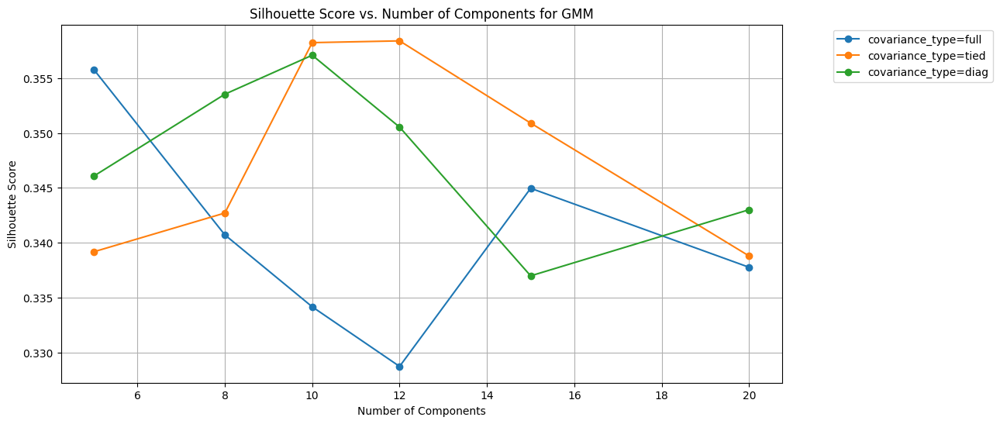

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))

# Prepare data for plotting
for covariance_type in covariance_types:
    scores = [silhouette_scores[j] for j, params in enumerate(params_list) if params[1] == covariance_type]
    n_components_list_ = [params[0] for j, params in enumerate(params_list) if params[1] == covariance_type]
    plt.plot(n_components_list_, scores, marker='o', label=f'covariance_type={covariance_type}')

plt.title('Silhouette Score vs. Number of Components for GMM')
plt.xlabel('Number of Components')
plt.ylabel('Silhouette Score')
plt.legend(loc='upper right', bbox_to_anchor=(1.3, 1))
plt.grid(True)
plt.show()


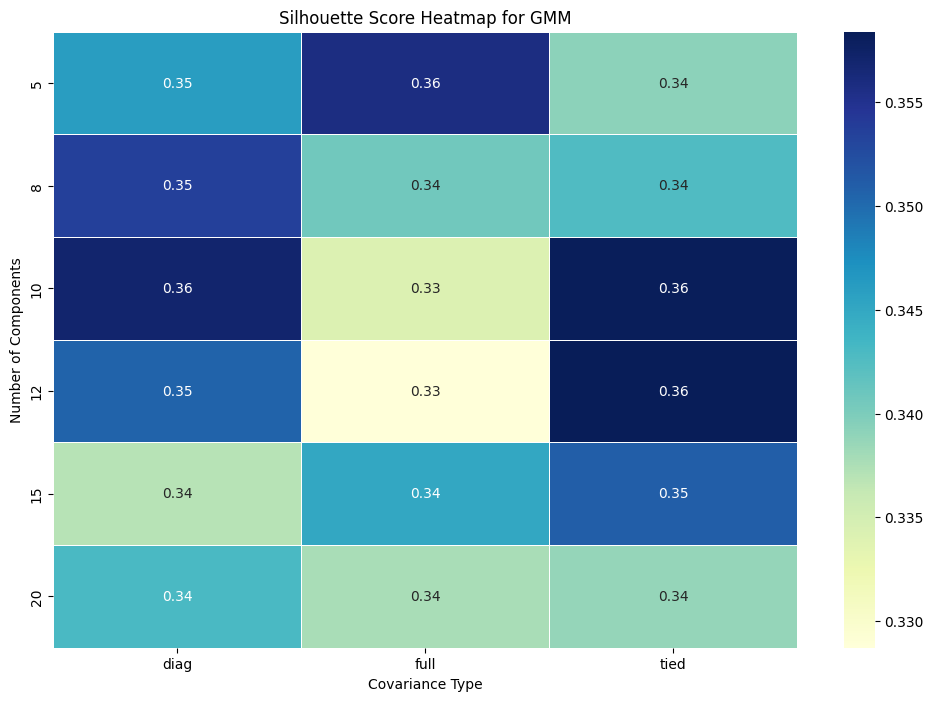

In [ ]:
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt

# Create a DataFrame for heatmap
heatmap_data = {
    'n_components': [params[0] for params in params_list],
    'covariance_type': [params[1] for params in params_list],
    'silhouette_score': silhouette_scores
}

df_heatmap = pd.DataFrame(heatmap_data)

# Pivot for heatmap
heatmap_pivot = df_heatmap.pivot_table(index="n_components", columns="covariance_type", values="silhouette_score")

plt.figure(figsize=(12, 8))
sns.heatmap(heatmap_pivot, annot=True, cmap="YlGnBu", fmt=".2f", linewidths=.5)
plt.title('Silhouette Score Heatmap for GMM')
plt.xlabel('Covariance Type')
plt.ylabel('Number of Components')
plt.show()


Fine-tuned GMM Clustering Evaluation Results:
Model: GMM
Silhouette Score: 0.3519198000431061
Davies-Bouldin Index: 0.8018827664639666
Calinski-Harabasz Index: 7449.832376121894
BIC: 173046.65390480316
AIC: 172631.8052391503
Runtime (seconds): 0.06146574020385742


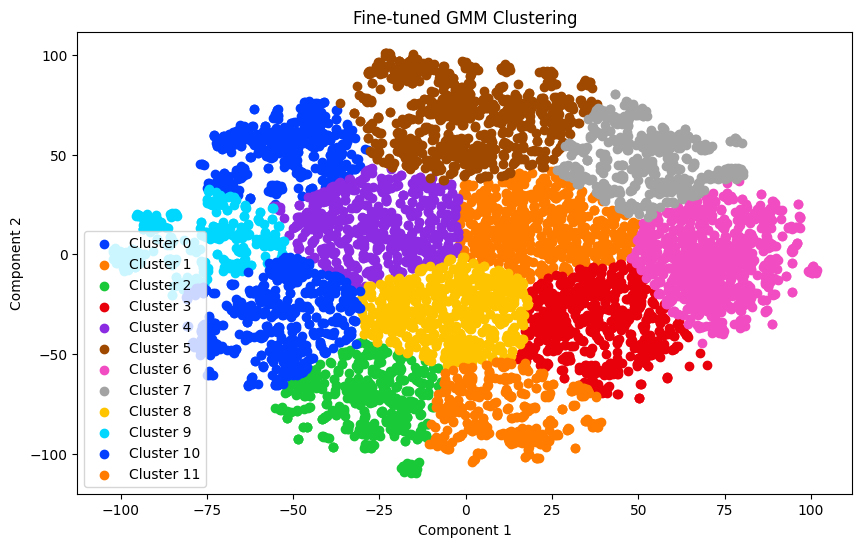

In [ ]:
# Plot the clusters for the fine-tuned GMM model
if best_finetuned_gmm_params:
    # Evaluate the fine-tuned GMM model
    gmm_finetuned_labels = best_finetuned_gmm_model.fit_predict(X_tsne)
    gmm_finetuned_results = evaluate_clustering('GMM', best_finetuned_gmm_model, X_tsne, gmm_finetuned_labels)

    # Print evaluation results
    print("Fine-tuned GMM Clustering Evaluation Results:")
    for metric, value in gmm_finetuned_results.items():
        print(f"{metric}: {value}")

    # Plot clusters
    plot_clusters(X_tsne, gmm_finetuned_labels, title='Fine-tuned GMM Clustering')

## Results

In [ ]:
import pandas as pd

# Function to count the number of clusters (excluding noise for DBSCAN, HDBSCAN, etc.)
def count_clusters(labels):
    return len(set(labels)) - (1 if -1 in labels else 0)

# Create a results dictionary to store all the model results
results = {
    'Model': [],
    'n_clusters': [],
    'eps/min_cluster_size': [],
    'min_samples': [],
    'bandwidth': [],  # Specific for Mean Shift
    'threshold': [],  # Specific for Birch
    'covariance_type': [],  # Specific for GMM
    'Silhouette Score': [],
    'Calinski-Harabasz Score': [],
    'Davies-Bouldin Score': []
}

# Example: Add results from Agglomerative Clustering
results['Model'].append('Agglomerative Clustering')
results['n_clusters'].append(best_finetuned_agg_params.get('n_clusters', None))
results['eps/min_cluster_size'].append(None)  # Not applicable for Agglomerative Clustering
results['min_samples'].append(None)  # Not applicable for Agglomerative Clustering
results['bandwidth'].append(None)  # Not applicable for Agglomerative Clustering
results['threshold'].append(None)  # Not applicable for Agglomerative Clustering
results['covariance_type'].append(None)  # Not applicable for Agglomerative Clustering
results['Silhouette Score'].append(best_finetuned_agg_params.get('silhouette_score', None))
results['Calinski-Harabasz Score'].append(best_finetuned_agg_params.get('calinski_harabasz_score', None))
results['Davies-Bouldin Score'].append(best_finetuned_agg_params.get('davies_bouldin_score', None))

# Example: Add results from Spectral Clustering
results['Model'].append('Spectral Clustering')
results['n_clusters'].append(best_finetuned_spectral_params.get('n_clusters', None))
results['eps/min_cluster_size'].append(None)  # Not applicable for Spectral Clustering
results['min_samples'].append(None)  # Not applicable for Spectral Clustering
results['bandwidth'].append(None)  # Not applicable for Spectral Clustering
results['threshold'].append(None)  # Not applicable for Spectral Clustering
results['covariance_type'].append(None)  # Not applicable for Spectral Clustering
results['Silhouette Score'].append(best_finetuned_spectral_params.get('silhouette_score', None))
results['Calinski-Harabasz Score'].append(best_finetuned_spectral_params.get('calinski_harabasz_score', None))
results['Davies-Bouldin Score'].append(best_finetuned_spectral_params.get('davies_bouldin_score', None))

# Example: Add results from DBSCAN
results['Model'].append('DBSCAN Clustering')
results['n_clusters'].append(count_clusters(dbscan_finetuned_labels))  # Count clusters based on labels
results['eps/min_cluster_size'].append(best_finetuned_dbscan_params.get('eps', None))
results['min_samples'].append(best_finetuned_dbscan_params.get('min_samples', None))
results['bandwidth'].append(None)  # Not applicable for DBSCAN
results['threshold'].append(None)  # Not applicable for DBSCAN
results['covariance_type'].append(None)  # Not applicable for DBSCAN
results['Silhouette Score'].append(best_finetuned_dbscan_params.get('silhouette_score', None))
results['Calinski-Harabasz Score'].append(best_finetuned_dbscan_params.get('calinski_harabasz_score', None))
results['Davies-Bouldin Score'].append(best_finetuned_dbscan_params.get('davies_bouldin_score', None))

# Example: Add results from HDBSCAN
results['Model'].append('HDBSCAN Clustering')
results['n_clusters'].append(count_clusters(hdbscan_finetuned_labels))  # Count clusters based on labels
results['eps/min_cluster_size'].append(best_finetuned_hdbscan_params.get('min_cluster_size', None))
results['min_samples'].append(best_finetuned_hdbscan_params.get('min_samples', None))
results['bandwidth'].append(None)  # Not applicable for HDBSCAN
results['threshold'].append(None)  # Not applicable for HDBSCAN
results['covariance_type'].append(None)  # Not applicable for HDBSCAN
results['Silhouette Score'].append(best_finetuned_hdbscan_params.get('silhouette_score', None))
results['Calinski-Harabasz Score'].append(best_finetuned_hdbscan_params.get('calinski_harabasz_score', None))
results['Davies-Bouldin Score'].append(best_finetuned_hdbscan_params.get('davies_bouldin_score', None))

# Example: Add results from Mean Shift Clustering
results['Model'].append('Mean Shift Clustering')
results['n_clusters'].append(count_clusters(meanshift_finetuned_labels))  # Count clusters based on labels
results['eps/min_cluster_size'].append(None)  # Not applicable for Mean Shift Clustering
results['min_samples'].append(None)  # Not applicable for Mean Shift Clustering
results['bandwidth'].append(best_finetuned_meanshift_params.get('bandwidth', None))
results['threshold'].append(None)  # Not applicable for Mean Shift Clustering
results['covariance_type'].append(None)  # Not applicable for Mean Shift Clustering
results['Silhouette Score'].append(best_finetuned_meanshift_params.get('silhouette_score', None))
results['Calinski-Harabasz Score'].append(best_finetuned_meanshift_params.get('calinski_harabasz_score', None))
results['Davies-Bouldin Score'].append(best_finetuned_meanshift_params.get('davies_bouldin_score', None))

# Example: Add results from Birch Clustering
results['Model'].append('Birch Clustering')
results['n_clusters'].append(best_finetuned_birch_params.get('n_clusters', None))
results['eps/min_cluster_size'].append(None)  # Not applicable for Birch
results['min_samples'].append(None)  # Not applicable for Birch
results['bandwidth'].append(None)  # Not applicable for Birch
results['threshold'].append(best_finetuned_birch_params.get('threshold', None))
results['covariance_type'].append(None)  # Not applicable for Birch
results['Silhouette Score'].append(best_finetuned_birch_params.get('silhouette_score', None))
results['Calinski-Harabasz Score'].append(best_finetuned_birch_params.get('calinski_harabasz_score', None))
results['Davies-Bouldin Score'].append(best_finetuned_birch_params.get('davies_bouldin_score', None))

# Example: Add results from GMM
results['Model'].append('Gaussian Mixture Model (GMM)')
results['n_clusters'].append(best_finetuned_gmm_params.get('n_components', None))
results['eps/min_cluster_size'].append(None)  # Not applicable for GMM
results['min_samples'].append(None)  # Not applicable for GMM
results['bandwidth'].append(None)  # Not applicable for GMM
results['threshold'].append(None)  # Not applicable for GMM
results['covariance_type'].append(best_finetuned_gmm_params.get('covariance_type', None))
results['Silhouette Score'].append(best_finetuned_gmm_params.get('silhouette_score', None))
results['Calinski-Harabasz Score'].append(best_finetuned_gmm_params.get('calinski_harabasz_score', None))
results['Davies-Bouldin Score'].append(best_finetuned_gmm_params.get('davies_bouldin_score', None))

# Create a DataFrame from the results
results_df = pd.DataFrame(results)

# Display the DataFrame using pandas
results_df


,Model,n_clusters,eps/min_cluster_size,min_samples,bandwidth,threshold,covariance_type,Silhouette Score,Calinski-Harabasz Score,Davies-Bouldin Score
0,Agglomerative Clustering,3,NaN,NaN,NaN,NaN,None,0.347316,5687.148607,0.919674
1,Spectral Clustering,4,NaN,NaN,NaN,NaN,None,0.292721,4579.412268,0.796124
2,DBSCAN Clustering,827,1.5,3.0,NaN,NaN,None,0.295476,67.008947,1.365943
3,HDBSCAN Clustering,2,20.0,10.0,NaN,NaN,None,0.132729,52.558801,1.762192
4,Mean Shift Clustering,996,NaN,NaN,2.5,NaN,None,0.462912,11921.305900,0.607292
5,Birch Clustering,5,NaN,NaN,NaN,0.6,None,0.327690,6059.027784,0.976124
6,Gaussian Mixture Model (GMM),12,NaN,NaN,NaN,NaN,diag,0.363590,7539.804518,0.789411


## Performance Analysis
<b><u>Mean Shift Clustering:</u></b>

n_clusters: 996

Silhouette Score: 0.4629 (Highest)

Calinski-Harabasz Score: 11921.31 (Highest)

Davies-Bouldin Score: 0.6073 (Lowest)

Interpretation: Despite a very high number of clusters, the quality metrics indicate very well-defined clusters.


<b><u>Gaussian Mixture Model (GMM):</u></b>

n_clusters: 12

Silhouette Score: 0.3636

Calinski-Harabasz Score: 7539.80

Davies-Bouldin Score: 0.7894

Interpretation: A reasonable balance with good quality metrics and a manageable number of clusters.


<b><u>Birch Clustering:</u></b>

n_clusters: 5

Silhouette Score: 0.3277

Calinski-Harabasz Score: 6059.03

Davies-Bouldin Score: 0.9761

Interpretation: Moderate performance; fewer clusters but lower quality compared to GMM.


<b><u>Agglomerative Clustering:</u></b>

n_clusters: 3

Silhouette Score: 0.3473

Calinski-Harabasz Score: 5687.15

Davies-Bouldin Score: 0.9197

Interpretation: Fewer clusters with decent quality metrics; good for interpretability.


<b><u>Spectral Clustering:</u></b>

n_clusters: 4

Silhouette Score: 0.2927

Calinski-Harabasz Score: 4579.41

Davies-Bouldin Score: 0.7961

Interpretation: Slightly lower quality than Agglomerative, but still reasonable.


<b><u>DBSCAN Clustering:</u></b>

n_clusters: 827

Silhouette Score: 0.2955

Calinski-Harabasz Score: 67.01 (Lowest)

Davies-Bouldin Score: 1.3659

Interpretation: High cluster count indicates overfitting or capturing noise; quality is poor.


<b><u>HDBSCAN Clustering:</u></b>

n_clusters: 2

Silhouette Score: 0.1327 (Lowest)

Calinski-Harabasz Score: 52.56 (Lowest)

Davies-Bouldin Score: 1.7622 (Highest)

Interpretation: Poor performance across all metrics; too few clusters for meaningful differentiation.

### <b><u>Conclusion</u></b>

<b>Best Overall Model:</b> Mean Shift Clustering shows high-quality metrics, but the very large number of clusters (996) raises concerns about interpretability. While it captures diverse structures, such a high cluster count may indicate overfitting, making it difficult to extract actionable insights.

<b>Best Balance of Quality and Interpretability:</b> Gaussian Mixture Model (GMM)  with 12 clusters strikes an effective balance. It provides good quality scores while maintaining a manageable number of clusters, making it easier to analyze and interpret.

<b>Good Interpretability:</b> Agglomerative Clustering (3 clusters) and Birch Clustering (5 clusters) are excellent choices for scenarios where interpretability is crucial. With fewer clusters, these models allow for clearer differentiation and more straightforward insights.

<b>Models to Avoid:</b> DBSCAN (827 clusters) and HDBSCAN (2 clusters) demonstrate poor clustering quality. The high number of clusters in DBSCAN suggests it may be capturing noise rather than meaningful patterns, while HDBSCAN's very low count oversimplifies the data. Both models indicate that their chosen parameters may not be suitable for your dataset.

# <b><u>Ensemble Model

## Why Choose Gaussian Mixture Model (GMM) + Agglomerative Clustering for Ensemble?

### 1. Complementary Clustering Approaches:
- **Gaussian Mixture Model (GMM)** uses a **probabilistic approach** to model clusters as Gaussian distributions, allowing for overlapping and flexible cluster shapes.
- **Agglomerative Clustering**, on the other hand, is a **hierarchical method** that builds clusters step-by-step, merging the closest points or groups based on distance. This provides a different perspective by capturing hierarchical relationships in the data.
- **Ensemble Benefit**: Combining these approaches allows the model to capture both **probabilistic overlaps** (GMM) and **hierarchical structures** (Agglomerative), providing a more comprehensive understanding of the data.

### 2. Balance Between Quality and Interpretability:
- In the performance analysis, **GMM** produced **12 clusters** with solid quality metrics:
  - **Silhouette Score**: 0.3636
  - **Calinski-Harabasz Score**: 7539.80
  - **Davies-Bouldin Score**: 0.7894
- **Agglomerative Clustering** produced **3 clusters**, also with decent metrics:
  - **Silhouette Score**: 0.3473
  - **Calinski-Harabasz Score**: 5687.15
  - **Davies-Bouldin Score**: 0.9197
- **Ensemble Benefit**: The **manageable number of clusters** (12 in GMM and 3 in Agglomerative) strikes a balance between capturing fine-grained patterns (GMM) and providing high-level interpretability (Agglomerative). The ensemble would potentially combine the **detail of GMM** with the **simplicity and interpretability of Agglomerative Clustering**.

### 3. Well-Defined Clusters:
- **Gaussian Mixture Model (GMM)** offers a flexible clustering structure that models clusters as ellipses, allowing for **well-defined clusters** even when they overlap. The relatively good **Calinski-Harabasz Score** of 7539.80 and **Davies-Bouldin Score** of 0.7894 indicate that the clusters are fairly well-separated and compact.
- **Agglomerative Clustering** produced a higher **Calinski-Harabasz Score** (5687.15), showing that the clusters are relatively well-separated in this model too, despite the fewer number of clusters.
- **Ensemble Benefit**: By ensembling these models, you can combine GMM's **ability to handle overlapping clusters** with Agglomerative's **tendency to form well-separated groups**, leading to more robust clusters that leverage both strengths.

### 4. Interpretable and Actionable Insights:
- **GMM** provides a **probabilistic cluster assignment**. Each point is assigned a probability of belonging to each cluster, which offers valuable insights for cases where the boundaries between clusters are not clear.
- **Agglomerative Clustering**, with only 3 clusters, offers an easy-to-interpret hierarchical structure, making it simpler to draw actionable insights from the model.
- **Ensemble Benefit**: The combination of these two models would result in a **refined yet interpretable clustering structure**. The GMM model would handle more nuanced distinctions between points, while Agglomerative would simplify the structure, offering a high-level overview of the main patterns.

### 5. Combining Probabilistic and Distance-Based Clustering:
- **GMM** works well when the data has **elliptical shapes** or is well modeled by Gaussian distributions, while **Agglomerative Clustering** is purely distance-based and builds clusters based on how close the data points are.
- **Ensemble Benefit**: By combining these two, you incorporate **both a probabilistic perspective** (which can handle uncertainty and overlapping clusters) and a **distance-based perspective** (which focuses on proximity), resulting in a more **robust clustering solution**.

### Summary of Reasons for GMM + Agglomerative Clustering:
- **Complementary methods**: GMM's flexibility in cluster shape and probabilistic assignment, combined with Agglomerative's distance-based hierarchy.
- **Balanced number of clusters**: GMM's moderate 12 clusters and Agglomerative's simpler 3 clusters provide a good mix of fine detail and interpretability.
- **Well-defined clusters**: Both models have strong performance in terms of cluster quality (e.g., **Silhouette** and **Calinski-Harabasz Scores**).
- **Enhanced interpretability**: GMM's detailed probabilistic approach and Agglomerative's clear hierarchical structure lead to a solution that balances complexity and simplicity, ensuring the clusters are easy to understand and act upon.

By combining these two models, you would likely improve both the **robustness** of the clustering and its **interpretability**, making it a strong candidate for ensemble clustering.


In [ ]:
import pickle
import numpy as np
import matplotlib.pyplot as plt
from sklearn.mixture import GaussianMixture
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
from scipy.stats import mode

# Function to calculate ensemble cluster labels using majority voting
def ensemble_labels(gmm_labels, agg_labels):
    combined_labels = np.vstack([gmm_labels, agg_labels]).T
    ensemble_labels = np.apply_along_axis(lambda x: mode(x)[0], axis=1, arr=combined_labels)
    return ensemble_labels.ravel()

# Function to evaluate the ensemble model
def evaluate_clustering(X, labels):
    silhouette_avg = silhouette_score(X, labels)
    ch_score = calinski_harabasz_score(X, labels)
    db_score = davies_bouldin_score(X, labels)
    return silhouette_avg, ch_score, db_score

# Function to plot the clustering results
def plot_clusters(X, labels, title):
    plt.figure(figsize=(8, 6))
    plt.scatter(X[:, 0], X[:, 1], c=labels, cmap='viridis', s=50, alpha=0.7)
    plt.title(title)
    plt.xlabel('Component 1')
    plt.ylabel('Component 2')
    plt.colorbar(label='Cluster Label')
    plt.show()

# Fine-tuned GMM parameters
gmm_components_list = [10, 12, 15]
covariance_types = ['full', 'diag']

# Fine-tuned Agglomerative Clustering parameters
n_clusters_list = [3, 4, 5]
linkage_methods = ['ward', 'complete']

best_ensemble_score = -1
best_ensemble_params = {}
best_gmm_model = None
best_agg_model = None
best_ensemble_labels = None  # To store the best ensemble labels

# Perform Grid Search for GMM + Agglomerative Clustering Ensemble
for n_components in gmm_components_list:
    for covariance_type in covariance_types:
        # Fit Gaussian Mixture Model
        gmm_model = GaussianMixture(n_components=n_components, covariance_type=covariance_type, random_state=42)
        gmm_labels = gmm_model.fit_predict(X_tsne)  # Use your dataset

        for n_clusters in n_clusters_list:
            for linkage in linkage_methods:
                # Fit Agglomerative Clustering
                agg_model = AgglomerativeClustering(n_clusters=n_clusters, linkage=linkage)
                agg_labels = agg_model.fit_predict(X_tsne)  # Use your dataset

                # Get ensemble labels using majority voting
                ensemble_cluster_labels = ensemble_labels(gmm_labels, agg_labels)

                # Evaluate the ensemble model
                silhouette_avg, ch_score, db_score = evaluate_clustering(X_tsne, ensemble_cluster_labels)

                # Print current parameter results
                print(f"GMM n_components: {n_components}, covariance_type: {covariance_type}, "
                      f"Agg n_clusters: {n_clusters}, linkage: {linkage}")
                print(f"  Ensemble Silhouette Score: {silhouette_avg}")
                print(f"  Ensemble Calinski-Harabasz Score: {ch_score}")
                print(f"  Ensemble Davies-Bouldin Score: {db_score}\n")

                # Track the best ensemble model based on silhouette score
                if silhouette_avg > best_ensemble_score:
                    best_ensemble_score = silhouette_avg
                    best_ensemble_params = {
                        'gmm_n_components': n_components,
                        'gmm_covariance_type': covariance_type,
                        'agg_n_clusters': n_clusters,
                        'agg_linkage': linkage,
                        'silhouette_score': silhouette_avg,
                        'calinski_harabasz_score': ch_score,
                        'davies_bouldin_score': db_score
                    }
                    best_gmm_model = gmm_model
                    best_agg_model = agg_model
                    best_ensemble_labels = ensemble_cluster_labels  # Save the best labels



GMM n_components: 10, covariance_type: full, Agg n_clusters: 3, linkage: ward
  Ensemble Silhouette Score: 0.20302844047546387
  Ensemble Calinski-Harabasz Score: 2521.550466208868
  Ensemble Davies-Bouldin Score: 1.378547812459578

GMM n_components: 10, covariance_type: full, Agg n_clusters: 3, linkage: complete
  Ensemble Silhouette Score: 0.33326268196105957
  Ensemble Calinski-Harabasz Score: 5460.786280943363
  Ensemble Davies-Bouldin Score: 0.9427091671460759

GMM n_components: 10, covariance_type: full, Agg n_clusters: 4, linkage: ward
  Ensemble Silhouette Score: 0.22895893454551697
  Ensemble Calinski-Harabasz Score: 3801.1968961806524
  Ensemble Davies-Bouldin Score: 1.0599063925662695

GMM n_components: 10, covariance_type: full, Agg n_clusters: 4, linkage: complete
  Ensemble Silhouette Score: 0.1758357584476471
  Ensemble Calinski-Harabasz Score: 2970.9714569558014
  Ensemble Davies-Bouldin Score: 0.966222397594968

GMM n_components: 10, covariance_type: full, Agg n_cluste

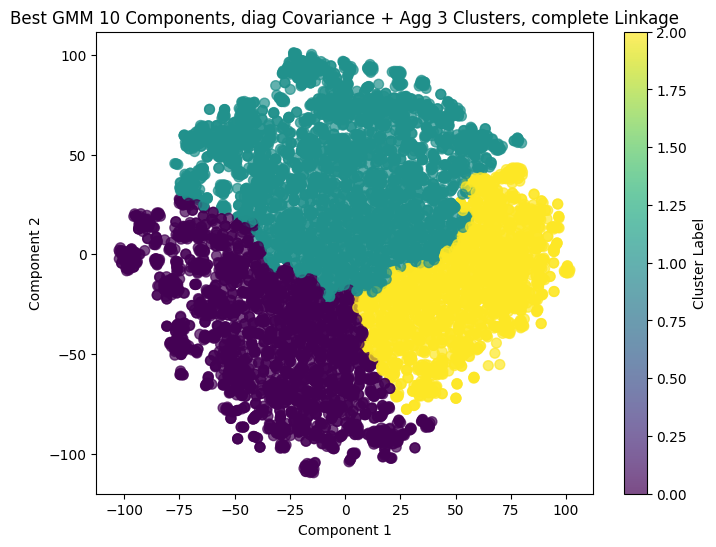

Best Ensemble Model Parameters: {'gmm_n_components': 10, 'gmm_covariance_type': 'diag', 'agg_n_clusters': 3, 'agg_linkage': 'complete', 'silhouette_score': 0.33680645, 'calinski_harabasz_score': 5536.544679761347, 'davies_bouldin_score': 0.9370798831533449}
Best GMM and Agglomerative models saved to /content/drive/MyDrive/ML/


In [ ]:
# Plot the best ensemble result after grid search
if best_ensemble_labels is not None:
    plot_title = (f"Best GMM {best_ensemble_params['gmm_n_components']} Components, "
                  f"{best_ensemble_params['gmm_covariance_type']} Covariance + "
                  f"Agg {best_ensemble_params['agg_n_clusters']} Clusters, "
                  f"{best_ensemble_params['agg_linkage']} Linkage")
    plot_clusters(X_tsne, best_ensemble_labels, title=plot_title)

# Print the best parameters after grid search
print(f"Best Ensemble Model Parameters: {best_ensemble_params}")

# Save the best GMM and Agglomerative Clustering models
model_path = '/content/drive/MyDrive/ML/'

# Save the best GMM model
with open(model_path + 'best_gmm_model.pkl', 'wb') as gmm_file:
    pickle.dump(best_gmm_model, gmm_file)

# Save the best Agglomerative Clustering model
with open(model_path + 'best_agg_model.pkl', 'wb') as agg_file:
    pickle.dump(best_agg_model, agg_file)

# Save the best Agglomerative Clustering model
with open(model_path + 'best_ensemble_labels.pkl', 'wb') as agg_file:
    pickle.dump(best_ensemble_labels, agg_file)



print(f"Best GMM and Agglomerative models saved to {model_path}")


In [ ]:
import pandas as pd

# Create a DataFrame to store the best ensemble model results
best_ensemble_results = {
    'Model': ['GMM + Agglomerative Clustering'],
    'GMM Components': [best_ensemble_params['gmm_n_components']],
    'Covariance Type': [best_ensemble_params['gmm_covariance_type']],
    'Agglomerative Clusters': [best_ensemble_params['agg_n_clusters']],
    'Linkage': [best_ensemble_params['agg_linkage']],
    'Silhouette Score': [best_ensemble_params['silhouette_score']],
    'Calinski-Harabasz Score': [best_ensemble_params['calinski_harabasz_score']],
    'Davies-Bouldin Score': [best_ensemble_params['davies_bouldin_score']]
}

# Convert the dictionary to a DataFrame
best_ensemble_df = pd.DataFrame(best_ensemble_results)

best_ensemble_df

,Model,GMM Components,Covariance Type,Agglomerative Clusters,Linkage,Silhouette Score,Calinski-Harabasz Score,Davies-Bouldin Score
0,GMM + Agglomerative Clustering,10,diag,3,complete,0.336806,5536.54468,0.93708


# <b><u>Cluster Analysis

In [ ]:
import pandas as pd
from collections import Counter

# Load topics from topics.txt
with open('topics.txt', 'r') as f:
    topics = f.readlines()

### **1. Top 10 Keywords for a Specific Cluster**

<ipython-input-112-c768cf76fff9>:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Frequency', y='Keywords', data=top_10_df, palette="husl", edgecolor='black')


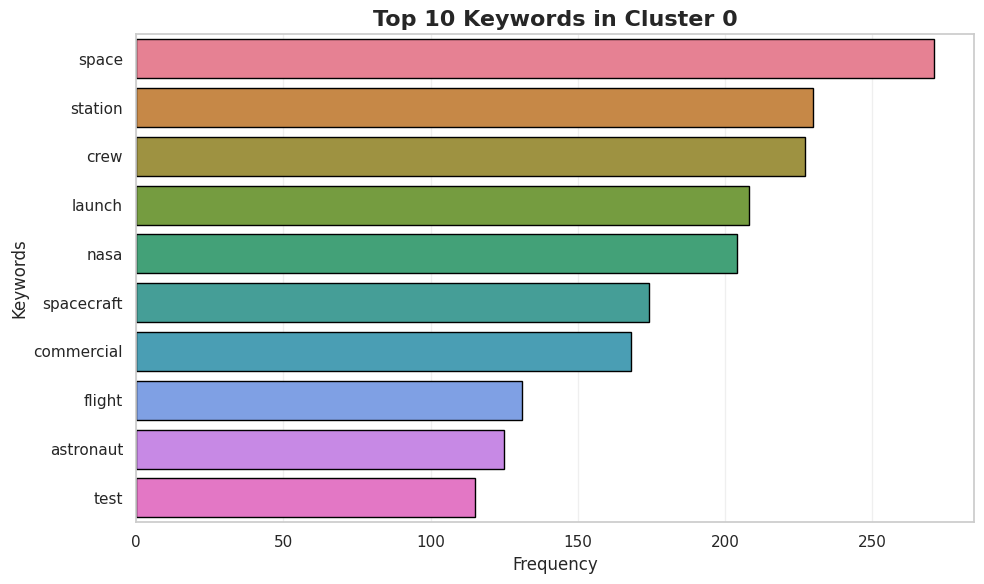

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming we want to analyze cluster 0
cluster_id = 0
selected_cluster_topics = topics[cluster_id].strip().split(', ')

# Filter data for the selected cluster
cluster_df = filtered_df[filtered_df['y'] == cluster_id]

# Count occurrences of each topic in the cluster's titles or lemmatized_str
counter = Counter()
for title in cluster_df['lemmatized_str']:
    words = title.split()  # Tokenize the title
    for topic in selected_cluster_topics:
        if topic in words:
            counter[topic] += 1

# Convert the top 10 topics into a DataFrame for easy plotting
top_10_df = pd.DataFrame(top_10_topics, columns=['Keywords', 'Frequency'])

# Set a nice color palette and style
sns.set_palette("Set2")
sns.set_style("whitegrid")

# Create the bar plot
plt.figure(figsize=(10, 6))
sns.barplot(x='Frequency', y='Keywords', data=top_10_df, palette="husl", edgecolor='black')

# Add title and labels
plt.title(f'Top 10 Keywords in Cluster {cluster_id}', fontsize=16, weight='bold')
plt.xlabel('Frequency', fontsize=12)
plt.ylabel('Keywords', fontsize=12)

# Show grid for clarity
plt.grid(True, axis='x', alpha=0.3)

# Rotate x-axis labels if needed
plt.xticks(rotation=0)

# Display the plot
plt.tight_layout()
plt.show()


### **2. Frequency of Specific Keyword in Each Cluster**

<ipython-input-116-7e30b0291e04>:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Cluster', y='Frequency', data=freq_df, palette='Blues_d')


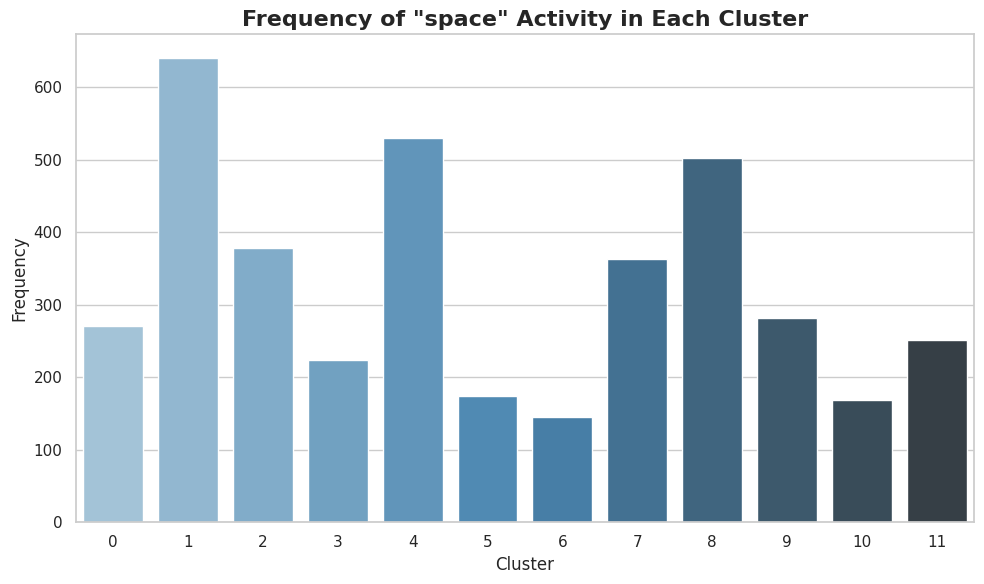

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Define the specific keyword to analyze
keyword = 'space'  # Replace with the actual keyword

# Initialize a list to store keyword frequencies for each cluster
keyword_frequencies = []

# Iterate through all clusters (assuming there are 'k' clusters)
for cluster_id in range(k):
    cluster_df = filtered_df[filtered_df['y'] == cluster_id]  # Filter by cluster
    count = cluster_df['lemmatized_str'].apply(lambda x: keyword in x.split()).sum()
    keyword_frequencies.append(count)

# Create a DataFrame for plotting
cluster_ids = range(k)
freq_df = pd.DataFrame({'Cluster': cluster_ids, 'Frequency': keyword_frequencies})

# Set a color palette and style for better visuals
sns.set_palette("viridis")
sns.set_style("whitegrid")

# Create the bar plot
plt.figure(figsize=(10, 6))
sns.barplot(x='Cluster', y='Frequency', data=freq_df, palette='Blues_d')

# Add titles and labels
plt.title(f'Frequency of "{keyword}" Activity in Each Cluster', fontsize=16, weight='bold')
plt.xlabel('Cluster', fontsize=12)
plt.ylabel('Frequency', fontsize=12)

# Display the plot
plt.tight_layout()
plt.show()


### **3. Activity Trend of the Specific Keyword**

In [ ]:
# Filter rows where the keyword appears in the lemmatized text
keyword = 'space'  # Replace with your specific keyword
keyword_df = filtered_df[filtered_df['lemmatized_str'].str.contains(keyword, case=False, na=False)]

**Yearly Trend:**

<ipython-input-163-b7d7c1e4d032>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  keyword_df['date'] = pd.to_datetime(keyword_df['date'], format='%Y-%m-%d', errors='coerce')
<ipython-input-163-b7d7c1e4d032>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cluster_df['year'] = cluster_df['date'].dt.year


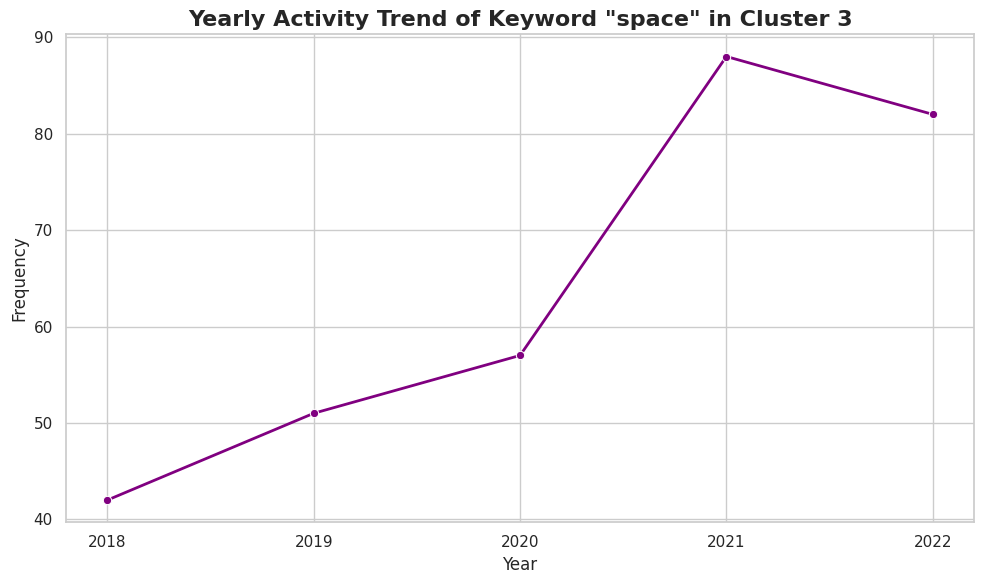

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Convert the 'date' column to datetime format if it's not already
keyword_df['date'] = pd.to_datetime(keyword_df['date'], format='%Y-%m-%d', errors='coerce')

# Specify the cluster you want to analyze
cluster_id = 3  # Replace with the desired cluster ID

# Filter the DataFrame for the specific cluster
cluster_df = keyword_df[keyword_df['y'] == cluster_id]

# Extract the year from the 'date' column
cluster_df['year'] = cluster_df['date'].dt.year

# Group by year and count occurrences
yearly_trend = cluster_df.groupby('year').size().reset_index(name='Frequency')

# Set style and palette
sns.set_palette("coolwarm")  # Set color palette
sns.set_style("whitegrid")

# Create the line plot for yearly trend
plt.figure(figsize=(10, 6))
sns.lineplot(x='year', y='Frequency', data=yearly_trend, marker='o', linewidth=2, color='purple')

# Add labels and titles
plt.title(f'Yearly Activity Trend of Keyword "{keyword}" in Cluster {cluster_id}', fontsize=16, weight='bold')
plt.xlabel('Year', fontsize=12)
plt.ylabel('Frequency', fontsize=12)
plt.xticks(yearly_trend['year'].astype(int))  # Ensure x-axis shows all year values

# Display the plot
plt.tight_layout()
plt.show()


 **Monthly Trend:**

<ipython-input-164-b63102b9d10b>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cluster_df['month'] = cluster_df['date'].dt.month


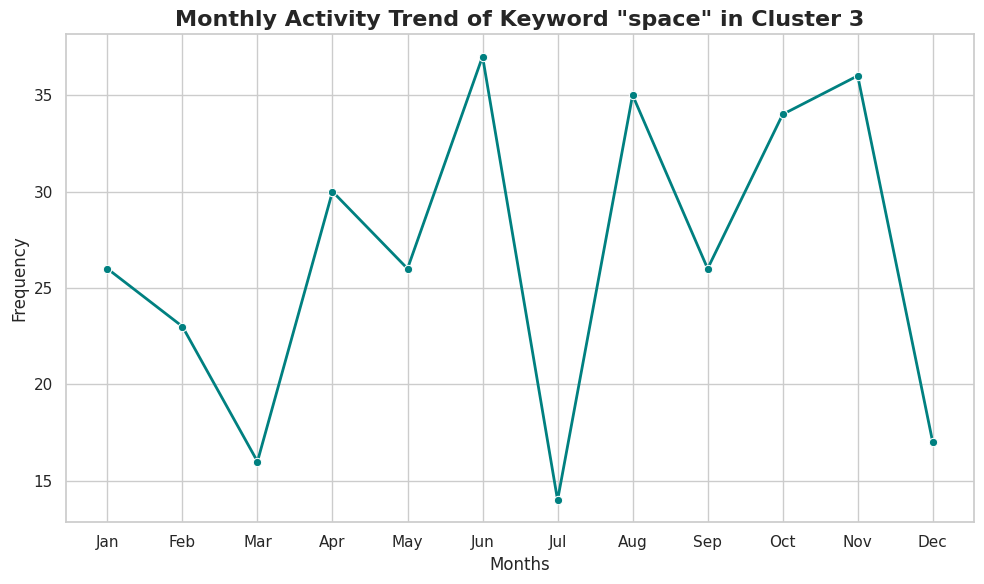

In [ ]:
# Extract month from the 'date' column
cluster_df['month'] = cluster_df['date'].dt.month

# Group by month and count occurrences
monthly_trend = cluster_df.groupby('month').size().reset_index(name='Frequency')

# Set style and palette
sns.set_palette("rocket")
sns.set_style("whitegrid")

# Create the line plot for monthly trend
plt.figure(figsize=(10, 6))
sns.lineplot(x='month', y='Frequency', data=monthly_trend, marker='o', linewidth=2, color='teal')

# Add labels and titles
plt.title(f'Monthly Activity Trend of Keyword "{keyword}" in Cluster {cluster_id}', fontsize=16, weight='bold')
plt.xlabel('Months', fontsize=12)
plt.ylabel('Frequency', fontsize=12)
plt.xticks(ticks=range(1, 13), labels=[
    'Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun',
    'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'
])

# Display the plot
plt.tight_layout()
plt.show()

**Daily Trend:**

<ipython-input-165-9ff330a2147a>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cluster_df['day'] = cluster_df['date'].dt.day


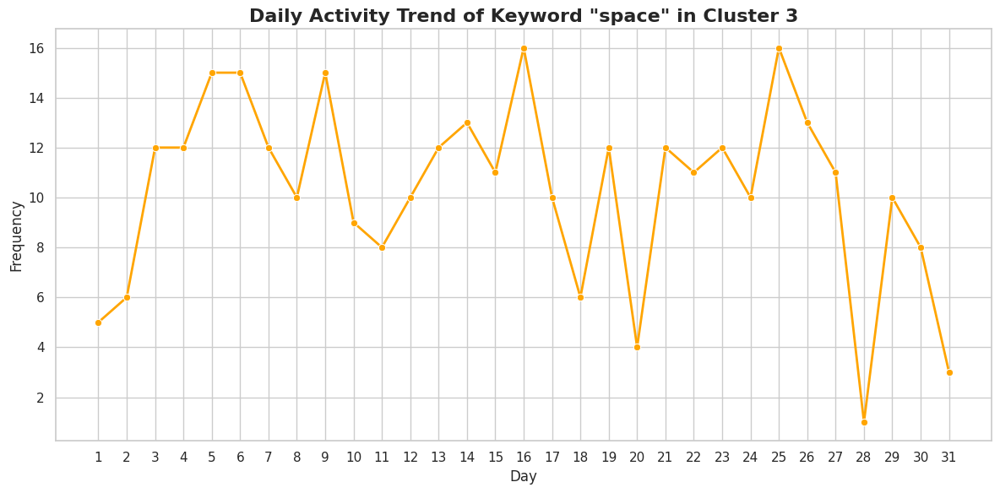

In [ ]:
# Extract the day from the 'date' column
cluster_df['day'] = cluster_df['date'].dt.day

# Group by day and count occurrences
daily_trend = cluster_df.groupby('day').size().reset_index(name='Frequency')

# Set style and palette
sns.set_palette("viridis")
sns.set_style("whitegrid")

# Create the line plot for daily trend
plt.figure(figsize=(12, 6))
sns.lineplot(x='day', y='Frequency', data=daily_trend, marker='o', linewidth=2, color='orange')

# Add labels and titles
plt.title(f'Daily Activity Trend of Keyword "{keyword}" in Cluster {cluster_id}', fontsize=16, weight='bold')
plt.xlabel('Day', fontsize=12)
plt.ylabel('Frequency', fontsize=12)
plt.xticks(ticks=range(1, 32))

# Display the plot
plt.tight_layout()
plt.show()

# Deployment

## Deployment Preparation

In [ ]:
df_preprocessed.head()

,title,content,author,date,postexcerpt,year,month,day,tokens,tokens_removed_stopwords,tokens_lemmatized,lemmatized_str
0,World View sees strong interest in stratospher...,world view sees strong interest in stratospher...,Jeff Foust,2018-01-02,"World View, a company offering stratospheric b...",2018,1,2,"['world', 'view', 'sees', 'strong', 'interest'...","['world', 'view', 'sees', 'strong', 'interest'...","['world', 'view', 'see', 'strong', 'interest',...",world view see strong interest stratospheric b...
1,Sorry scifi fans real wars in space not the st...,sorry scifi fans real wars in space not the st...,Sandra Erwin,2018-01-02,Savvy space warriors like Russia’s military al...,2018,1,2,"['sorry', 'scifi', 'fans', 'real', 'wars', 'in...","['sorry', 'scifi', 'fans', 'real', 'wars', 'sp...","['sorry', 'scifi', 'fan', 'real', 'war', 'spac...",sorry scifi fan real war space stuff hollywood...
2,Report calls for ISS research transition plan ...,report calls for iss research transition plan ...,Jeff Foust,2018-01-02,With utilization of the ISS reaching a maximum...,2018,1,2,"['report', 'calls', 'for', 'iss', 'research', ...","['report', 'calls', 'iss', 'research', 'transi...","['report', 'call', 'i', 'research', 'transitio...",report call i research transition plan use alt...
3,Air Force acquisition nominee a champion of co...,air force acquisition nominee a champion of co...,Sandra Erwin,2018-01-03,Roper: The world is changing rapidly due to th...,2018,1,3,"['air', 'force', 'acquisition', 'nominee', 'a'...","['air', 'force', 'acquisition', 'nominee', 'ch...","['air', 'force', 'acquisition', 'nominee', 'ch...",air force acquisition nominee champion commerc...
4,NASA streamlines management requirements for s...,nasa streamlines management requirements for s...,Jeff Foust,2018-01-03,NASA has enacted new policies intended to stre...,2018,1,3,"['nasa', 'streamlines', 'management', 'require...","['nasa', 'streamlines', 'management', 'require...","['nasa', 'streamlines', 'management', 'require...",nasa streamlines management requirement scienc...


In [ ]:
# Step 1: Filter the data for the years 2018 to 2022
filtered_df = df_preprocessed[(df_preprocessed['year'] >= 2018) & (df_preprocessed['year'] <= 2022)]


In [ ]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.manifold import TSNE
from sklearn.mixture import GaussianMixture
import numpy as np

# Step 3: Apply GMM (Gaussian Mixture Model) with 12 components and diag covariance type
gmm_model = GaussianMixture(n_components=12, covariance_type='diag', random_state=42)
gmm_labels = gmm_model.fit_predict(X_tsne)

# Step 4: Determine the number of unique clusters
unique_clusters = np.unique(gmm_labels)
n_clusters = len(unique_clusters)

# Step 5: Display the number of clusters found using GMM
print(f"Number of clusters after GMM: {n_clusters}")
print(f"Unique cluster labels: {unique_clusters}")



Number of clusters after GMM: 12
Unique cluster labels: [ 0  1  2  3  4  5  6  7  8  9 10 11]


In [ ]:
filtered_df.loc[:, 'y'] = gmm_labels

# Display the first few rows of the dataframe with clusters
filtered_df[['date', 'year', 'title', 'y']].head()

,date,year,title,y
0,2018-01-02,2018,World View sees strong interest in stratospher...,10
1,2018-01-02,2018,Sorry scifi fans real wars in space not the st...,6
2,2018-01-02,2018,Report calls for ISS research transition plan ...,2
3,2018-01-03,2018,Air Force acquisition nominee a champion of co...,6
4,2018-01-03,2018,NASA streamlines management requirements for s...,2


In [ ]:
X_embedded = X_tsne

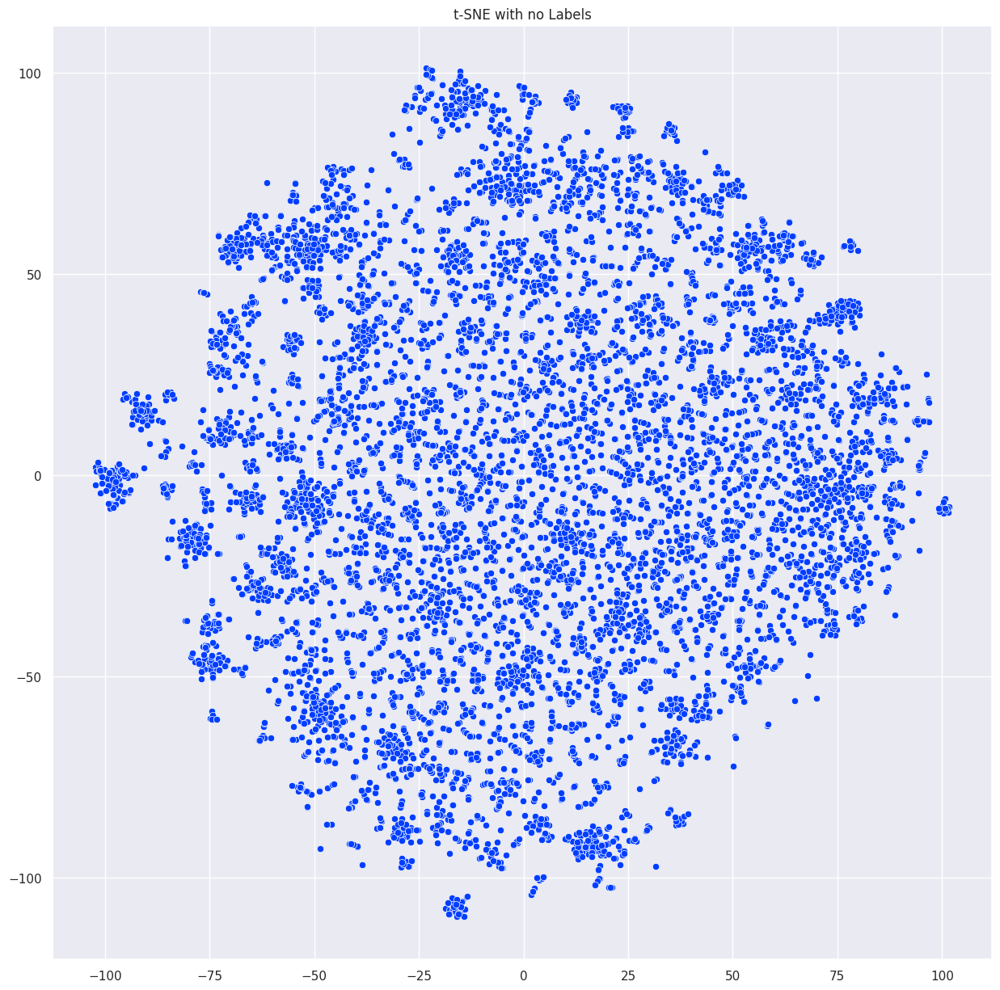

In [ ]:
from matplotlib import pyplot as plt
import seaborn as sns

# sns settings
sns.set(rc={'figure.figsize':(15,15)})

# colors
palette = sns.color_palette("bright", 1)[0]  # Get a single color from the palette

# plot
sns.scatterplot(x=X_embedded[:,0], y=X_embedded[:,1], color=palette)
plt.title('t-SNE with no Labels')
plt.show()

In [ ]:
y_pred = gmm_labels

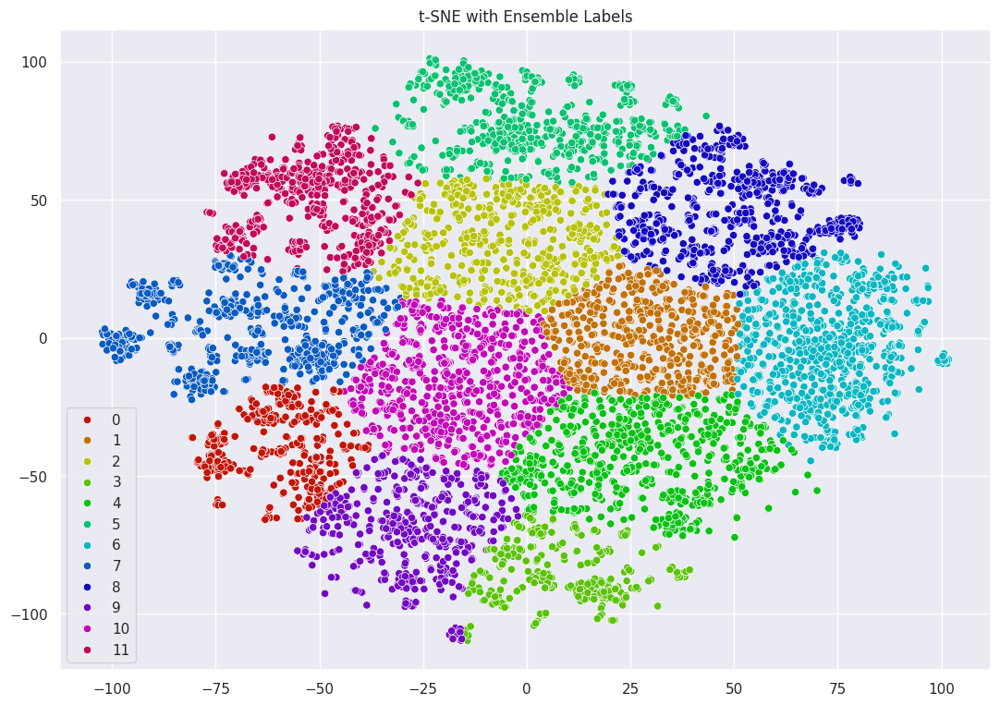

In [ ]:
%matplotlib inline
from matplotlib import pyplot as plt
import seaborn as sns

# sns settings
sns.set(rc={'figure.figsize': (13, 9)})

# Ensure the number of colors matches the number of unique labels
n_clusters = len(set(y_pred))  # or explicitly set the number of clusters
palette = sns.hls_palette(n_clusters, l=.4, s=.9)

# plot
sns.scatterplot(x=X_embedded[:, 0], y=X_embedded[:, 1], hue=y_pred, palette=palette, legend='full')
plt.title('t-SNE with Ensemble Labels')
plt.savefig("improved_cluster_tsne.png")
plt.show()

In [ ]:
k = 12

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer

vectorizers = []

for ii in range(0, k):
    vectorizer = CountVectorizer(
        min_df=5,
        max_df=0.9,
        stop_words='english',
        lowercase=True,
        token_pattern='[a-zA-Z\-][a-zA-Z\-]{2,}'
    )
    vectorizers.append(vectorizer)


In [ ]:
vectorizers[0]

CountVectorizer(max_df=0.9, min_df=5, stop_words='english',
                token_pattern='[a-zA-Z\\-][a-zA-Z\\-]{2,}')

In [ ]:
vectorized_data = []

for current_cluster, cvec in enumerate(vectorizers):
    try:
        vectorized_data.append(cvec.fit_transform(filtered_df.loc[filtered_df['y'] == current_cluster, 'lemmatized_str']))
    except Exception as e:
        print("Not enough instances in cluster: " + str(current_cluster))
        vectorized_data.append(None)

In [ ]:
len(vectorized_data)

12

In [ ]:
from sklearn.decomposition import LatentDirichletAllocation

# number of topics per cluster
NUM_TOPICS_PER_CLUSTER = k


lda_models = []

for ii in range(0, k):
    # Latent Dirichlet Allocation Model
    lda = LatentDirichletAllocation(n_components=NUM_TOPICS_PER_CLUSTER, max_iter=10, learning_method='online',verbose=False, random_state=42)
    lda_models.append(lda)

lda_models[0]

LatentDirichletAllocation(learning_method='online', n_components=12,
                          random_state=42, verbose=False)

In [ ]:
clusters_lda_data = []

for current_cluster, lda in enumerate(lda_models):
    print("Current Cluster: " + str(current_cluster))

    if vectorized_data[current_cluster] != None:
        clusters_lda_data.append((lda.fit_transform(vectorized_data[current_cluster])))

Current Cluster: 0
Current Cluster: 1
Current Cluster: 2
Current Cluster: 3
Current Cluster: 4
Current Cluster: 5
Current Cluster: 6
Current Cluster: 7
Current Cluster: 8
Current Cluster: 9
Current Cluster: 10
Current Cluster: 11


In [ ]:
def selected_topics(model, vectorizer, top_n=3):
    current_words = set()  # Use a set for O(1) lookups
    keywords = []

    # Get feature names from the vectorizer
    feature_names = vectorizer.get_feature_names_out()

    # Iterate over each topic in the LDA model
    for idx, topic in enumerate(model.components_):
        # Get top_n keywords and their scores
        top_words = [(feature_names[i], topic[i]) for i in topic.argsort()[:-top_n - 1:-1]]
        for word in top_words:
            if word[0] not in current_words:
                keywords.append(word)
                current_words.add(word[0])  # Add to set for quick lookup

    # Sort keywords by their score in descending order
    keywords.sort(key=lambda x: x[1], reverse=True)

    # Extract and return only the words
    return [word[0] for word in keywords]


In [ ]:
all_keywords = []
for current_vectorizer, lda in enumerate(lda_models):
    print("Current Cluster: " + str(current_vectorizer))

    if vectorized_data[current_vectorizer] != None:
        all_keywords.append(selected_topics(lda, vectorizers[current_vectorizer]))

Current Cluster: 0
Current Cluster: 1
Current Cluster: 2
Current Cluster: 3
Current Cluster: 4
Current Cluster: 5
Current Cluster: 6
Current Cluster: 7
Current Cluster: 8
Current Cluster: 9
Current Cluster: 10
Current Cluster: 11


In [ ]:
all_keywords[1][:10]

['space',
 'agency',
 'satellite',
 'development',
 'force',
 'lockheed',
 'martin',
 'startup',
 'industry',
 'launch']

In [ ]:
len(all_keywords)

12

In [ ]:
f=open('topics.txt','w')

count = 0

for ii in all_keywords:

    if vectorized_data[count] != None:
        f.write(', '.join(ii) + "\n")
    else:
        f.write("Not enough instances to be determined. \n")
        f.write(', '.join(ii) + "\n")
    count += 1

f.close()

In [ ]:
import pickle
pickle.dump(filtered_df, open("df.p", "wb" ))

# save the final t-SNE
pickle.dump(X_embedded, open("X_embedded.p", "wb" ))

# save the labels generate with k-means(8)
pickle.dump(y_pred, open("y_pred.p", "wb" ))

In [ ]:
# Dictionary to store new file paths for the renamed models
new_model_paths = {
    'Agglomerative Clustering': 'agg_model.pkl',
    'Spectral Clustering': 'spectral_model.pkl',
    'BIRCH': 'birch_model.pkl',
    'Gaussian Mixture Model (GMM)': 'gmm_model.pkl'
}

# Save models with new names
for model_name, model in loaded_models.items():
    if model_name in new_model_paths:
        new_model_path = new_model_paths[model_name]
        try:
            # Save the model with the new filename
            with open(new_model_path, 'wb') as new_model_file:
                pickle.dump(model, new_model_file)
            print(f"Successfully saved {model_name} as {new_model_path}")

        except Exception as e:
            print(f"Error occurred while saving {model_name}: {e}")


NameError: name 'loaded_models' is not defined

In [ ]:
import os

# Create a directory named 'lib'
os.makedirs('lib', exist_ok=True)  # exist_ok=True avoids an error if the directory already exists

# List the contents of the current directory
print(os.listdir('.'))


In [ ]:
import os
import shutil
import requests

# Create directory 'lib' if it doesn't exist
os.makedirs('lib', exist_ok=True)

# URLs of the files to download
urls = [
    'https://raw.githubusercontent.com/darrencxl0301/Machiene-Learning/main/call_backs.py',
    'https://raw.githubusercontent.com/darrencxl0301/Machiene-Learning/main/plot_text.py'
]

# Download and save the files to the current working directory
for url in urls:
    filename = url.split('/')[-1]

    # Download the file
    response = requests.get(url)
    if response.status_code == 200:
        with open(filename, 'wb') as file:
            file.write(response.content)
        print(f"{filename} downloaded successfully.")
    else:
        print(f"Failed to download {filename}. Status code: {response.status_code}")

    # Move the downloaded files to the 'lib' directory
    shutil.move(filename, os.path.join('lib', filename))

# List contents of 'lib' directory
print(os.listdir('lib'))


In [ ]:
# Required libraries for plot
from lib.call_backs import input_callback, selected_code

import bokeh
from bokeh.models import ColumnDataSource, HoverTool, LinearColorMapper, CustomJS, Slider, TapTool, TextInput
from bokeh.palettes import Category20
from bokeh.transform import linear_cmap, transform
from bokeh.io import output_file, show, output_notebook
from bokeh.plotting import figure
from bokeh.models import RadioButtonGroup, TextInput, Div, Paragraph
from bokeh.layouts import column, row, layout  # Removed widgetbox


In [ ]:
import os

topic_path = os.path.join(os.getcwd(), 'topics.txt')
with open(topic_path) as f:
    topics = f.readlines()

In [ ]:
pip install streamlit


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.7/8.7 MB 64.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.3/207.3 kB 16.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.9/6.9 MB 92.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 82.9/82.9 kB 6.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 4.8 MB/s eta 0:00:00
  Attempting uninstall: tenacity
    Found existing installation: tenacity 9.0.0
    Uninstalling tenacity-9.0.0:
      Successfully uninstalled tenacity-9.0.0


In [ ]:
pip install --force-reinstall --no-deps bokeh==2.4.3


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.5/18.5 MB 26.5 MB/s eta 0:00:00
  Attempting uninstall: bokeh
    Found existing installation: bokeh 3.4.3
    Uninstalling bokeh-3.4.3:
      Successfully uninstalled bokeh-3.4.3


In [ ]:
# Save the DataFrame as a Pickle file
filtered_df.to_pickle('filtered_df.pkl')


In [ ]:
import pickle

# Save X_embedded
with open('X_embedded.pkl', 'wb') as f:
    pickle.dump(X_embedded, f)

y_labels = y_pred
# Save y_labels
with open('y_labels.pkl', 'wb') as f:
    pickle.dump(y_labels, f)


In [ ]:
pip freeze


absl-py==1.4.0
accelerate==0.34.2
aiohappyeyeballs==2.4.0
aiohttp==3.10.5
aiosignal==1.3.1
alabaster==0.7.16
albucore==0.0.14
albumentations==1.4.14
altair==4.2.2
annotated-types==0.7.0
anyio==3.7.1
argon2-cffi==23.1.0
argon2-cffi-bindings==21.2.0
array_record==0.5.1
arviz==0.18.0
asn1crypto==1.5.1
astropy==6.1.3
astropy-iers-data==0.2024.9.11.18.16.39
astunparse==1.6.3
async-timeout==4.0.3
atpublic==4.1.0
attrs==24.2.0
audioread==3.0.1
autograd==1.7.0
babel==2.16.0
backcall==0.2.0
beautifulsoup4==4.12.3
bidict==0.23.1
bigframes==1.17.0
bigquery-magics==0.2.0
bleach==6.1.0
blinker==1.4
blis==0.7.11
blosc2==2.0.0
bokeh==2.4.3
bqplot==0.12.43
branca==0.7.2
build==1.2.2
CacheControl==0.14.0
cachetools==5.5.0
catalogue==2.0.10
certifi==2024.8.30
cffi==1.17.1
chardet==5.2.0
charset-normalizer==3.3.2
chex==0.1.86
clarabel==0.9.0
click==8.1.7
click-plugins==1.1.1
cligj==0.7.2
cloudpathlib==0.19.0
cloudpickle==2.2.1
cmake==3.30.3
cmdstanpy==1.2.4
colorcet==3.1.0
colorlover==0.3.0
colour==0.1.5

In [ ]:
%%writefile app.py
import os
import streamlit as st
from bokeh.plotting import figure
from bokeh.layouts import column, row
from bokeh.models import ColumnDataSource, Slider, TextInput, Div, HoverTool
from bokeh.palettes import Category20
from bokeh.transform import factor_cmap
import numpy as np
import pandas as pd
import pickle
from sklearn.decomposition import PCA
import plotly.express as px
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
from plotly.subplots import make_subplots
import plotly.graph_objects as go
from sklearn.mixture import GaussianMixture
from sklearn.cluster import AgglomerativeClustering, SpectralClustering, Birch




# Page selection for navigation
page = st.sidebar.selectbox("Select a page:", ["Home", "Dashboard"])

if page == "Home":
    # Big title for the app
    st.title("Space News Articles Clustering")

    # Subtitle for the description
    st.markdown("## Description")

    # Updated paragraph
    st.markdown("""
    The ensemble model combines **GMM** with 12 components and **t-SNE** for dimensionality reduction, allowing us to visualize high-dimensional data in a clear and interpretable way.
    """)

    # Load topics from 'topics.txt' file using os.path.join
    topic_path = os.path.join(os.getcwd(), 'topics.txt')
    with open(topic_path) as f:
        topics = [line.strip() for line in f.readlines()]  # Each line corresponds to keywords for a specific cluster

    # Associate each cluster (0 to 12) with its corresponding keywords from 'topics.txt'
    cluster_keywords = {
        i: topics[i] if i < len(topics) else "Not enough instances to be determined." for i in range(13)
    }

    # Load X_embedded
    with open('X_embedded.pkl', 'rb') as f:
        X_embedded = pickle.load(f)

    # Load y_labels
    with open('y_labels.pkl', 'rb') as f:
        y_labels = pickle.load(f)

    # Load filtered_df
    filtered_df = pd.read_pickle('filtered_df.pkl')

    # Data source for Bokeh
    def filter_data(cluster_value, search_term):
        """Filter the data based on the cluster value and search term."""
        if cluster_value == 12:  # Show all clusters
            mask = filtered_df['title'].str.contains(search_term, case=False, na=False)
        else:
            mask = (y_labels == cluster_value) & filtered_df['title'].str.contains(search_term, case=False, na=False)

        return X_embedded[mask], filtered_df[mask], y_labels[mask]

    # Create Bokeh plot
    hover = HoverTool(tooltips=[("Title", "@titles{safe}"), ("Date", "@date{safe}")], point_policy="follow_mouse")

    def create_plot(x_data, titles, dates, labels):
        source = ColumnDataSource(data=dict(
            x=x_data[:, 0],
            y=x_data[:, 1],
            titles=titles,
            date=dates,
            desc=[str(label) for label in labels]  # Convert labels to strings for color mapping
        ))

        # Use Category20 palette for 12 clusters (using Category20[12])
        palette = Category20[12]  # Adjusted palette with 12 distinct colors

        # Use factor_cmap to map cluster labels to colors
        mapper = factor_cmap('desc', palette=palette, factors=[str(i) for i in range(12)])  # Assuming clusters 0 to 11

        plot = figure(width=700, height=500, tools=[hover, 'pan', 'wheel_zoom', 'box_zoom', 'reset', 'tap'],
                    title="Clustering of the space news articles with t-SNE and GMM", toolbar_location="above")

        plot.scatter('x', 'y', size=5, source=source, fill_color=mapper, line_alpha=0.3, line_color="black", legend_field='desc')

        return plot

    # Add Widgets for filtering
    slider = st.slider("Cluster #", 0, 12, 12, help="Slide to filter clusters, 12 means all clusters")
    keyword = st.text_input("Search:", "", help="Search by keywords")

    # Display the keywords for the selected cluster in a smaller font using HTML
    if 0 <= slider <= 11:
        st.markdown(f"<b>Keywords for Cluster {slider}</b>", unsafe_allow_html=True)
    else:
        st.markdown("<b>All Clusters</b>", unsafe_allow_html=True)
    st.markdown(f"<small>{cluster_keywords.get(slider, 'No keywords available for this cluster.')}</small>", unsafe_allow_html=True)


    # Filter data based on slider and keyword input
    x_data, filtered_titles, filtered_labels = filter_data(slider, keyword)

    # Create updated plot
    plot = create_plot(x_data, filtered_titles['title'], filtered_titles['date'], filtered_labels)

    # Display the plot in Streamlit
    st.bokeh_chart(plot)

elif page == "Dashboard":
    st.title("Interactive Clustering Dashboard")
    st.markdown(
        """
        <div id="tracker">
            <!-- Invisible element for mouse tracking -->
        </div>

        <div id="text">
            <p>Move your mouse to <span class="highlight">play&nbsp;with&nbsp;the&nbsp;cat.</span></p>
            <p>Click the button to <span class="highlight">get&nbsp;back&nbsp;to&nbsp;work.</span></p>
        </div>

        <main>
            <button id="target">
                Stop<br />playing
                <img id="cursor" src="https://s3-us-west-2.amazonaws.com/s.cdpn.io/240751/mac-osx-arrow-cursor.png" alt="">
            </button>
            <!-- SVG created with Affinity Designer -->
            <svg id="Cat" width="100%" height="100%" viewBox="-80 0 200 199" xmlns="http://www.w3.org/2000/svg">
                <rect id="Artboard1" x="0" y="0" width="104.557" height="198.931" style="fill:none;"/>
                <path id="Body" d="M21.605,75.113c2.759,17.247 -5.015,37.589 -6.724,59.831c-1.71,22.241 0.016,62.893 30.999,62.893c0.946,0 1.873,-0.075 2.784,-0.058c34.988,0.655 40.376,-21.661 35.482,-45.091c-5.047,-24.167 -22.908,-35.604 -24.535,-74.071c-1.627,-38.467 -42.011,-28.548 -38.006,-3.504Z"/>
                <path id="Head-main" serif:id="Head main" d="M60.011,27.971c4.811,-11.449 12.131,-28.237 13.564,-27.938c2.015,0.422 6.111,41.652 6.688,47.562c0.027,0.233 0.049,0.467 0.068,0.702l0,0.001l0,0c0.043,0.537 -0.064,1.099 0.064,1.639c4.823,20.225 -6.8,28.68 -39.075,28.68c-32.275,0 -43.354,-10.637 -39.075,-28.68c0.128,-0.541 0.022,-1.102 0.064,-1.64l-0.064,0.001c0,0 5.295,-47.81 7.466,-48.265c1.425,-0.298 8.674,16.308 13.486,27.752c5.404,-1.544 11.553,-2.337 18.078,-2.337c6.783,0 13.168,0.856 18.736,2.523Z"/>
                <g id="Left-eye" serif:id="Left eye">
                    <circle cx="17.962" cy="55.289" r="11.393" style="fill:#fff;"/>
                    <g id="Left-eye-pupil" serif:id="Left eye pupil">
                        <circle cx="16.068" cy="53.396" r="9.499"/>
                        <circle cx="13.934" cy="48.382" r="2.134" style="fill:#fff;"/>
                    </g>
                </g>
                <g id="Right-eye" serif:id="Right eye">
                    <circle cx="64.679" cy="55.289" r="11.393" style="fill:#fff;"/>
                    <g id="Right-eye-pupil" serif:id="Right eye pupil">
                        <circle cx="61.777" cy="53.396" r="9.499"/>
                        <circle cx="59.643" cy="48.382" r="2.134" style="fill:#fff;"/>
                    </g>
                </g>
                <path id="Tail" d="M80.004,178.286c-0.131,0.058 12.828,-18.528 5.347,-42.302c-7.482,-23.774 2.767,-37.597 13.789,-42.67" style="fill:none;stroke:#000;stroke-width:8px;"/>
                <path id="Paw" d="M29.354,99.466c-0.04,-20.799 15.679,-43.724 6.404,-62.895" style="fill:none;stroke:#000;stroke-width:10px;"/>
            </svg>
        </main>

        <style>
        @import url('https://fonts.googleapis.com/css?family=Luckiest+Guy&display=swap');

        /* Custom styling and animations */
        body {
            background: #feeeed;
            margin: 0;
            box-sizing: border-box;
            position: relative;
            display: grid;
            place-items: center;
            min-height: 100vh;
            font-size: 18px;
            font-family: 'Luckiest Guy', sans-serif;
            color: #7BA7BC;
            grid-template-rows: 1fr 4fr;
            overflow: hidden;
        }

        #tracker {
            width: 100vw;
            height: 100vh;
            position: fixed;
            top: 0;
            left: 0;
            z-index: 5;
        }

        p {
            font-size: calc(1.1rem + 1vw);
            line-height: 1.4em;
            margin: 0;
            text-align: center;
            color: #333;
        }

        .highlight {
            color: #7BA7BC;
        }

        main {
            width: 100%;
            max-width: 22rem;
            display: flex;
            align-items: center;
        }

        button {
            padding: .5em .8em .3em;
            font-weight: bold;
            background: #7BA7BC;
            color: #fff;
            border-radius: 5rem;
            margin-right: -10rem;
            cursor: none;
            border: none;
            font-size: 1.5rem;
            line-height: 1;
            color: #333;
            border: .2rem solid #333;
            transition: margin .05s ease;
        }

        #cursor {
            position: absolute;
            width: 16px;
            left: 50%;
            top: 50%;
            z-index: -2;
            transform-origin: center;
            opacity: 0;
        }

        #Cat {
            transform-origin: bottom center;
            animation: tail 7s infinite alternate;
            z-index: 0;
            pointer-events: none;
        }

        #Tail {
            transform-origin: bottom;
            animation: tail 2s ease infinite alternate;
        }

        #Paw {
            transform-origin: 16% 53%;
            transform: rotate(-185deg);
            transition: all .2s;
        }

        @keyframes tail {
            0% {
                transform: rotate(0deg);
            }
            27% {
                transform: rotate(2deg);
            }
            69% {
                transform: rotate(-2deg);
            }
            100% {
                transform: rotate(0deg);
            }
        }

        /* Additional animations and styling */
        </style>

        <script>
        // JavaScript for mouse tracking and animations
        const get = arg => document.querySelector(arg);
        const tracker = get('#tracker');
        const button = get('button');
        const paw = get('#Paw');
        const tail = get('#Tail');
        const leftEye = get('#Left-eye-pupil');
        const rightEye = get('#Right-eye-pupil');
        const cat = get('svg');
        const cursor = get('#cursor');

        const mouseOver = () => {
            paw.style.transform = 'rotate(-185deg)';
            if(!paw.classList.value.includes('swat')) {
                paw.classList.add('swat');
                cursor.classList.add('swatted');
                document.body.style.cursor = 'none';
                cat.style.animation = 'none';
                tail.style.animation = 'none';
                document.body.style.cursor = 'none';
                button.style.marginRight = '-11rem';
            }
        }

        const mouseOut = () => {
            if(paw.classList.value.includes('swat')) {
                paw.classList.remove('swat');
                cursor.classList.remove('swatted');
                cat.style.animation = 'tail 7s infinite alternate';
                tail.style.animation = 'tail 2s ease infinite alternate';
                document.body.style.cursor = 'unset';
                button.style.marginRight = '-10rem';
            }
        }

        const mouseNear = (coords, x, y) => {
            const minY = coords.y - coords.height;
            const maxY = coords.y + (coords.height * 2);
            const minX = coords.x - coords.width;
            const maxX = coords.x + (coords.width * 2);
            const zeroX = (maxX + minX) / 2;
            const zeroY = (maxY + minY) / 2;
            paw.style.transform = `rotate(-${60 / (zeroX + zeroY) * (x + y)}deg)`;
        }

        const overTheButton = (coords, x, y) => {
            return y >= coords.y && y <= coords.y + coords.height && x >= coords.x && x <= coords.x + coords.width;
        }

        const nearTheButton = (coords, x, y) => {
            return y >= coords.y - (coords.height * 2) && y <= coords.y + (coords.height * 3) && x >= coords.x - coords.width && x <= coords.x + (coords.width * 2);
        }

        tracker.addEventListener('mousemove', e => {
            const btnCoords = button.getBoundingClientRect();
            const x = e.offsetX;
            const y = e.offsetY;

            if(overTheButton(btnCoords, x, y)) {
                mouseOver();
            } else {
                mouseOut();
                if (nearTheButton(btnCoords, x, y)) {
                    mouseNear(btnCoords, x, y);
                } else {
                    paw.style.transform = 'rotate(-185deg)';
                }
            }

            [leftEye, rightEye].forEach(eye => {
                eye.style.transform = `translate(${3 / (window.innerWidth / x)}%, ${3 / (window.innerHeight / y)}%)`;
            });
        });
        </script>
        """,
        unsafe_allow_html=True
    )


    with open('X_embedded.pkl', 'rb') as f:
        X_embedded = pickle.load(f)

    # Load y_labels for clustering labels (optional if used)
    with open('y_labels.pkl', 'rb') as f:
        y_labels = pickle.load(f)

    # Data Input: File upload or text input for user-uploaded data
    uploaded_file = st.file_uploader("Upload your dataset (CSV)", type=["csv"])

    if uploaded_file is not None:
        # Load the data
        df = pd.read_csv(uploaded_file)
        st.write("Data Preview:", df.head())

        # Use X_embedded for dimensionality reduction instead of full dataset
        X = X_embedded

        # Data Exploration: Filter and sort with selectbox and sliders
        # Data Exploration: Filter and sort with selectbox and sliders
        if st.checkbox("Explore Data"):
            column_to_filter = st.selectbox("Select a column to filter:", df.columns)

            # Check if the selected column is of datetime type or can be converted to datetime
            if pd.api.types.is_datetime64_any_dtype(df[column_to_filter]):
                # Handle date columns with st.date_input
                st.write("Date column detected. Please select a date range.")
                start_date = st.date_input(f"Start date for {column_to_filter}:", value=pd.to_datetime(df[column_to_filter]).min())
                end_date = st.date_input(f"End date for {column_to_filter}:", value=pd.to_datetime(df[column_to_filter]).max())
                filtered_data = df[(pd.to_datetime(df[column_to_filter]) >= start_date) & (pd.to_datetime(df[column_to_filter]) <= end_date)]

            elif pd.api.types.is_numeric_dtype(df[column_to_filter]):
                # Handle numeric columns with st.slider
                filter_value = st.slider(f"Select a value for {column_to_filter}:", min_value=int(df[column_to_filter].min()), max_value=int(df[column_to_filter].max()))
                filtered_data = df[df[column_to_filter] == filter_value]

            else:
                # Handle non-numeric, non-date columns with st.selectbox
                filter_value = st.selectbox(f"Select a value for {column_to_filter}:", df[column_to_filter].unique())
                filtered_data = df[df[column_to_filter] == filter_value]

            st.write("Filtered Data", filtered_data)


        # PCA Visualization: Apply PCA and visualize the data in reduced dimensions
        # PCA Visualization: Apply PCA and visualize the data in reduced dimensions
        # PCA Visualization: Apply PCA and visualize the data in reduced dimensions
        if st.checkbox("PCA Visualization"):
            # PCA with 2 components
            pca = PCA(n_components=2)
            pca_result = pca.fit_transform(df.select_dtypes(include=[np.number]))

            # Display explained variance ratio for each component
            st.write(f"PCA Explained Variance Ratio for PC1 and PC2: {pca.explained_variance_ratio_}")

            # Create a DataFrame with PCA results
            pca_df = pd.DataFrame(X_embedded, columns=['PC1', 'PC2'])
            pca_df['Cluster'] = df['Cluster'] if 'Cluster' in df.columns else np.random.randint(0, 12, len(X_embedded))

            # Plot 2D scatter plot for PC1 vs PC2
            pca_fig = px.scatter(pca_df, x='PC1', y='PC2', color='Cluster', title="PCA 2D Cluster Visualization", color_continuous_scale='Viridis')
            st.plotly_chart(pca_fig)

            # 3D PCA Visualization
            pca_3d = PCA(n_components=3)
            pca_3d_result = pca_3d.fit_transform(df.select_dtypes(include=[np.number]))
            pca_3d_df = pd.DataFrame(pca_3d_result, columns=['PC1', 'PC2', 'PC3'])
            pca_3d_df['Cluster'] = df['Cluster'] if 'Cluster' in df.columns else np.random.randint(0, 12, len(df))

            # 3D scatter plot for PC1, PC2, and PC3
            pca_3d_fig = px.scatter_3d(pca_3d_df, x='PC1', y='PC2', z='PC3', color='Cluster', title="PCA 3D Cluster Visualization", color_continuous_scale='Plasma')
            st.plotly_chart(pca_3d_fig)

            # Visualize loadings: how features contribute to each principal component
            st.markdown("### Feature Contribution to Principal Components")
            loadings = pd.DataFrame(pca.components_.T, columns=['PC1', 'PC2'], index=df.select_dtypes(include=[np.number]).columns)
            st.write(loadings)

            # Bar plot to show the contribution of features to PC1 and PC2
            loadings_fig = px.bar(loadings, x=loadings.index, y='PC1', title="Feature Contribution to PC1")
            st.plotly_chart(loadings_fig)

            loadings_fig2 = px.bar(loadings, x=loadings.index, y='PC2', title="Feature Contribution to PC2")
            st.plotly_chart(loadings_fig2)



        # Interactive Charts: Dynamic visualizations with Plotly or Altair
        # Interactive Charts: Dynamic visualizations with meaningful colors
        # Interactive Charts: Dynamic visualizations with meaningful colors
        if st.checkbox("Interactive Charts"):
            chart_type = st.selectbox("Select Chart Type", ["2D Scatter", "2D Line Plot", "3D Scatter"])
            color_by = st.selectbox("Color by", options=df.columns)  # Choose column to color by

            if chart_type == "2D Scatter":
                # Plot a 2D scatter plot
                fig = px.scatter(df, x=df.columns[1], y=df.columns[2], color=color_by, title="2D Scatter Plot")
                st.plotly_chart(fig)

            elif chart_type == "2D Line Plot":
                # Plot a 2D line plot
                fig = px.line(df, x=df.columns[1], y=df.columns[2], color=color_by, title="2D Line Plot")
                st.plotly_chart(fig)

            elif chart_type == "3D Scatter":
                # Plot a 3D scatter plot
                fig = px.scatter_3d(df, x=df.columns[1], y=df.columns[2], z=df.columns[3], color=color_by, title="3D Scatter Plot")
                st.plotly_chart(fig)



        # Model Performance Metrics: Display clustering performance metrics

        # Model Performance Metrics and Dynamic Parameter Adjustment
        if st.checkbox("Model Performance Metrics and Clustering"):
            model_type = st.selectbox("Select model for metrics and clustering:", ['GMM', 'Agglomerative Clustering', 'Spectral Clustering', 'Birch Clustering'])

            # Input parameters based on model type
            if model_type == 'GMM':
                n_components = st.slider("Number of Components (Clusters)", min_value=2, max_value=10, value=3)
                covariance_type = st.selectbox("Covariance Type", ['full', 'tied', 'diag', 'spherical'])
                model = GaussianMixture(n_components=n_components, covariance_type=covariance_type)
                predicted_labels = model.fit_predict(X_embedded)

            elif model_type == 'Agglomerative Clustering':
                n_clusters = st.slider("Number of Clusters", min_value=2, max_value=10, value=3)
                linkage = st.selectbox("Linkage Type", ['ward', 'complete', 'average', 'single'])
                model = AgglomerativeClustering(n_clusters=n_clusters, linkage=linkage)
                predicted_labels = model.fit_predict(X_embedded)

            elif model_type == 'Spectral Clustering':
                n_clusters = st.slider("Number of Clusters", min_value=2, max_value=10, value=3)
                affinity = st.selectbox("Affinity", ['nearest_neighbors', 'rbf'])
                if affinity == 'nearest_neighbors':
                    n_neighbors = st.slider("Number of Neighbors", min_value=2, max_value=25, value=10)  # New slider for n_neighbors
                    model = SpectralClustering(n_clusters=n_clusters, affinity=affinity, n_neighbors=n_neighbors, assign_labels='kmeans')
                else:
                    model = SpectralClustering(n_clusters=n_clusters, affinity=affinity, assign_labels='kmeans')
                predicted_labels = model.fit_predict(X_embedded)

            elif model_type == 'Birch Clustering':
                n_clusters = st.slider("Number of Clusters", min_value=2, max_value=10, value=3)
                threshold = st.slider("Threshold", min_value=0.1, max_value=1.0, value=0.5)
                model = Birch(n_clusters=n_clusters, threshold=threshold)
                predicted_labels = model.fit_predict(X_embedded)

            # Calculate clustering metrics
            silhouette_avg = silhouette_score(X_embedded, predicted_labels)
            davies_bouldin = davies_bouldin_score(X_embedded, predicted_labels)
            calinski_harabasz = calinski_harabasz_score(X_embedded, predicted_labels)

            # Create two columns: one for metrics and one for the cluster plot
            col1, col2 = st.columns([1, 3])  # Left column (1) for metrics, right column (3) for plot

            # Display metrics on the left side in a more compact form
            with col1:
                st.caption("Performance Metrics:")
                st.metric("Silhouette", round(silhouette_avg, 2), delta=None, help="Silhouette Score (higher is better)")
                st.metric("Davies-Bouldin", round(davies_bouldin, 2), delta=None, help="Davies-Bouldin Index (lower is better)")
                st.metric("Calinski-Harabasz", round(calinski_harabasz, 2), delta=None, help="Calinski-Harabasz Index (higher is better)")

            # Plot the clustering result on the right side
            with col2:
                fig = go.Figure()

                custom_colors = ['#636EFA', '#EF553B', '#00CC96', '#AB63FA', '#FFA15A', '#19D3F3', '#FF6692', '#B6E880', '#FF97FF', '#FECB52']

                fig.add_trace(go.Scatter(
                    x=X_embedded[:, 0],
                    y=X_embedded[:, 1],
                    mode='markers',
                    marker=dict(
                        size=8,
                        color=predicted_labels,
                        colorscale=[(i / (len(custom_colors) - 1), color) for i, color in enumerate(custom_colors)],  # Custom color scale
                        showscale=True
                    ),
                    name=f'{model_type} Clusters'
                ))

                fig.update_layout(
                    title=f"{model_type} Clustering with User-Defined Parameters",
                    xaxis_title="Dimension 1",
                    yaxis_title="Dimension 2",
                    height=600,
                    showlegend=False
                )

                # Display the interactive cluster plot
                st.plotly_chart(fig)



        # Feature Importance: Visualize with a heatmap or bar plot
        if st.checkbox("Feature Importance"):
            # Only use numeric columns for correlation analysis
            numeric_columns = df.select_dtypes(include=[np.number])

            if numeric_columns.shape[1] > 1:
                st.markdown("### Feature Importance Heatmap")
                corr = numeric_columns.corr()
                plt.figure(figsize=(10, 8))
                sns.heatmap(corr, annot=True, cmap='coolwarm')
                st.pyplot(plt)
            else:
                st.write("No sufficient numeric columns for feature importance analysis.")


        # Clustering Interface: Allow input for new data and cluster it, then recommend similar articles
        if st.checkbox("Clustering Interface"):
            # User enters a title or keywords
            new_data = st.text_area("Enter a title or keywords for recommendations:")

            if new_data:
                # Step 1: Convert the input text into numerical features using TF-IDF
                vectorizer = TfidfVectorizer(max_features=1000)  # Adjust max_features as needed
                all_titles = df['title'].tolist()  # Use titles from the input data (df)
                all_titles.append(new_data)  # Add the new input to the list for vectorization

                tfidf_matrix = vectorizer.fit_transform(all_titles)
                new_data_vector = tfidf_matrix[-1]  # The vectorized form of the new input
                existing_data_vectors = tfidf_matrix[:-1]  # All other vectorized titles

                # Step 2: Apply PCA to reduce the number of features to match the model's expectation (e.g., 2)
                pca = PCA(n_components=2)  # Assuming the model was trained on 2 features
                pca.fit(existing_data_vectors.toarray())  # Fit PCA on the existing data vectors
                new_data_pca = pca.transform(new_data_vector.toarray())  # Reduce new input to 2 features
                existing_data_pca = pca.transform(existing_data_vectors.toarray())  # Reduce existing data to 2 features

                # Step 3: Find the cluster of the new input using the clustering model (GMM in this case)
                # Load the clustering model
                with open('gmm_model.pkl', 'rb') as f:
                    gmm_model = pickle.load(f)

                # Predict the cluster of the new input
                new_data_cluster = gmm_model.predict(new_data_pca)[0]
                st.write(f"The new input belongs to cluster: {new_data_cluster}")

                # Step 4: Recommend articles from the same cluster
                st.write(f"Articles from the same cluster ({new_data_cluster}):")
                cluster_indices = (y_labels == new_data_cluster)  # Find all articles in the same cluster
                same_cluster_df = df[cluster_indices]

                # Get the original index from the full dataframe where cluster match occurs
                cluster_original_indices = df.index[cluster_indices]

                # Step 5: Find the top 5 most similar articles based on cosine similarity
                cosine_similarities = cosine_similarity(new_data_pca, existing_data_pca).flatten()

                # Get top 5 most similar articles, but first filter for only articles in the same cluster
                top_similar_indices = cosine_similarities.argsort()[::-1]  # Sort in descending order of similarity

                # Map back to the original indices of the articles in the same cluster
                valid_indices = [idx for idx in top_similar_indices if idx in cluster_original_indices][:5]

                if valid_indices:
                    recommended_articles = df.iloc[valid_indices]
                    st.write(recommended_articles[['title', 'date']])
                else:
                    st.write("No relevant articles found in this cluster.")


        # Comparative Analysis: Compare performance of different models
        # Comparative Analysis: Compare performance of different models using X_embedded
        if st.checkbox("Comparative Analysis"):
            st.markdown("## Comparative Analysis of Models")

            # Let the user select clustering models to compare
            model_options = ['GMM', 'Agglomerative Clustering', 'Spectral Clustering', 'Birch Clustering']
            selected_models = st.multiselect("Select models to compare:", model_options)

            # Load X_embedded for visualization
            with open('X_embedded.pkl', 'rb') as f:
                X_embedded = pickle.load(f)

            # Set up dynamic subplots based on the number of selected models
            num_models = len(selected_models)
            if num_models == 0:
                st.write("Please select at least one model for comparison.")
            else:
                # Create subplots: dynamically create rows and columns based on the number of models selected
                rows = (num_models + 1) // 2  # 2 plots per row
                fig = make_subplots(rows=rows, cols=2, subplot_titles=selected_models)

                row_idx, col_idx = 1, 1  # Initialize row and column indices

                # Lists to store the metrics for each model
                silhouette_scores = []
                davies_bouldin_scores = []
                calinski_harabasz_scores = []

                for model_type in selected_models:
                    if model_type == 'GMM':
                        with open('gmm_model.pkl', 'rb') as f:
                            gmm_model = pickle.load(f)
                        predicted_labels = gmm_model.predict(X_embedded)

                    elif model_type == 'Agglomerative Clustering':
                        with open('agg_model.pkl', 'rb') as f:
                            agg_model = pickle.load(f)
                        predicted_labels = agg_model.fit_predict(X_embedded)

                    elif model_type == 'Spectral Clustering':
                        with open('spectral_model.pkl', 'rb') as f:
                            spectral_model = pickle.load(f)
                        predicted_labels = spectral_model.fit_predict(X_embedded)

                    elif model_type == 'Birch Clustering':
                        with open('birch_model.pkl', 'rb') as f:
                            birch_model = pickle.load(f)
                        predicted_labels = birch_model.predict(X_embedded)

                    # Calculate clustering metrics
                    silhouette_avg = silhouette_score(X_embedded, predicted_labels)
                    davies_bouldin = davies_bouldin_score(X_embedded, predicted_labels)
                    calinski_harabasz = calinski_harabasz_score(X_embedded, predicted_labels)

                    # Append the scores to the lists
                    silhouette_scores.append(silhouette_avg)
                    davies_bouldin_scores.append(davies_bouldin)
                    calinski_harabasz_scores.append(calinski_harabasz)

                    # Add a new scatter plot for the current model
                    scatter = go.Scatter(
                        x=X_embedded[:, 0],
                        y=X_embedded[:, 1],
                        mode='markers',
                        marker=dict(
                            size=6,
                            color=predicted_labels,
                            colorscale='Viridis',
                            showscale=False
                        ),
                        name=model_type
                    )

                    # Add scatter plot to the appropriate subplot
                    fig.add_trace(scatter, row=row_idx, col=col_idx)

                    # Update row and column indices for the next plot
                    if col_idx == 1:
                        col_idx = 2
                    else:
                        col_idx = 1
                        row_idx += 1

                # Update layout of the subplots
                fig.update_layout(
                    title_text="Comparative Cluster Analysis",
                    height=400 * rows,  # Adjust the height dynamically based on the number of rows
                    showlegend=False
                )

                # Display the interactive subplot
                st.plotly_chart(fig)

                # Only display the metrics bar charts if there are models selected
                if selected_models:
                    st.markdown("### Performance Metrics Comparison")

                    # Create Silhouette Score bar chart
                    fig_silhouette = go.Figure(
                        data=[go.Bar(x=selected_models, y=silhouette_scores, marker_color='blue')],
                        layout=go.Layout(title="Silhouette Score", xaxis_title="Models", yaxis_title="Score")
                    )
                    st.plotly_chart(fig_silhouette)

                    # Create Davies-Bouldin Index bar chart (lower is better)
                    fig_davies = go.Figure(
                        data=[go.Bar(x=selected_models, y=davies_bouldin_scores, marker_color='red')],
                        layout=go.Layout(title="Davies-Bouldin Index", xaxis_title="Models", yaxis_title="Score (lower is better)")
                    )
                    st.plotly_chart(fig_davies)

                    # Create Calinski-Harabasz Index bar chart (higher is better)
                    fig_calinski = go.Figure(
                        data=[go.Bar(x=selected_models, y=calinski_harabasz_scores, marker_color='green')],
                        layout=go.Layout(title="Calinski-Harabasz Index", xaxis_title="Models", yaxis_title="Score")
                    )
                    st.plotly_chart(fig_calinski)

    else:
        st.write("Please upload a dataset to proceed.")

Overwriting app.py


In [ ]:
! streamlit run app.py & npx localtunnel --port 8501




  You can now view your Streamlit app in your browser.

  Local URL: http://localhost:8501
  Network URL: http://172.28.0.12:8501
  External URL: http://34.16.148.78:8501

Need to install the following packages:
  localtunnel@2.0.2
Ok to proceed? (y) y
your url is: https://sweet-worms-call.loca.lt
